# set up environment

In [1]:
# run on hssm_test
# Basics
import os
import sys
import time
from matplotlib import pyplot as plt
import arviz as az  # Visualization
import numpy as np
import pandas as pd
import pathlib
import seaborn
from pathlib import Path 
from scipy import stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
from patsy import dmatrix
from ssms.basic_simulators.simulator import simulator
import bambi as bmb
from pandas.api.types import CategoricalDtype
import ssms

In [2]:
import pytensor  # Graph-based tensor library
import hssm

/home/mpib/tli/.conda/envs/hssm_test/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# Set float type to float32 to avoid a current bug in PyMC mentioned above
# This will not be necessary in the future
hssm.set_floatX("float32")
#from jax.config import config

#config.update("jax_enable_x64", False)

Setting PyTensor floatX type to float32.
Setting "jax_enable_x64" to False. If this is not intended, please set `jax` to False.


# set up path

In [4]:
basepath = '/mnt/beegfs/home/tli/oddballLearningMPIB'

# Check whether save directories exist; if not, create them
pathlib.Path(basepath+'/models/hssm/').mkdir(parents=True, exist_ok=True)
pathlib.Path(basepath+'/results/hssm/').mkdir(parents=True, exist_ok=True)
pathlib.Path(basepath+'/plots/hssm/').mkdir(parents=True, exist_ok=True)
pathlib.Path(basepath+'/ppc/hssm/').mkdir(parents=True, exist_ok=True)

### Instantiate the model

To instantiate our `HSSM` class, in the simplest version, we only need to provide an appropriate dataset.
The dataset is expected to be a `pandas.DataFrame` with at least two columns, respectively called `rt` (for reaction time) and `response`.
Our data simulated above is already in the correct format, so let us try to construct the class.


In [5]:
df = pd.read_csv(basepath+'/data/OB_singletrial_YAOA.csv')

In [6]:
df['switch_condition_num']

0        NaN
1        1.0
2        3.0
3        2.0
4        4.0
        ... 
11284    1.0
11285    1.0
11286    3.0
11287    4.0
11288    1.0
Name: switch_condition_num, Length: 11289, dtype: float64

In [7]:
df['accuracy'].unique()

array([ 1.,  0., nan])

In [8]:
df['response'] = df['accuracy']
# And then modify the 'response' column where the condition is met
df.loc[df['response'] == 0, 'response'] = -1

In [9]:
df['response'].unique()

array([ 1., -1., nan])

In [10]:
df.rename(columns={'reactiontime': 'rt'}, inplace=True)

In [11]:
df.rename(columns={'id': 'participant_id'}, inplace=True)

In [12]:
df

,id_runningnum,participant_id,agegrp,toi1,toi2,offset,trl_runningnum,event,trigger,artfree,...,beta_insula,beta_LC,pupil,LCr,trl_condition_bin,switch_condition,switch_condition_num,logreactiontime,logreactiontimez,response
0,1,42013,1,48306,50806,-1250,1,70,16,1,...,-0.010940,-0.997148,2.175158,0.985568,1,NaN,NaN,0.210081,1.375260,1.0
1,1,42013,1,52293,54793,-1250,2,74,16,1,...,-0.065556,-0.771706,-0.275299,0.985568,1,stay_standard,1.0,-0.174549,-0.033526,1.0
2,1,42013,1,54293,56793,-1250,3,78,16,1,...,0.509185,-0.017799,1.874566,0.985568,2,switch_to_oddball,3.0,0.289645,1.666682,1.0
3,1,42013,1,57293,59793,-1250,4,82,16,1,...,1.049503,-0.247686,-0.516399,0.985568,2,stay_oddball,2.0,0.296416,1.691481,1.0
4,1,42013,1,59293,61793,-1250,5,86,16,1,...,-0.611262,0.441441,0.710667,0.985568,1,switch_to_standard,4.0,-0.418396,-0.926666,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11284,77,62433,2,463649,466149,-1250,155,657,16,1,...,-0.901538,-1.274403,0.761824,0.386572,1,stay_standard,1.0,-0.137351,-0.110256,1.0
11285,77,62433,2,465649,468149,-1250,156,661,16,1,...,0.026958,-0.852999,-0.115871,0.386572,1,stay_standard,1.0,-0.197492,-0.575755,1.0
11286,77,62433,2,470649,473149,-1250,157,665,16,1,...,-0.940993,1.145411,1.098559,0.386572,2,switch_to_oddball,3.0,0.066526,1.467764,1.0
11287,77,62433,2,472649,475149,-1250,158,669,16,1,...,-0.779456,1.448574,-0.044915,0.386572,1,switch_to_standard,4.0,-0.082262,0.316131,1.0


In [13]:
oddballDataDay2 = df[df['response'].notna()]

In [14]:
oddballDataDay2

,id_runningnum,participant_id,agegrp,toi1,toi2,offset,trl_runningnum,event,trigger,artfree,...,beta_insula,beta_LC,pupil,LCr,trl_condition_bin,switch_condition,switch_condition_num,logreactiontime,logreactiontimez,response
0,1,42013,1,48306,50806,-1250,1,70,16,1,...,-0.010940,-0.997148,2.175158,0.985568,1,NaN,NaN,0.210081,1.375260,1.0
1,1,42013,1,52293,54793,-1250,2,74,16,1,...,-0.065556,-0.771706,-0.275299,0.985568,1,stay_standard,1.0,-0.174549,-0.033526,1.0
2,1,42013,1,54293,56793,-1250,3,78,16,1,...,0.509185,-0.017799,1.874566,0.985568,2,switch_to_oddball,3.0,0.289645,1.666682,1.0
3,1,42013,1,57293,59793,-1250,4,82,16,1,...,1.049503,-0.247686,-0.516399,0.985568,2,stay_oddball,2.0,0.296416,1.691481,1.0
4,1,42013,1,59293,61793,-1250,5,86,16,1,...,-0.611262,0.441441,0.710667,0.985568,1,switch_to_standard,4.0,-0.418396,-0.926666,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11284,77,62433,2,463649,466149,-1250,155,657,16,1,...,-0.901538,-1.274403,0.761824,0.386572,1,stay_standard,1.0,-0.137351,-0.110256,1.0
11285,77,62433,2,465649,468149,-1250,156,661,16,1,...,0.026958,-0.852999,-0.115871,0.386572,1,stay_standard,1.0,-0.197492,-0.575755,1.0
11286,77,62433,2,470649,473149,-1250,157,665,16,1,...,-0.940993,1.145411,1.098559,0.386572,2,switch_to_oddball,3.0,0.066526,1.467764,1.0
11287,77,62433,2,472649,475149,-1250,158,669,16,1,...,-0.779456,1.448574,-0.044915,0.386572,1,switch_to_standard,4.0,-0.082262,0.316131,1.0


### first look at real data RT

/tmp/slurm_tli_3649887/ipykernel_3581951/3341232270.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  oddballDataDay2['rtPlot']=oddballDataDay2['rt']


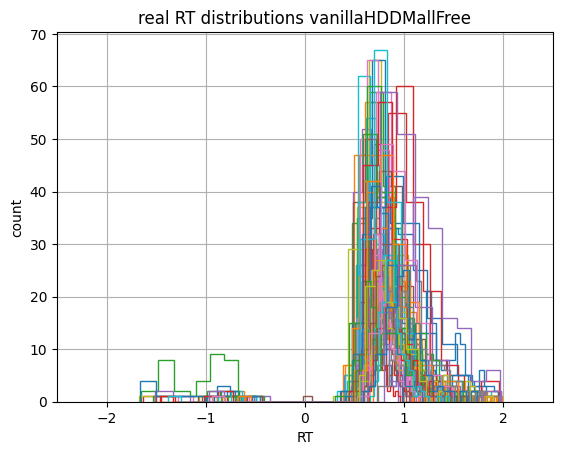

In [15]:
oddballDataDay2['rtPlot']=oddballDataDay2['rt']
oddballDataDay2.loc[oddballDataDay2['response'] == -1,'rtPlot']=oddballDataDay2.loc[oddballDataDay2['response'] == -1,'rtPlot']*-1
fig = plt.figure()
ax = fig.add_subplot(111, xlabel='RT', ylabel='count', title='real RT distributions vanillaHDDMallFree')
for i, subj_data in oddballDataDay2.groupby('participant_id'):
    subj_data.rtPlot.hist(bins=20, histtype='step', ax=ax)

plt.xlim(-2.5,2.5)   
plt.savefig('real_subRT_dist_vanillaAllFreeParams.pdf')

In [16]:
data=oddballDataDay2[:]
dataForModel = data[data['pupil'].notna()]

dataForModel = dataForModel.copy()
dataForModel = dataForModel[dataForModel['beta_insula'].notna()]

dataForModel = dataForModel.copy()
dataForModel = dataForModel[dataForModel['switch_condition_num'].notna()]


In [17]:
dataForModel

,id_runningnum,participant_id,agegrp,toi1,toi2,offset,trl_runningnum,event,trigger,artfree,...,beta_LC,pupil,LCr,trl_condition_bin,switch_condition,switch_condition_num,logreactiontime,logreactiontimez,response,rtPlot
1,1,42013,1,52293,54793,-1250,2,74,16,1,...,-0.771706,-0.275299,0.985568,1,stay_standard,1.0,-0.174549,-0.033526,1.0,0.839835
2,1,42013,1,54293,56793,-1250,3,78,16,1,...,-0.017799,1.874566,0.985568,2,switch_to_oddball,3.0,0.289645,1.666682,1.0,1.335954
3,1,42013,1,57293,59793,-1250,4,82,16,1,...,-0.247686,-0.516399,0.985568,2,stay_oddball,2.0,0.296416,1.691481,1.0,1.345030
4,1,42013,1,59293,61793,-1250,5,86,16,1,...,0.441441,0.710667,0.985568,1,switch_to_standard,4.0,-0.418396,-0.926666,1.0,0.658101
5,1,42013,1,61293,63793,-1250,6,90,16,1,...,1.490605,0.795430,0.985568,1,stay_standard,1.0,-0.238042,-0.266080,1.0,0.788170
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11284,77,62433,2,463649,466149,-1250,155,657,16,1,...,-1.274403,0.761824,0.386572,1,stay_standard,1.0,-0.137351,-0.110256,1.0,0.871665
11285,77,62433,2,465649,468149,-1250,156,661,16,1,...,-0.852999,-0.115871,0.386572,1,stay_standard,1.0,-0.197492,-0.575755,1.0,0.820787
11286,77,62433,2,470649,473149,-1250,157,665,16,1,...,1.145411,1.098559,0.386572,2,switch_to_oddball,3.0,0.066526,1.467764,1.0,1.068788
11287,77,62433,2,472649,475149,-1250,158,669,16,1,...,1.448574,-0.044915,0.386572,1,switch_to_standard,4.0,-0.082262,0.316131,1.0,0.921030


In [18]:
simple_ddm_model = hssm.HSSM(data=oddballDataDay2)

In [52]:
print(simple_ddm_model)

Hierarchical Sequential Sampling Model
Model: ddm

Response variable: rt,response
Likelihood: analytical
Observations: 11227

Parameters:

v:
    Prior: Normal(mu: 0.0, sigma: 2.0)
    Explicit bounds: (-inf, inf)
a:
    Prior: HalfNormal(sigma: 2.0)
    Explicit bounds: (0.0, inf)
z:
    Prior: Uniform(lower: 0.0, upper: 1.0)
    Explicit bounds: (0.0, 1.0)
t:
    Prior: HalfNormal(sigma: 2.0, initval: 0.10000000149011612)
    Explicit bounds: (0.0, inf)

Lapse probability: 0.05
Lapse distribution: Uniform(lower: 0.0, upper: 10.0)


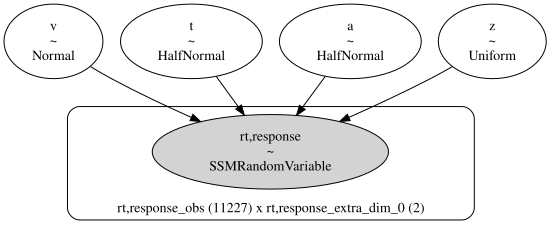

In [53]:
simple_ddm_model.graph()

In [27]:
help(hssm.HSSM)

Help on class HSSM in module hssm.hssm:

class HSSM(builtins.object)
 |  HSSM(data: pandas.core.frame.DataFrame, model: Union[Literal['ddm', 'ddm_sdv', 'full_ddm', 'angle', 'levy', 'ornstein', 'weibull', 'race_no_bias_angle_4', 'ddm_seq2_no_bias'], str] = 'ddm', include: list[dict | hssm.param.Param] | None = None, model_config: hssm.config.ModelConfig | dict | None = None, loglik: Union[str, os.PathLike, Callable, pytensor.graph.op.Op, type[pymc.distributions.distribution.Distribution], NoneType] = None, loglik_kind: Optional[Literal['analytical', 'approx_differentiable', 'blackbox']] = None, p_outlier: float | dict | bambi.priors.prior.Prior | None = 0.05, lapse: dict | bambi.priors.prior.Prior | None = Uniform(lower: 0.0, upper: 10.0), hierarchical: bool = False, link_settings: Optional[Literal['log_logit']] = None, prior_settings: Optional[Literal['safe']] = None, extra_namespace: dict[str, typing.Any] | None = None, **kwargs)
 |  
 |  The Hierarchical Sequential Sampling Model (HS

# set up different types of models

## fixing param values

In [15]:
simple_ddm_model_fixed_a = hssm.HSSM(data=oddballDataDay2,
                                  model="ddm",
                                  a=4.7)

                        

In [55]:
print(simple_ddm_model_fixed_a)

Hierarchical Sequential Sampling Model
Model: ddm

Response variable: rt,response
Likelihood: analytical
Observations: 11227

Parameters:

v:
    Prior: Normal(mu: 0.0, sigma: 2.0)
    Explicit bounds: (-inf, inf)
a:
    Prior: 4.7
    Explicit bounds: (0.0, inf)
z:
    Prior: Uniform(lower: 0.0, upper: 1.0)
    Explicit bounds: (0.0, 1.0)
t:
    Prior: HalfNormal(sigma: 2.0, initval: 0.10000000149011612)
    Explicit bounds: (0.0, inf)

Lapse probability: 0.05
Lapse distribution: Uniform(lower: 0.0, upper: 10.0)


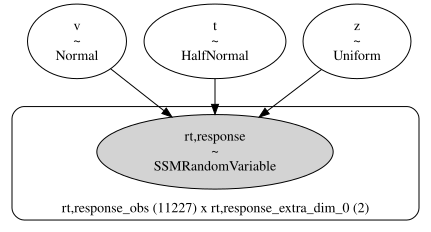

In [56]:
simple_ddm_model_fixed_a.graph()

## hierarchical models

We specify the regression as v ~ 1 + (1|subject)

(1|subject) tells the model to create a subject-wise offset for the intercept parameter. The rest of the regression  𝛽 's is fit globally.

Bambi backend is essentially a Bayesian version of lmer-like regression parameter specification for within- and between-subject effects.

As a previous HDDM user, you may recognize that now proper mixed-effect models are viable!

You should be able to handle between and within subject effects naturally now!

In [57]:
oddballDataDay2

,id_runningnum,id,agegrp,toi1,toi2,offset,trl_runningnum,event,trigger,artfree,...,beta_insula,beta_LC,pupil,LCr,trl_condition_bin,switch_condition,switch_condition_num,logreactiontime,logreactiontimez,response
0,1,42013,1,48306,50806,-1250,1,70,16,1,...,-0.010940,-0.997148,2.175158,0.985568,1,NaN,NaN,0.210081,1.375260,1.0
1,1,42013,1,52293,54793,-1250,2,74,16,1,...,-0.065556,-0.771706,-0.275299,0.985568,1,stay_standard,1.0,-0.174549,-0.033526,1.0
2,1,42013,1,54293,56793,-1250,3,78,16,1,...,0.509185,-0.017799,1.874566,0.985568,2,switch_to_oddball,3.0,0.289645,1.666682,1.0
3,1,42013,1,57293,59793,-1250,4,82,16,1,...,1.049503,-0.247686,-0.516399,0.985568,2,stay_oddball,2.0,0.296416,1.691481,1.0
4,1,42013,1,59293,61793,-1250,5,86,16,1,...,-0.611262,0.441441,0.710667,0.985568,1,switch_to_standard,4.0,-0.418396,-0.926666,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11284,77,62433,2,463649,466149,-1250,155,657,16,1,...,-0.901538,-1.274403,0.761824,0.386572,1,stay_standard,1.0,-0.137351,-0.110256,1.0
11285,77,62433,2,465649,468149,-1250,156,661,16,1,...,0.026958,-0.852999,-0.115871,0.386572,1,stay_standard,1.0,-0.197492,-0.575755,1.0
11286,77,62433,2,470649,473149,-1250,157,665,16,1,...,-0.940993,1.145411,1.098559,0.386572,2,switch_to_oddball,3.0,0.066526,1.467764,1.0
11287,77,62433,2,472649,475149,-1250,158,669,16,1,...,-0.779456,1.448574,-0.044915,0.386572,1,switch_to_standard,4.0,-0.082262,0.316131,1.0


In [63]:
simple_ddm_model_hier_v = hssm.HSSM(
    data=oddballDataDay2,
    model="ddm",
    include=[
        {
            "name": "v",
            "prior": {
                "Intercept": {
                    "name": "Uniform",
                    "lower": -3.0,
                    "upper": 3.0,
                    "initval": 0.0,
                },
                
            },
            "formula": "v ~ 1 + (1|id)",
            "link": "identity",
        }
        
    ],
)

In [64]:
print(simple_ddm_model_hier_v)

Hierarchical Sequential Sampling Model
Model: ddm

Response variable: rt,response
Likelihood: analytical
Observations: 11227

Parameters:

v:
    Formula: v ~ 1 + (1|id)
    Priors:
        v_Intercept ~ Uniform(lower: -3.0, upper: 3.0, initval: 0.0)
        v_1|id ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 2.5))
    Link: identity
    Explicit bounds: (-inf, inf)
a:
    Prior: HalfNormal(sigma: 2.0)
    Explicit bounds: (0.0, inf)
z:
    Prior: Uniform(lower: 0.0, upper: 1.0)
    Explicit bounds: (0.0, 1.0)
t:
    Prior: HalfNormal(sigma: 2.0, initval: 0.10000000149011612)
    Explicit bounds: (0.0, inf)

Lapse probability: 0.05
Lapse distribution: Uniform(lower: 0.0, upper: 10.0)


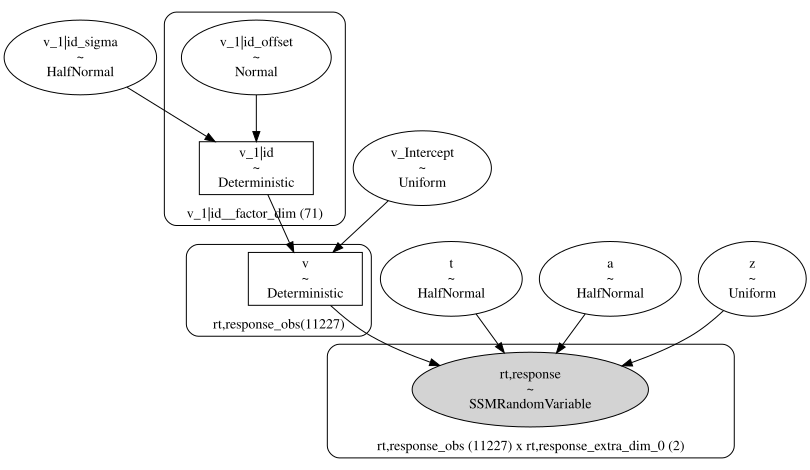

In [65]:
simple_ddm_model_hier_v.graph()

In [66]:
simple_ddm_model_hier_vz = hssm.HSSM(
    data=oddballDataDay2,
    model="ddm",
    a=4.7,
    include=[
        {
            "name": "v",
            "prior": {
                "Intercept": {
                    "name": "Uniform",
                    "lower": -3.0,
                    "upper": 3.0,
                    "initval": 0.0,
                },
                
            },
            "formula": "v ~ 1 + (1|id)",
            "link": "identity",
        },
        {
            "name": "z",
            "prior": {
                "Intercept": {
                    "name": "Uniform",
                    "lower": -1,
                    "upper": 1,
                    "initval": 0.0,
                },
                
            },
            "formula": "z ~ 1 + (1|id)",
            "link": "identity",
        }
        
    ],
)

In [67]:
print(simple_ddm_model_hier_vz)

Hierarchical Sequential Sampling Model
Model: ddm

Response variable: rt,response
Likelihood: analytical
Observations: 11227

Parameters:

v:
    Formula: v ~ 1 + (1|id)
    Priors:
        v_Intercept ~ Uniform(lower: -3.0, upper: 3.0, initval: 0.0)
        v_1|id ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 2.5))
    Link: identity
    Explicit bounds: (-inf, inf)
a:
    Prior: 4.7
    Explicit bounds: (0.0, inf)
z:
    Formula: z ~ 1 + (1|id)
    Priors:
        z_Intercept ~ Uniform(lower: -1.0, upper: 1.0, initval: 0.0)
        z_1|id ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 1.0))
    Link: identity
    Explicit bounds: (0.0, 1.0)
t:
    Prior: HalfNormal(sigma: 2.0, initval: 0.10000000149011612)
    Explicit bounds: (0.0, inf)

Lapse probability: 0.05
Lapse distribution: Uniform(lower: 0.0, upper: 10.0)


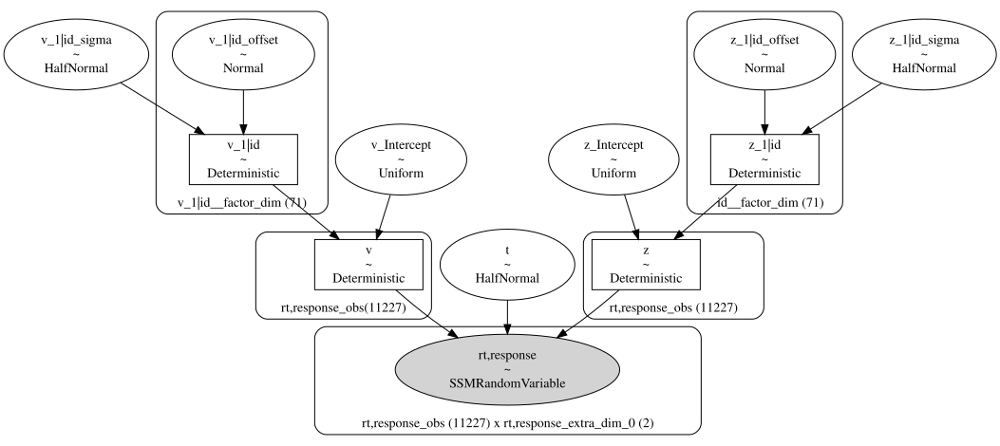

In [68]:
simple_ddm_model_hier_vz.graph()

### hierarchical without piror definition

In [10]:
simple_ddm_model_hier_all_noPrior = hssm.HSSM(
    data=oddballDataDay2,
    model="ddm",
    hierarchical=True)

In [111]:
print(simple_ddm_model_hier_all_noPrior)

Hierarchical Sequential Sampling Model
Model: ddm

Response variable: rt,response
Likelihood: analytical
Observations: 11227

Parameters:

v:
    Formula: v ~ 1 + (1|participant_id)
    Priors:
        v_Intercept ~ Normal(mu: 2.0, sigma: 3.0)
        v_1|participant_id ~ Normal(mu: 0.0, sigma: Weibull(alpha: 1.5, beta: 0.30000001192092896))
    Link: identity
    Explicit bounds: (-inf, inf)
a:
    Formula: a ~ 1 + (1|participant_id)
    Priors:
        a_Intercept ~ Gamma(mu: 1.5, sigma: 0.75)
        a_1|participant_id ~ Normal(mu: 0.0, sigma: Weibull(alpha: 1.5, beta: 0.30000001192092896))
    Link: identity
    Explicit bounds: (0.0, inf)
z:
    Formula: z ~ 1 + (1|participant_id)
    Priors:
        z_Intercept ~ Gamma(mu: 10.0, sigma: 10.0)
        z_1|participant_id ~ Normal(mu: 0.0, sigma: Weibull(alpha: 1.5, beta: 0.30000001192092896))
    Link: identity
    Explicit bounds: (0.0, 1.0)
t:
    Formula: t ~ 1 + (1|participant_id)
    Priors:
        t_Intercept ~ Gamma(mu: 0.40

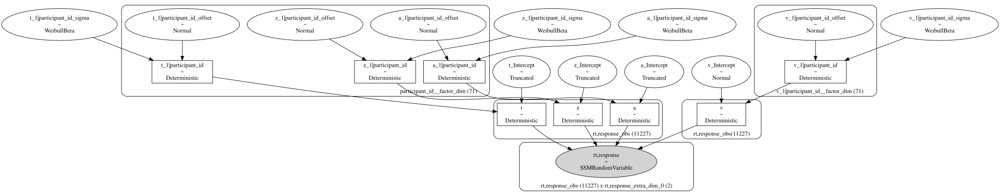

In [112]:
simple_ddm_model_hier_all_noPrior.graph()

In [110]:
ddm_model_hier_aFix_dependsSwitch_trialNeuReg = hssm.HSSM(
    data=dataForModel,
    model="ddm",
    a=3.47,
    hierarchical=True,
    noncentered=False,
    include=[
        {
            "name": "v",
            "formula": "v ~ 1 + (1|participant_id)+(switch_condition_num|participant_id)+(pupil|participant_id)+(beta_insula|participant_id)",
            "link": "identity",
        }
    ],    
)

passed


In [111]:
ddm_model_hier_aFix_dependsSwitch_trialNeuReg.pymc_model.initial_point()

{'v_Intercept': array(0., dtype=float32),
 'v_1|participant_id_sigma_log__': array(-1.3062876, dtype=float32),
 'v_1|participant_id': array([-0.00690686,  0.00779251, -0.00806417,  0.00400203,  0.00933892,
        -0.00840557,  0.00368956, -0.00568292,  0.00767498, -0.00018746,
        -0.00522726, -0.00790969,  0.00493375, -0.00949583, -0.0028661 ,
         0.00672674, -0.0030876 ,  0.00326746, -0.00537938, -0.00433441,
         0.00461089, -0.00239787, -0.00224127,  0.00466725, -0.00234188,
         0.00818704,  0.00585225,  0.00819264,  0.00197278, -0.00950646,
         0.00328773, -0.00197129,  0.00457739, -0.00259348,  0.0035795 ,
         0.00186514,  0.00190791, -0.00163006,  0.00793232,  0.00471201,
        -0.00917928, -0.00735589, -0.00438758, -0.00085184,  0.0065359 ,
        -0.00455646, -0.00252304, -0.003236  , -0.00846035,  0.00076053,
        -0.00871446, -0.00374047, -0.00595446, -0.00216263, -0.00512626,
        -0.00427687, -0.006683  ,  0.00572407,  0.00429805,  0.0

In [113]:
ddm_model_hier_aFix_dependsSwitch_trialNeuReg.params

{'v': v:
     Formula: v ~ 1 + (1|participant_id)+(switch_condition_num|participant_id)+(pupil|participant_id)+(beta_insula|participant_id)
     Priors:
         Intercept ~ Normal(mu: 0.0, sigma: 0.25)
         1|participant_id ~ Normal(mu: 0.0, sigma: Weibull(alpha: 1.5, beta: 0.30000001192092896))
         switch_condition_num|participant_id ~ Normal(mu: Normal(mu: 0.0, sigma: 0.25), sigma: Weibull(alpha: 1.5, beta: 0.30000001192092896))
         pupil|participant_id ~ Normal(mu: Normal(mu: 0.0, sigma: 0.25), sigma: Weibull(alpha: 1.5, beta: 0.30000001192092896))
         beta_insula|participant_id ~ Normal(mu: Normal(mu: 0.0, sigma: 0.25), sigma: Weibull(alpha: 1.5, beta: 0.30000001192092896))
     Link: identity
     Explicit bounds: (-inf, inf),
 'a': a:
     Value: 3.47,
 'z': z:
     Formula: z ~ 1 + (1|participant_id)
     Priors:
         Intercept ~ Beta(alpha: 10.0, beta: 10.0)
         1|participant_id ~ Normal(mu: 0.0, sigma: Weibull(alpha: 1.5, beta: 0.30000001192092896)

In [ ]:
inferenceData_simple_ddm_model_hier_aFix_dependsSwitch_trialNeuReg=ddm_model_hier_aFix_dependsSwitch_trialNeuReg.sample(
    sampler="nuts_numpyro",
    chains=2,
    cores=1,
    draws=3000,
    tune=1000,
    
    idata_kwargs=dict(log_likelihood=True),)

# run models

## hierachical all free params examples:

In [16]:
inferenceData_simple_ddm_model_hier_all_noPrior=simple_ddm_model_hier_all_noPrior.sample(
    sampler="mcmc",
    chains=2,
    cores=4,
    draws=10,
    tune=2,
    idata_kwargs=dict(log_likelihood=True),)
    

Only 10 samples per chain. Reliable r-hat and ESS diagnostics require longer chains for accurate estimate.
Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [v_Intercept, v_1|participant_id_sigma, v_1|participant_id_offset, a_Intercept, a_1|participant_id_sigma, a_1|participant_id_offset, z_Intercept, z_1|participant_id_sigma, z_1|participant_id_offset, t_Intercept, t_1|participant_id_sigma, t_1|participant_id_offset]


Output()

Sampling 2 chains for 2 tune and 10 draw iterations (4 + 20 draws total) took 0 seconds.


There were 20 divergences after tuning. Increase `target_accept` or reparameterize.
The number of samples is too small to check convergence reliably.


In [137]:
type(inferenceData_simple_ddm_model_hier_all_noPrior)

arviz.data.inference_data.InferenceData

In [140]:
type(simple_ddm_model_hier_all_noPrior)

hssm.hssm.HSSM

In [138]:
inferenceData_simple_ddm_model_hier_all_noPrior

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

In [126]:
basepath

'/mnt/beegfs/home/tli/oddballLearningMPIB'

In [139]:
#This table returns the parameter-wise mean of our posterior and a few extra statistics.
az.summary(inferenceData_simple_ddm_model_hier_all_noPrior)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
v_Intercept,2.028,0.009,2.015,2.047,0.005,0.004,3.0,11.0,2.24
v_1|participant_id_sigma,0.271,0.001,0.270,0.272,0.000,0.000,3.0,11.0,1.91
a_Intercept,1.398,0.011,1.379,1.417,0.007,0.005,3.0,11.0,1.84
a_1|participant_id_sigma,0.271,0.001,0.270,0.272,0.001,0.001,3.0,23.0,1.94
z_Intercept,0.510,0.002,0.506,0.514,0.001,0.001,3.0,11.0,2.17
...,...,...,...,...,...,...,...,...,...
t[11222],0.374,0.004,0.366,0.381,0.003,0.002,3.0,11.0,1.83
t[11223],0.374,0.004,0.366,0.381,0.003,0.002,3.0,11.0,1.83
t[11224],0.374,0.004,0.366,0.381,0.003,0.002,3.0,11.0,1.83
t[11225],0.374,0.004,0.366,0.381,0.003,0.002,3.0,11.0,1.83


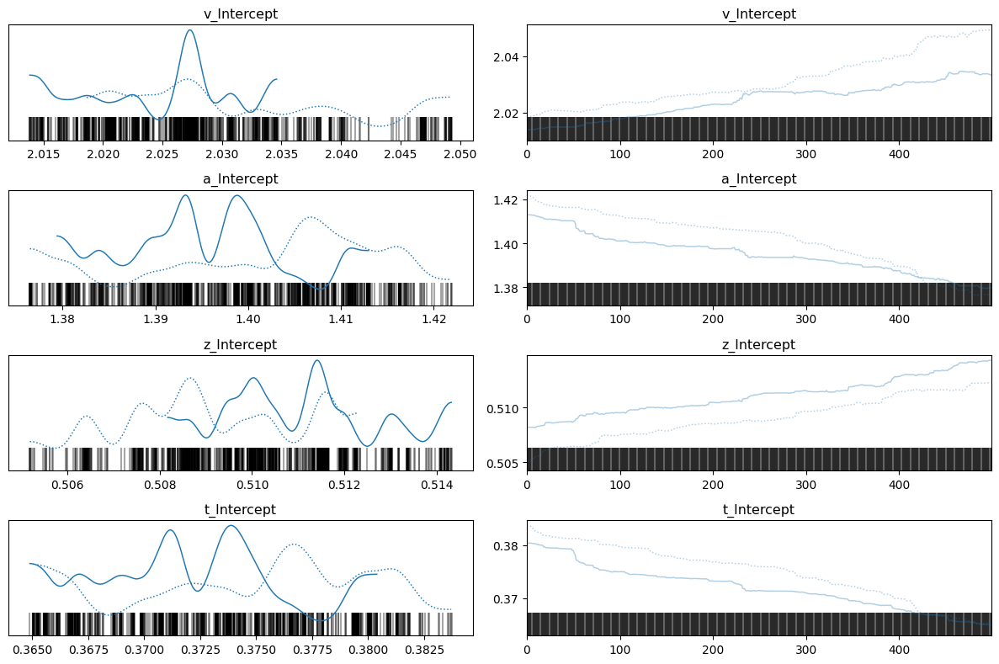

In [ ]:
az.plot_trace(
    inferenceData_simple_ddm_model_hier_all_noPrior, var_names=['v_Intercept','a_Intercept','z_Intercept','t_Intercept']
)
plt.tight_layout()

## hierachical vanilla fix a examples:

In [7]:
simple_ddm_model_hier_aFix_noPrior = hssm.HSSM(
    data=oddballDataDay2,
    model="ddm",
    a=4.7,
    hierarchical=True,
    )

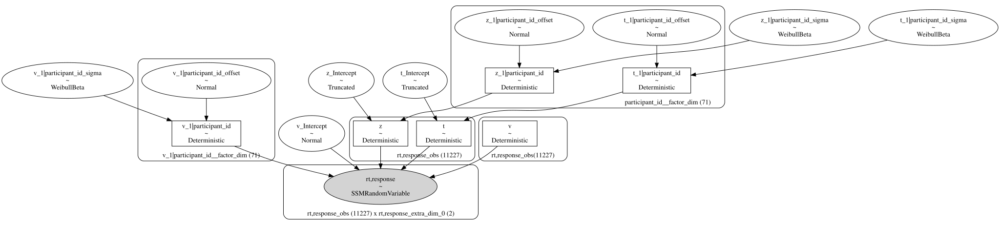

In [8]:
simple_ddm_model_hier_aFix_noPrior.graph()

In [147]:
simple_ddm_model_hier_aFix_noPrior

Hierarchical Sequential Sampling Model
Model: ddm

Response variable: rt,response
Likelihood: analytical
Observations: 11227

Parameters:

v:
    Formula: v ~ 1 + (1|participant_id)
    Priors:
        v_Intercept ~ Normal(mu: 2.0, sigma: 3.0)
        v_1|participant_id ~ Normal(mu: 0.0, sigma: Weibull(alpha: 1.5, beta: 0.30000001192092896))
    Link: identity
    Explicit bounds: (-inf, inf)
a:
    Prior: 4.7
    Explicit bounds: (0.0, inf)
z:
    Formula: z ~ 1 + (1|participant_id)
    Priors:
        z_Intercept ~ Gamma(mu: 10.0, sigma: 10.0)
        z_1|participant_id ~ Normal(mu: 0.0, sigma: Weibull(alpha: 1.5, beta: 0.30000001192092896))
    Link: identity
    Explicit bounds: (0.0, 1.0)
t:
    Formula: t ~ 1 + (1|participant_id)
    Priors:
        t_Intercept ~ Gamma(mu: 0.4000000059604645, sigma: 0.20000000298023224)
        t_1|participant_id ~ Normal(mu: 0.0, sigma: Weibull(alpha: 1.5, beta: 0.30000001192092896))
    Link: identity
    Explicit bounds: (0.0, inf)

Lapse prob

In [9]:
inferenceData_simple_ddm_model_hier_aFix_noPrior=simple_ddm_model_hier_aFix_noPrior.sample(
    sampler="mcmc",
    chains=2,
    cores=4,
    draws=500,
    tune=100,
    idata_kwargs=dict(log_likelihood=True),)

Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [v_Intercept, v_1|participant_id_sigma, v_1|participant_id_offset, z_Intercept, z_1|participant_id_sigma, z_1|participant_id_offset, t_Intercept, t_1|participant_id_sigma, t_1|participant_id_offset]


/home/mpib/tli/.conda/envs/hssm_may_test/lib/python3.11/site-packages/rich/live.py:231: UserWarning: install 
"ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 2 chains for 100 tune and 500 draw iterations (200 + 1_000 draws total) took 236 seconds.


There were 1000 divergences after tuning. Increase `target_accept` or reparameterize.
We recommend running at least 4 chains for robust computation of convergence diagnostics
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


## hierarchical a fixed, z depends on switch condition and trial neural covariates 

In [30]:
ddm_model_hier_aFix_dependsSwitch = hssm.HSSM(
    data=dataForModel,
    model="ddm",
    a=4.7,
    hierarchical=True,
    include=[
        {
            "name": "z",
            "formula": "z ~ 1 + (1|participant_id)+(1|switch_condition_num)",
            "link": "identity",
        }
    ],    
)

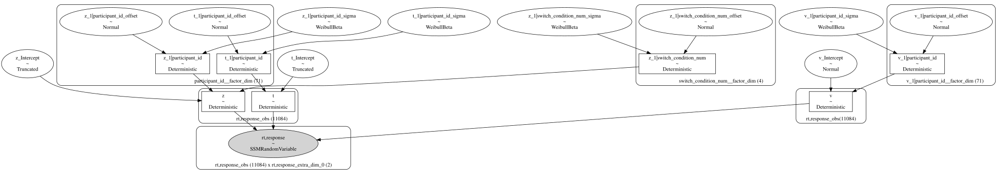

In [31]:
ddm_model_hier_aFix_dependsSwitch.graph()

## hierarchical a fixed, z depends on switch condition and trial neural covariates

In [44]:
dataForModel['switch_condition_num']=isinstance(dataForModel['switch_condition_num'].dtype, CategoricalDtype)



In [45]:
ddm_model_hier_aFix_dependsSwitch_trialNeuReg = hssm.HSSM(
    data=dataForModel,
    model="ddm",
    a=4.7,
    hierarchical=True,
    include=[
        {
            "name": "z",
            "formula": "z ~ 1 + (1|participant_id)+(switch_condition_num|participant_id)+(pupil|participant_id)+(beta_insula|participant_id)",
            "link": "identity",
        }
    ],    
)

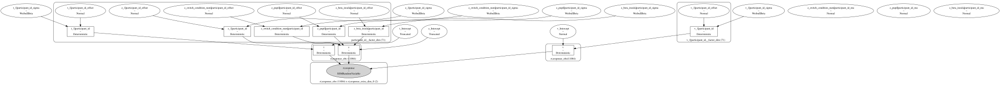

In [46]:
ddm_model_hier_aFix_dependsSwitch_trialNeuReg.graph()

In [6]:

    basepath = '/mnt/beegfs/home/tli/oddballLearningMPIB'

    # Check whether save directories exist; if not, create them
    pathlib.Path(basepath+'/models/hssm/aVals/').mkdir(parents=True, exist_ok=True)
    pathlib.Path(basepath+'/results/hssm/').mkdir(parents=True, exist_ok=True)
    pathlib.Path(basepath+'/plots/hssm/').mkdir(parents=True, exist_ok=True)
    pathlib.Path(basepath+'/ppc/hssm/').mkdir(parents=True, exist_ok=True)
    pathlib.Path(basepath+'/models/hssm/ssms').mkdir(parents=True, exist_ok=True)


    
    df = pd.read_csv(basepath+'/data/OB_singletrial_YAOA.csv')
    df['response'] = df['accuracy']
    # And then modify the 'response' column where the condition is met
    df.loc[df['response'] == 0, 'response'] = -1

    df.rename(columns={'reactiontime': 'rt'}, inplace=True)
    df.rename(columns={'id': 'participant_id'}, inplace=True)

    oddballDataDay2 = df[df['response'].notna()]

    data=oddballDataDay2[:]
    dataForModel = data[data['pupil'].notna()]

    dataForModel = dataForModel.copy()
    dataForModel = dataForModel[dataForModel['beta_insula'].notna()]

    dataForModel = dataForModel.copy()
    dataForModel = dataForModel[dataForModel['switch_condition_num'].notna()]


    dataForModel['switch_condition_num']=isinstance(dataForModel['switch_condition_num'].dtype, CategoricalDtype)


    ddm_model_hier_aFix_dependsSwitch_trialNeuReg = hssm.HSSM(
        data=dataForModel,
        model="ddm",
        a=6,
        hierarchical=True,
        include=[
            {
                "name": "z",
                "formula": "z ~ 1 + (1|participant_id)+(switch_condition_num|participant_id)+(pupil|participant_id)+(beta_insula|participant_id)",
                "link": "identity",
            }
        ],    
    )

    inferenceData_simple_ddm_model_hier_aFix_dependsSwitch_trialNeuReg=ddm_model_hier_aFix_dependsSwitch_trialNeuReg.sample(
        sampler="mcmc",
        chains=2,
        cores=4,
        draws=10,
        tune=5,
        idata_kwargs=dict(log_likelihood=True),)

    fileName = basepath + '/models/hssm/aVals/inferenceData_simple_ddm_model_hier_aFix_dependsSwitch_trialNeuReg_'+str(aVal)+'.nc'
    data = inferenceData_simple_ddm_model_hier_aFix_dependsSwitch_trialNeuReg
    az.to_netcdf(data, fileName)
    
    
    print('DONE')

passed


Only 10 samples per chain. Reliable r-hat and ESS diagnostics require longer chains for accurate estimate.
Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [v_Intercept, v_1|participant_id_sigma, v_1|participant_id_offset, z_Intercept, z_1|participant_id_sigma, z_1|participant_id_offset, z_switch_condition_num|participant_id_mu, z_switch_condition_num|participant_id_sigma, z_switch_condition_num|participant_id_offset, z_pupil|participant_id_mu, z_pupil|participant_id_sigma, z_pupil|participant_id_offset, z_beta_insula|participant_id_mu, z_beta_insula|participant_id_sigma, z_beta_insula|participant_id_offset, t_Intercept, t_1|participant_id_sigma, t_1|participant_id_offset]


/home/mpib/tli/.conda/envs/hssm_may_test/lib/python3.11/site-packages/rich/live.py:231: UserWarning: install 
"ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 2 chains for 5 tune and 10 draw iterations (10 + 20 draws total) took 1 seconds.


There were 20 divergences after tuning. Increase `target_accept` or reparameterize.
The number of samples is too small to check convergence reliably.


NameError: name 'aVal' is not defined

# see model results from real data inference

## load in the inference data container in NetCDF format

In [20]:
vanillaHDDMallFree_inferenceData=az.from_netcdf(basepath+'/models/hssm/inferenceData_simple_ddm_model_hier_all_noPrior.nc')
HDDMaFixed_inferenceData=az.from_netcdf(basepath+'/models/hssm/inferenceData_simple_ddm_model_hier_aFixed_noPrior.nc')
HDDMaFixedPupilInsulaBias_inferenceData=az.from_netcdf(basepath+'/models/hssm/inferenceData_simple_ddm_model_hier_aFix_dependsSwitch_trialNeuReg.nc')
HDDMaFixedBias_inferenceData=az.from_netcdf(basepath+'/models/hssm/inferenceData_simple_ddm_model_hier_aFix_dependsSwitch_bias.nc')
HDDMaFixedDriftRate_inferenceData=az.from_netcdf(basepath+'/models/hssm/inferenceData_simple_ddm_model_hier_aFix_dependsSwitch_driftRate.nc')
HDDMaFixedPupilInsulaDriftRate_inferenceData=az.from_netcdf(basepath+'/models/hssm/inferenceData_simple_ddm_model_hier_aFix_dependsSwitch_trialNeuReg_driftRate.nc')


### first look at containers

In [7]:
HDDMaFixed_inferenceData

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

In [13]:
HDDMaFixedPupilInsula_inferenceData

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

In [11]:
vanillaHDDMallFree_inferenceData

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

### sample stats check convergence 

In [8]:
vanillaHDDMallFree_inferenceData_ess = az.ess(vanillaHDDMallFree_inferenceData,var_names=['~a','~z','~t'])
vanillaHDDMallFree_inferenceData_r_hat = az.rhat(vanillaHDDMallFree_inferenceData,var_names=['~a','~z','~t'])


In [9]:
HDDMaFixed_inferenceData_ess = az.ess(HDDMaFixed_inferenceData,var_names=['~t','~z'])
HDDMaFixed_inferenceDatar_r_hat = az.rhat(HDDMaFixed_inferenceData,var_names=['~t','~z'])


In [10]:
HDDMaFixedPupilInsula_inferenceData_ess = az.ess(HDDMaFixedPupilInsula_inferenceData,var_names=['~t','~z'])
HDDMaFixedPupilInsula_inferenceData_r_hat = az.rhat(HDDMaFixedPupilInsula_inferenceData,var_names=['~t','~z'])


In [52]:
print(vanillaHDDMallFree_inferenceData_ess)

<xarray.Dataset>
Dimensions:                         (v_1|participant_id__factor_dim: 71,
                                     participant_id__factor_dim: 71)
Coordinates:
  * v_1|participant_id__factor_dim  (v_1|participant_id__factor_dim) <U5 '420...
  * participant_id__factor_dim      (participant_id__factor_dim) <U5 '42013' ...
Data variables:
    v_Intercept                     float64 2.172
    v_1|participant_id_sigma        float64 2.902
    a_Intercept                     float64 2.429
    a_1|participant_id_sigma        float64 2.351
    z_Intercept                     float64 2.381
    z_1|participant_id_sigma        float64 2.504
    t_Intercept                     float64 2.546
    t_1|participant_id_sigma        float64 2.418
    v_1|participant_id              (v_1|participant_id__factor_dim) float64 ...
    a_1|participant_id              (participant_id__factor_dim) float64 2.50...
    z_1|participant_id              (participant_id__factor_dim) float64 2.55...
    t_1

In [54]:
vanillaHDDMallFree_inferenceData_r_hat

<xarray.Dataset>
Dimensions:                         (v_1|participant_id__factor_dim: 71,
                                     participant_id__factor_dim: 71)
Coordinates:
  * v_1|participant_id__factor_dim  (v_1|participant_id__factor_dim) <U5 '420...
  * participant_id__factor_dim      (participant_id__factor_dim) <U5 '42013' ...
Data variables:
    v_Intercept                     float64 3.662
    v_1|participant_id_sigma        float64 1.899
    a_Intercept                     float64 2.45
    a_1|participant_id_sigma        float64 2.684
    z_Intercept                     float64 2.552
    z_1|participant_id_sigma        float64 2.292
    t_Intercept                     float64 2.205
    t_1|participant_id_sigma        float64 2.553
    v_1|participant_id              (v_1|participant_id__factor_dim) float64 ...
    a_1|participant_id              (participant_id__factor_dim) float64 2.32...
    z_1|participant_id              (participant_id__factor_dim) float64 2.26...
    t_1|participant_id              (participant_id__factor_dim) float64 1.87...

In [55]:
HDDMaFixed_inferenceDatar_r_hat

<xarray.Dataset>
Dimensions:                         (v_1|participant_id__factor_dim: 71,
                                     participant_id__factor_dim: 71)
Coordinates:
  * v_1|participant_id__factor_dim  (v_1|participant_id__factor_dim) <U5 '420...
  * participant_id__factor_dim      (participant_id__factor_dim) <U5 '42013' ...
Data variables:
    v_Intercept                     float64 1.037
    v_1|participant_id_sigma        float64 1.006
    z_Intercept                     float64 1.003
    z_1|participant_id_sigma        float64 1.016
    t_Intercept                     float64 1.011
    t_1|participant_id_sigma        float64 1.006
    v_1|participant_id              (v_1|participant_id__factor_dim) float64 ...
    z_1|participant_id              (participant_id__factor_dim) float64 1.00...
    t_1|participant_id              (participant_id__factor_dim) float64 1.00...

In [53]:
HDDMaFixedPupilInsula_inferenceData_r_hat

<xarray.Dataset>
Dimensions:                                      (
                                                  v_1|participant_id__factor_dim: 71,
                                                  participant_id__factor_dim: 71)
Coordinates:
  * v_1|participant_id__factor_dim               (v_1|participant_id__factor_dim) <U5 ...
  * participant_id__factor_dim                   (participant_id__factor_dim) <U5 ...
Data variables: (12/18)
    v_Intercept                                  float64 1.05
    z_switch_condition_num|participant_id_mu     float64 1.002
    z_pupil|participant_id_mu                    float64 1.013
    z_beta_insula|participant_id_mu              float64 1.004
    v_1|participant_id_sigma                     float64 1.04
    z_Intercept                                  float64 1.005
    ...                                           ...
    v_1|participant_id                           (v_1|participant_id__factor_dim) float64 ...
    z_1|participant_id                           (participant_id__factor_dim) float64 ...
    z_switch_condition_num|participant_id        (participant_id__factor_dim) float64 ...
    z_pupil|participant_id                       (participant_id__factor_dim) float64 ...
    z_beta_insula|participant_id                 (participant_id__factor_dim) float64 ...
    t_1|participant_id                           (participant_id__factor_dim) float64 ...

### summary of inference data

In [21]:
#This table returns the parameter-wise mean of our posterior and a few extra statistics.
az.summary(vanillaHDDMallFree_inferenceData,var_names=['~a','~z','~t'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
v_Intercept,2.021,0.005,2.017,2.028,0.003,0.003,2.0,2.0,3.66
v_1|participant_id_sigma,0.271,0.001,0.270,0.272,0.001,0.001,3.0,44.0,1.90
a_Intercept,1.405,0.068,1.327,1.491,0.047,0.040,2.0,11.0,2.45
a_1|participant_id_sigma,0.271,0.001,0.270,0.272,0.001,0.001,2.0,8.0,2.68
z_Intercept,0.573,0.056,0.510,0.638,0.039,0.033,2.0,11.0,2.55
...,...,...,...,...,...,...,...,...,...
t_1|participant_id[62403],-0.000,0.000,-0.001,0.000,0.000,0.000,2.0,11.0,2.41
t_1|participant_id[62413],-0.001,0.000,-0.001,-0.000,0.000,0.000,3.0,22.0,2.14
t_1|participant_id[62423],0.000,0.000,0.000,0.000,0.000,0.000,3.0,19.0,2.03
t_1|participant_id[62433],-0.000,0.001,-0.001,0.000,0.000,0.000,3.0,11.0,1.97


In [22]:
az.summary(HDDMaFixed_inferenceData,var_names=['~t','~z'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
v_Intercept,3.977,0.098,3.800,4.163,0.011,0.008,75.0,191.0,1.04
v_1|participant_id_sigma,0.660,0.068,0.536,0.790,0.005,0.004,196.0,315.0,1.01
z_Intercept,0.811,0.007,0.797,0.824,0.001,0.000,138.0,287.0,1.00
z_1|participant_id_sigma,0.043,0.006,0.032,0.054,0.001,0.000,142.0,307.0,1.02
t_Intercept,0.401,0.013,0.375,0.427,0.001,0.001,81.0,93.0,1.01
...,...,...,...,...,...,...,...,...,...
t_1|participant_id[62403],0.044,0.039,-0.029,0.119,0.003,0.002,152.0,197.0,1.03
t_1|participant_id[62413],0.080,0.050,-0.008,0.178,0.003,0.002,314.0,738.0,1.01
t_1|participant_id[62423],-0.019,0.039,-0.097,0.049,0.002,0.002,268.0,627.0,1.00
t_1|participant_id[62433],0.123,0.036,0.053,0.194,0.002,0.002,280.0,318.0,1.00


In [23]:
az.summary(HDDMaFixedPupilInsulaBias_inferenceData,var_names=['~t','~z'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
v_Intercept,4.155,0.097,3.981,4.335,0.015,0.010,41.0,99.0,1.05
z_switch_condition_num|participant_id_mu,0.012,0.241,-0.464,0.429,0.012,0.009,378.0,679.0,1.00
z_pupil|participant_id_mu,0.025,0.237,-0.440,0.450,0.017,0.012,203.0,443.0,1.01
z_beta_insula|participant_id_mu,0.014,0.251,-0.453,0.472,0.013,0.009,367.0,720.0,1.00
v_1|participant_id_sigma,0.704,0.075,0.567,0.841,0.009,0.007,65.0,185.0,1.04
...,...,...,...,...,...,...,...,...,...
t_1|participant_id[62403],0.054,0.043,-0.028,0.134,0.005,0.003,79.0,152.0,1.01
t_1|participant_id[62413],0.068,0.049,-0.022,0.161,0.005,0.004,90.0,284.0,1.03
t_1|participant_id[62423],-0.021,0.036,-0.090,0.045,0.003,0.002,137.0,250.0,1.01
t_1|participant_id[62433],0.118,0.039,0.047,0.190,0.006,0.005,37.0,137.0,1.07


In [24]:
az.summary(vanillaHDDMallFree_inferenceData,var_names=['v_Intercept','a_Intercept','z_Intercept','t_Intercept'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
v_Intercept,2.021,0.005,2.017,2.028,0.003,0.003,2.0,2.0,3.66
a_Intercept,1.405,0.068,1.327,1.491,0.047,0.040,2.0,11.0,2.45
z_Intercept,0.573,0.056,0.510,0.638,0.039,0.033,2.0,11.0,2.55
t_Intercept,0.372,0.029,0.339,0.402,0.020,0.017,3.0,11.0,2.21


In [26]:
az.summary(HDDMaFixed_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
v_Intercept,3.977,0.098,3.800,4.163,0.011,0.008,75.0,191.0,1.04
z_Intercept,0.811,0.007,0.797,0.824,0.001,0.000,138.0,287.0,1.00
t_Intercept,0.401,0.013,0.375,0.427,0.001,0.001,81.0,93.0,1.01


In [27]:
az.summary(HDDMaFixedPupilInsulaBias_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
v_Intercept,4.155,0.097,3.981,4.335,0.015,0.010,41.0,99.0,1.05
z_Intercept,0.801,0.008,0.786,0.816,0.001,0.001,120.0,303.0,1.01
t_Intercept,0.399,0.014,0.374,0.428,0.005,0.003,10.0,25.0,1.14


In [28]:
az.summary(HDDMaFixedBias_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
v_Intercept,4.046,0.101,3.853,4.226,0.006,0.004,325.0,830.0,1.00
z_Intercept,0.738,0.011,0.717,0.758,0.001,0.000,465.0,843.0,1.00
t_Intercept,0.398,0.013,0.375,0.422,0.001,0.001,305.0,588.0,1.02


In [29]:
az.summary(HDDMaFixedDriftRate_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
v_Intercept,3.168,0.204,2.753,3.502,0.025,0.018,67.0,151.0,1.02
z_Intercept,0.751,0.010,0.734,0.770,0.001,0.001,197.0,466.0,1.00
t_Intercept,0.411,0.011,0.390,0.432,0.001,0.001,113.0,339.0,1.01


In [30]:
az.summary(HDDMaFixedPupilInsulaDriftRate_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
v_Intercept,3.006,0.378,2.361,3.677,0.089,0.067,17.0,90.0,1.11
z_Intercept,0.728,0.013,0.704,0.752,0.001,0.001,108.0,212.0,1.02
t_Intercept,0.395,0.013,0.370,0.420,0.001,0.001,152.0,234.0,1.01


### trace plots

/home/mpib/tli/.conda/envs/hssm_test/lib/python3.11/site-packages/arviz/stats/density_utils.py:488: UserWarning: Your data appears to have a single value or no finite values
  warnings.warn("Your data appears to have a single value or no finite values")


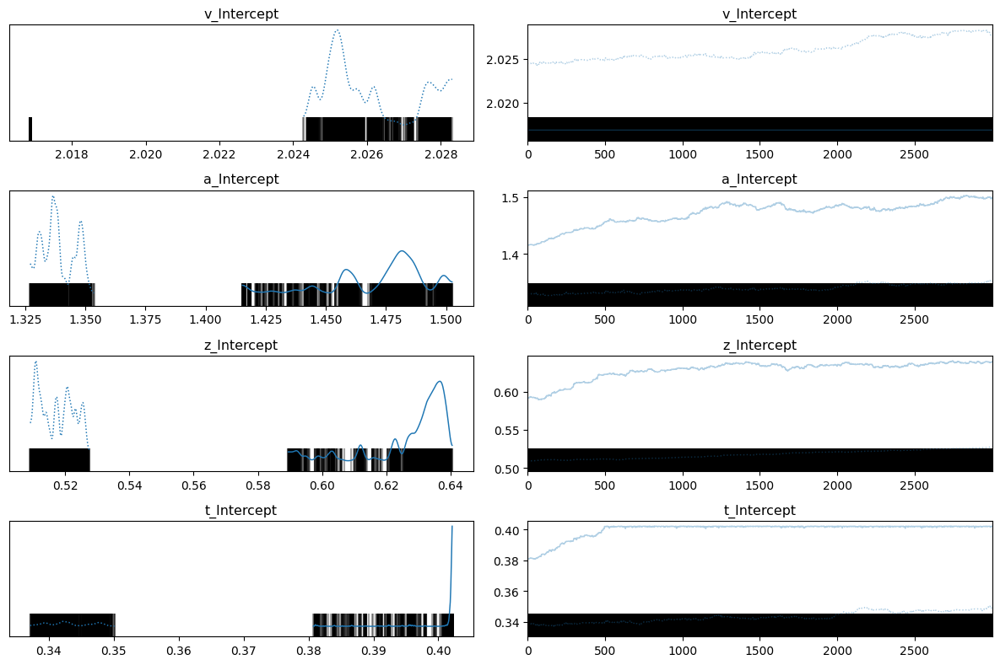

In [31]:
az.plot_trace(
    vanillaHDDMallFree_inferenceData,var_names=['v_Intercept','a_Intercept','z_Intercept','t_Intercept']
)
plt.tight_layout()

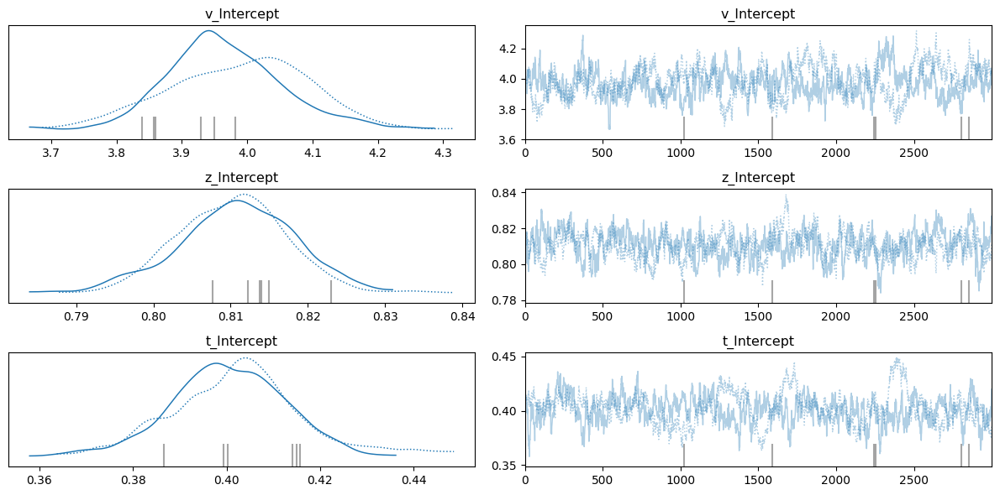

In [32]:
az.plot_trace(
    HDDMaFixed_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept']
)
plt.tight_layout()

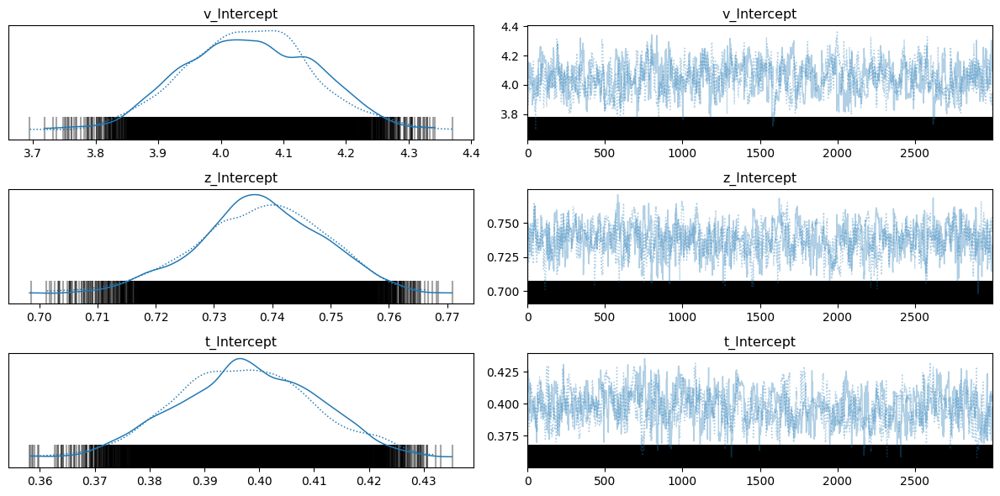

In [35]:
az.plot_trace(
    HDDMaFixedBias_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept']
)
plt.tight_layout()

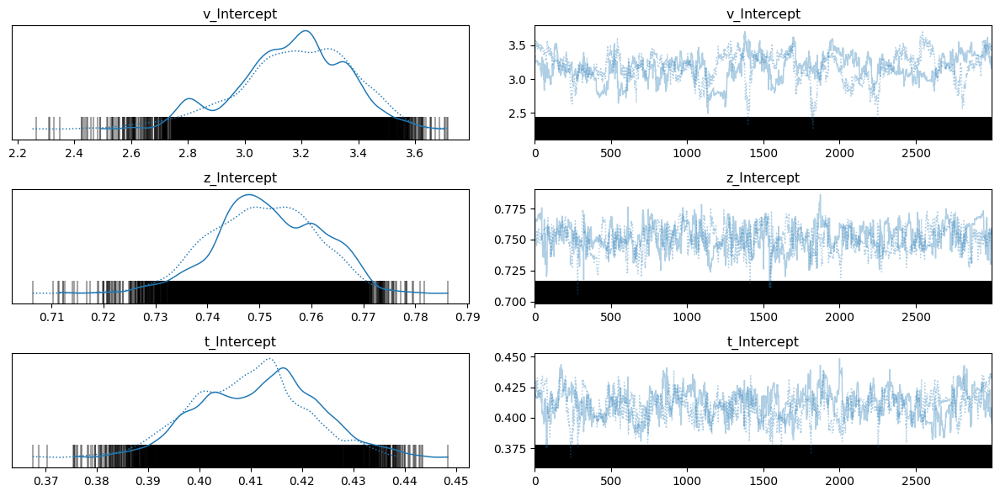

In [36]:
az.plot_trace(
    HDDMaFixedDriftRate_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept']
)
plt.tight_layout()

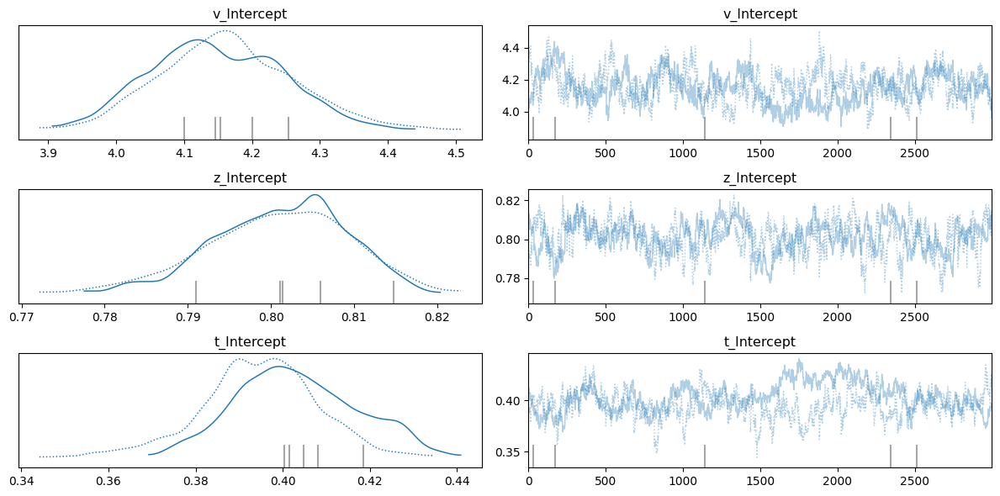

In [33]:
az.plot_trace(
    HDDMaFixedPupilInsulaBias_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept']
)
plt.tight_layout()

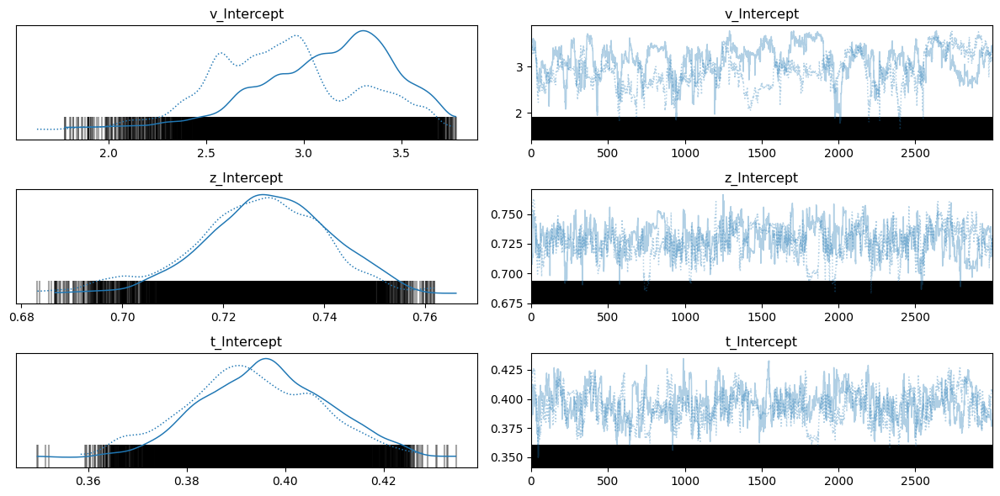

In [34]:
az.plot_trace(
    HDDMaFixedPupilInsulaDriftRate_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept']
)
plt.tight_layout()

### check marginal posteriors

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

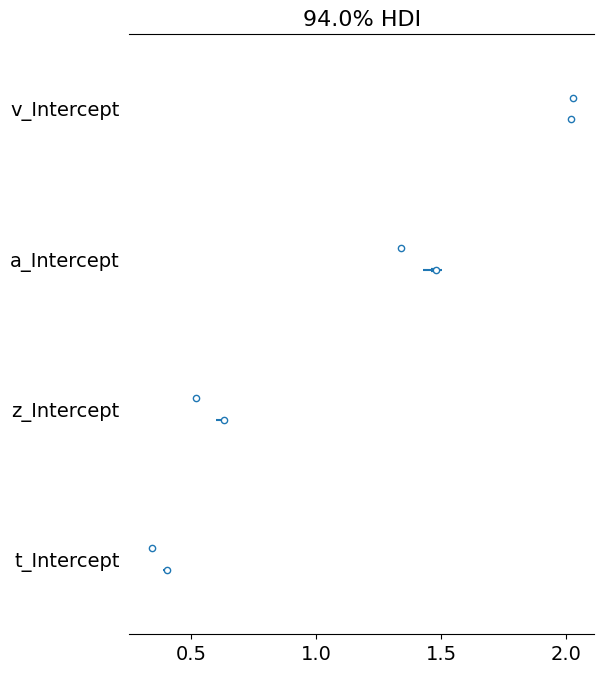

In [35]:
az.plot_forest(vanillaHDDMallFree_inferenceData,var_names=['v_Intercept','a_Intercept','z_Intercept','t_Intercept'])

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

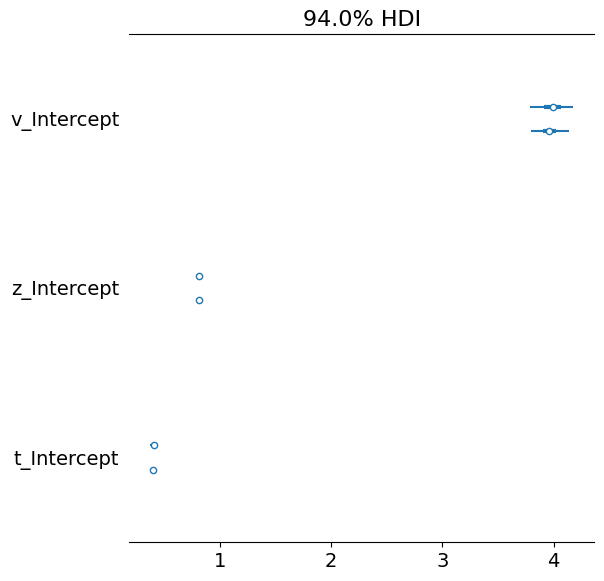

In [41]:
az.plot_forest(HDDMaFixed_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept'])

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

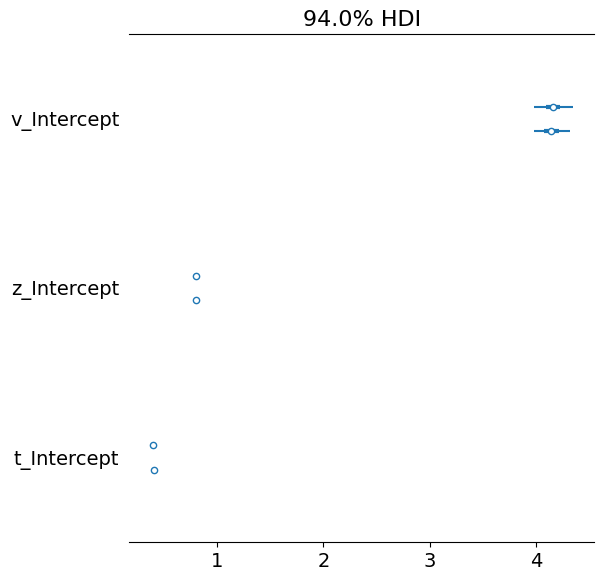

In [40]:
az.plot_forest(HDDMaFixedPupilInsula_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept'])

array([<Axes: title={'center': 'v_Intercept'}>,
       <Axes: title={'center': 'z_Intercept'}>,
       <Axes: title={'center': 't_Intercept'}>], dtype=object)

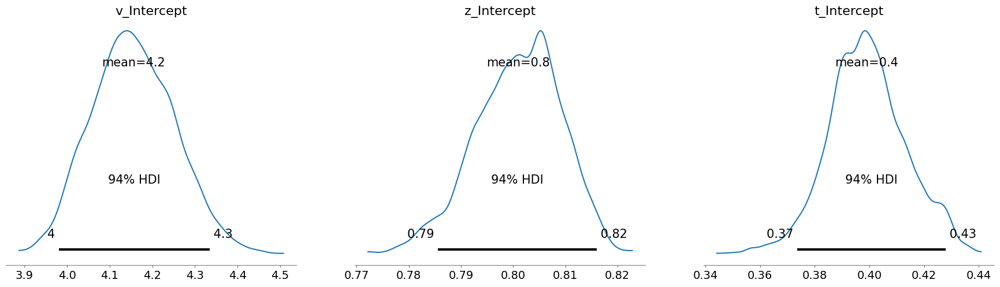

In [38]:
az.plot_posterior(HDDMaFixedPupilInsula_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept'])

array([<Axes: title={'center': 'v_Intercept'}>,
       <Axes: title={'center': 'z_Intercept'}>,
       <Axes: title={'center': 't_Intercept'}>], dtype=object)

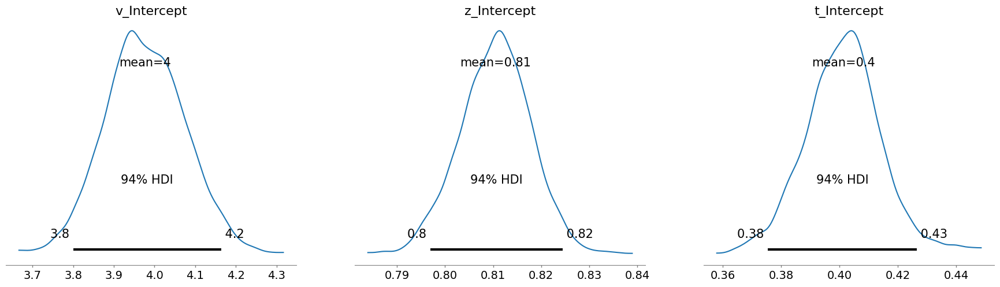

In [39]:
az.plot_posterior(HDDMaFixed_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept'])

array([<Axes: title={'center': 'v_Intercept'}>,
       <Axes: title={'center': 'z_Intercept'}>,
       <Axes: title={'center': 't_Intercept'}>], dtype=object)

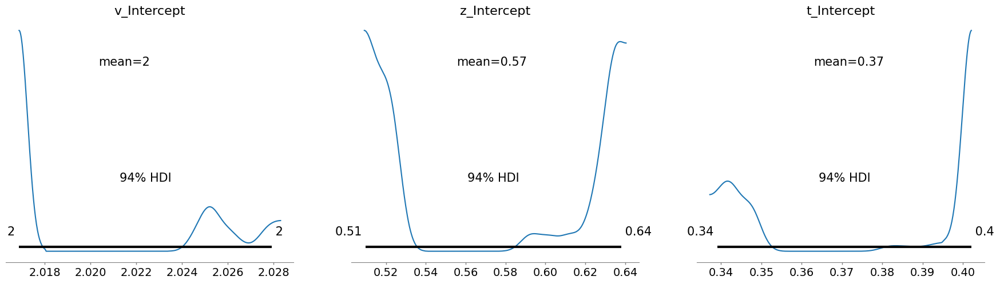

In [42]:
az.plot_posterior(vanillaHDDMallFree_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept'])

### posterior pair plots

array([[<Axes: ylabel='a_Intercept'>, <Axes: >, <Axes: >],
       [<Axes: ylabel='z_Intercept'>, <Axes: >, <Axes: >],
       [<Axes: xlabel='v_Intercept', ylabel='t_Intercept'>,
        <Axes: xlabel='a_Intercept'>, <Axes: xlabel='z_Intercept'>]],
      dtype=object)

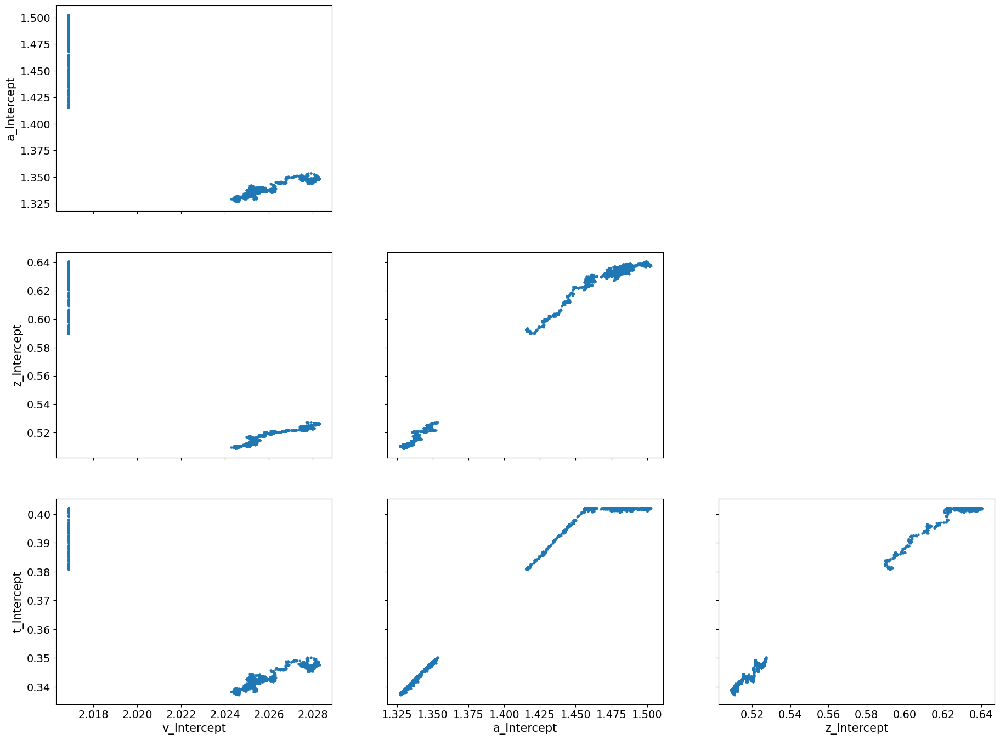

In [43]:
# first just look at scatter plots
az.plot_pair(vanillaHDDMallFree_inferenceData,var_names=['v_Intercept','a_Intercept','z_Intercept','t_Intercept'])

array([[<Axes: ylabel='a_Intercept'>, <Axes: >, <Axes: >],
       [<Axes: ylabel='z_Intercept'>, <Axes: >, <Axes: >],
       [<Axes: xlabel='v_Intercept', ylabel='t_Intercept'>,
        <Axes: xlabel='a_Intercept'>, <Axes: xlabel='z_Intercept'>]],
      dtype=object)

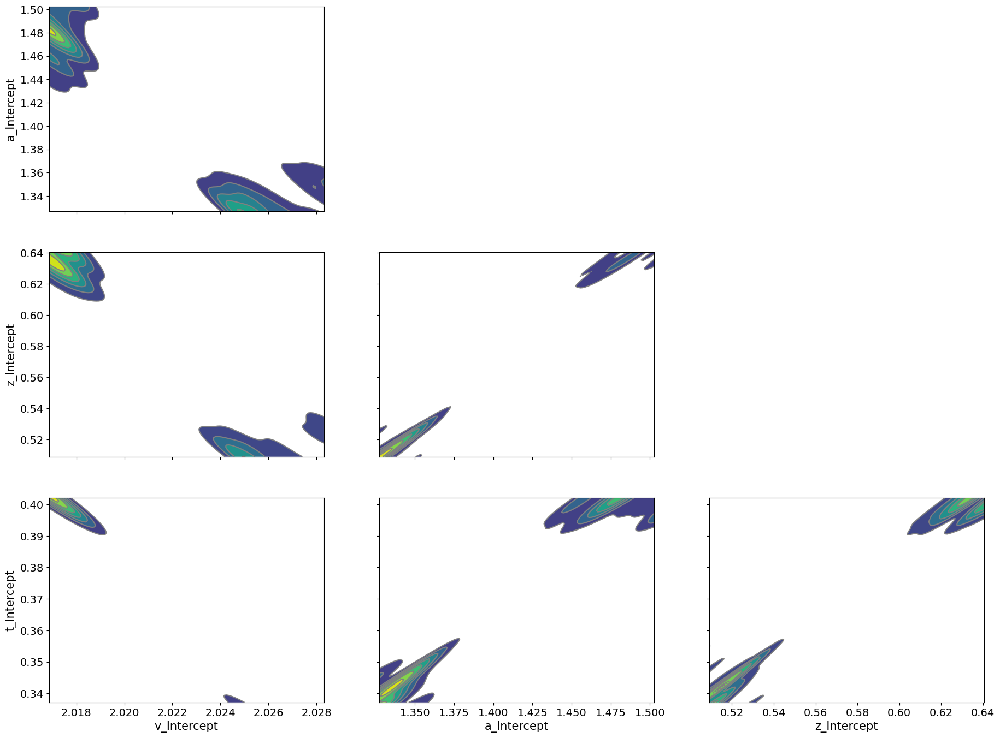

In [32]:
# can also look at kernal density estimates, makes the visualization smoother
az.plot_pair(vanillaHDDMallFree_inferenceData,var_names=['v_Intercept','a_Intercept','z_Intercept','t_Intercept'], kind="kde")

array([[<Axes: ylabel='z_Intercept'>, <Axes: >],
       [<Axes: xlabel='v_Intercept', ylabel='t_Intercept'>,
        <Axes: xlabel='z_Intercept'>]], dtype=object)

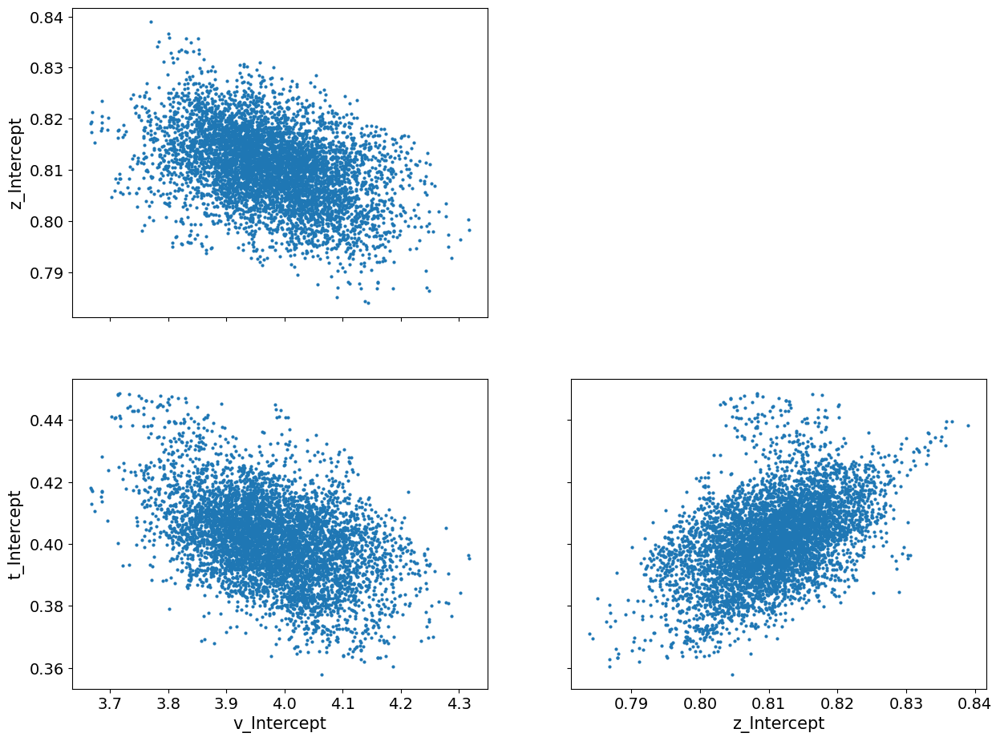

In [44]:
az.plot_pair(HDDMaFixed_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept'])

array([[<Axes: ylabel='z_Intercept'>, <Axes: >],
       [<Axes: xlabel='v_Intercept', ylabel='t_Intercept'>,
        <Axes: xlabel='z_Intercept'>]], dtype=object)

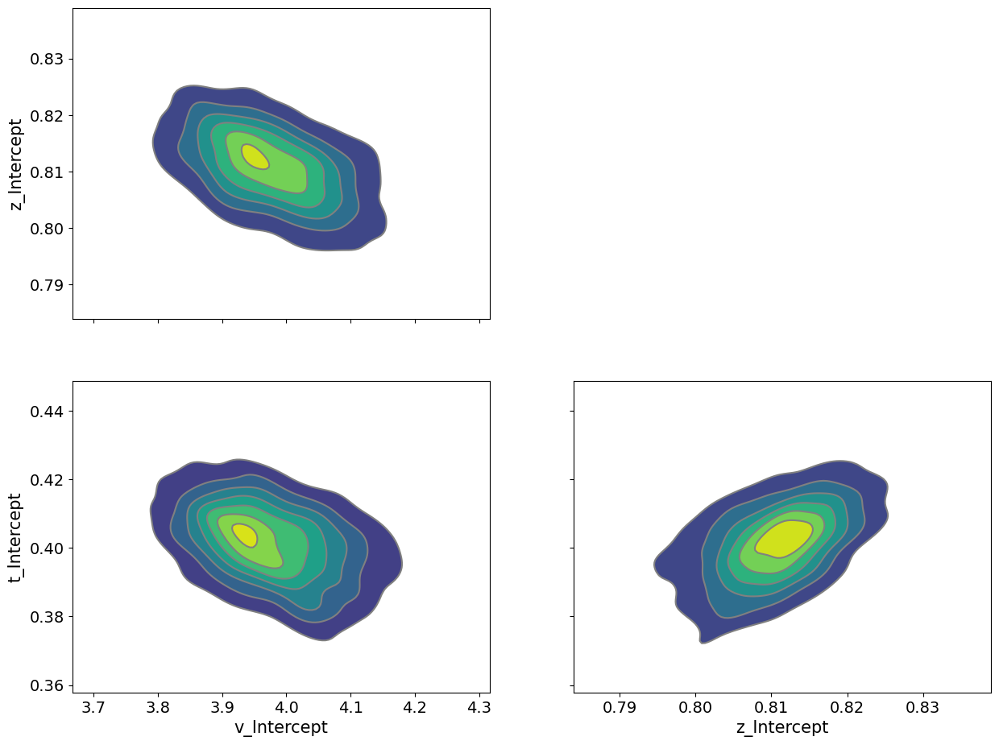

In [33]:
az.plot_pair(HDDMaFixed_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept'], kind="kde")

array([[<Axes: ylabel='z_Intercept'>, <Axes: >],
       [<Axes: xlabel='v_Intercept', ylabel='t_Intercept'>,
        <Axes: xlabel='z_Intercept'>]], dtype=object)

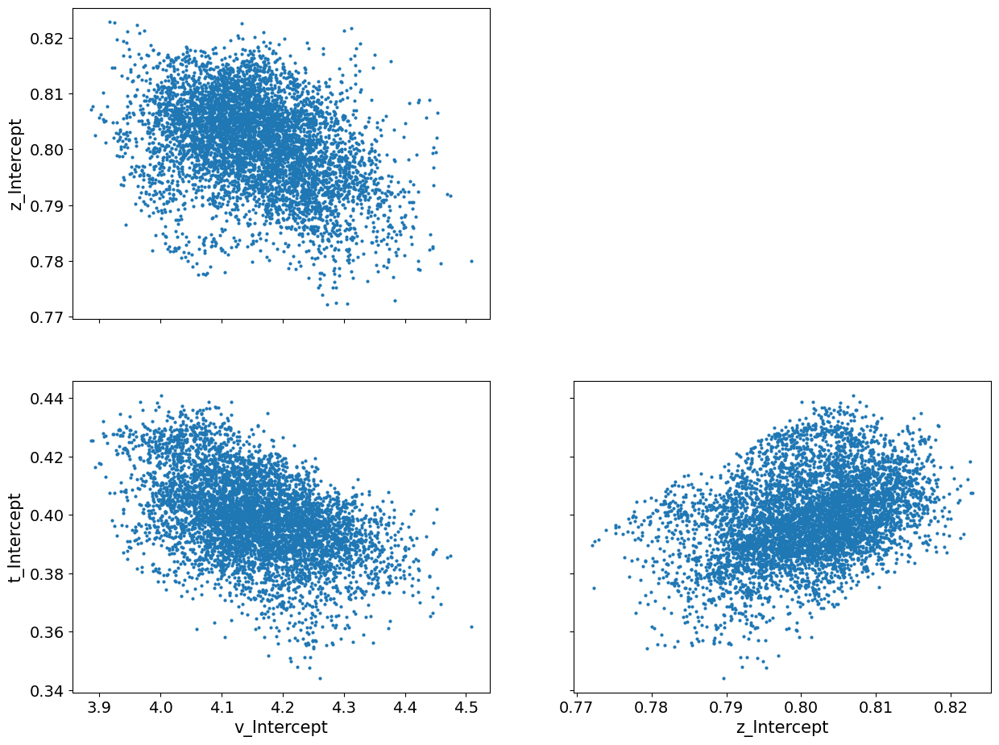

In [46]:
az.plot_pair(HDDMaFixedPupilInsula_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept'])

array([[<Axes: ylabel='z_Intercept'>, <Axes: >],
       [<Axes: xlabel='v_Intercept', ylabel='t_Intercept'>,
        <Axes: xlabel='z_Intercept'>]], dtype=object)

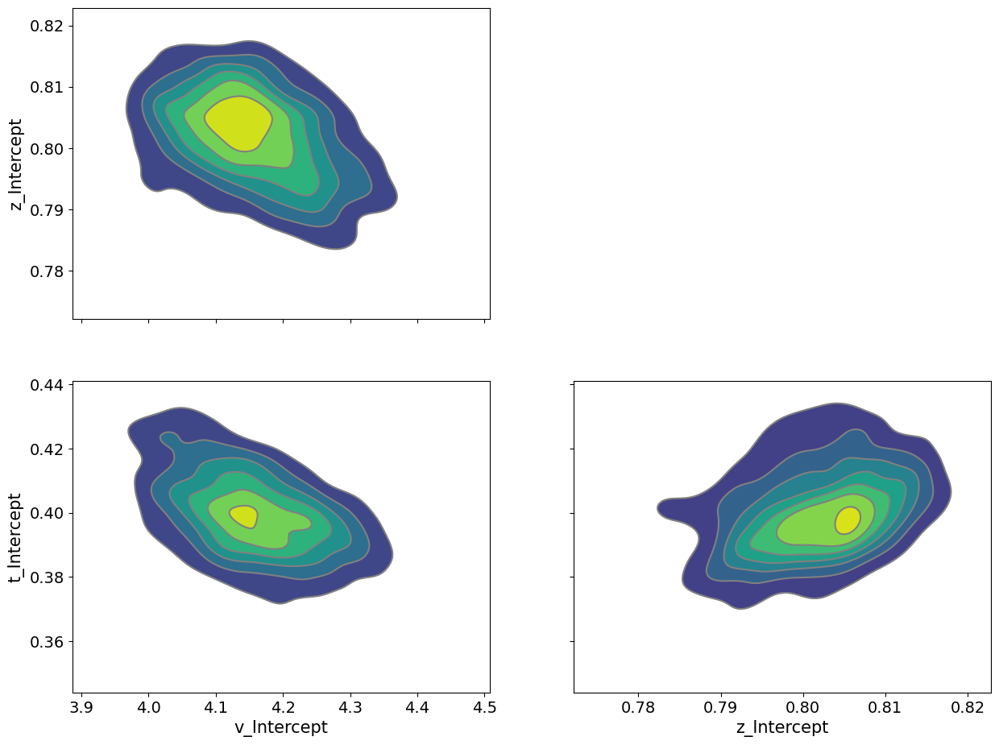

In [45]:
az.plot_pair(HDDMaFixedPupilInsula_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept'], kind="kde")

## check different a fixed values for the bias neural regress models

In [7]:
aFixed_neuTrReg_inferenceData=az.from_netcdf(basepath+'/models/hssm/aVals/test3/inferenceData_simple_ddm_model_hier_aFix_dependsSwitch_trialNeuReg_3.0.nc')
HDDMaFixedPupilInsulaDriftRate_inferenceData=az.from_netcdf(basepath+'/models/hssm/inferenceData_simple_ddm_model_hier_aFix_dependsSwitch_trialNeuReg_driftRate.nc')
 fileName = basepath + '/models/hssm/zVals/inferenceData_simple_ddm_model_hier_zFix_driftRateDependSwitch_trialNeuReg_'+str(zVal)+'.nc'

In [54]:
fileName = basepath + '/models/hssm/aVals/inferenceData_simple_ddm_model_hier_aFix_dependsSwitch_trialNeuReg_'+str(3.0)+'.nc'
HDDMaFixedPupilInsulaBias_inferenceData=az.from_netcdf(fileName)


In [70]:
fileName = basepath + '/models/hssm/aVals/inferenceData_simple_ddm_model_hier_aFix_driftRateDependSwitch_trialNeuReg_'+str(5.0)+'.nc'
HDDMaFixedPupilInsulaDriftRate_inferenceData=az.from_netcdf(fileName)


In [95]:
fileName = basepath + '/models/hssm/aug24/nuts/inferenceData_simple_ddm_model_hier_aFix_dependsSwitch_trialNeuReg.nc'
modelData=az.from_netcdf(fileName)


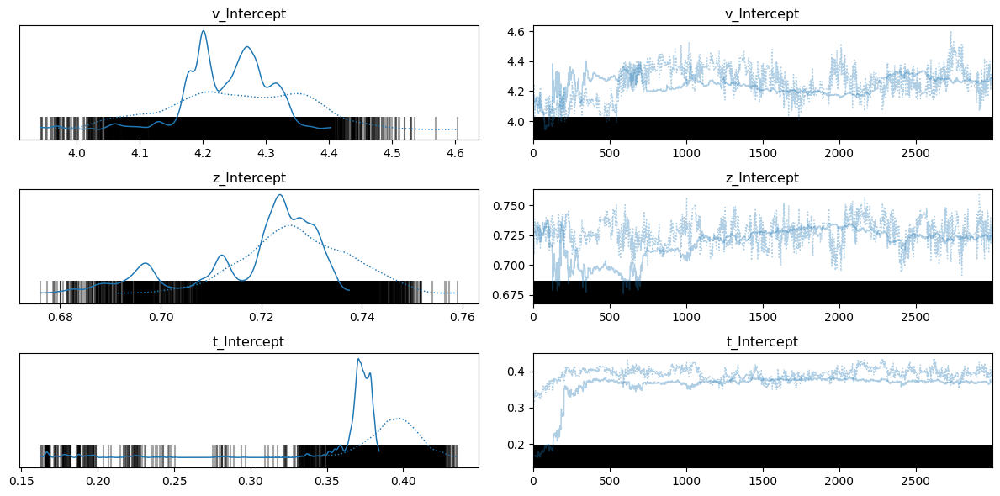

In [96]:
az.plot_trace(
    modelData,var_names=['v_Intercept','z_Intercept','t_Intercept']
)
plt.tight_layout()

array([[<Axes: ylabel='z_Intercept'>, <Axes: >],
       [<Axes: xlabel='v_Intercept', ylabel='t_Intercept'>,
        <Axes: xlabel='z_Intercept'>]], dtype=object)

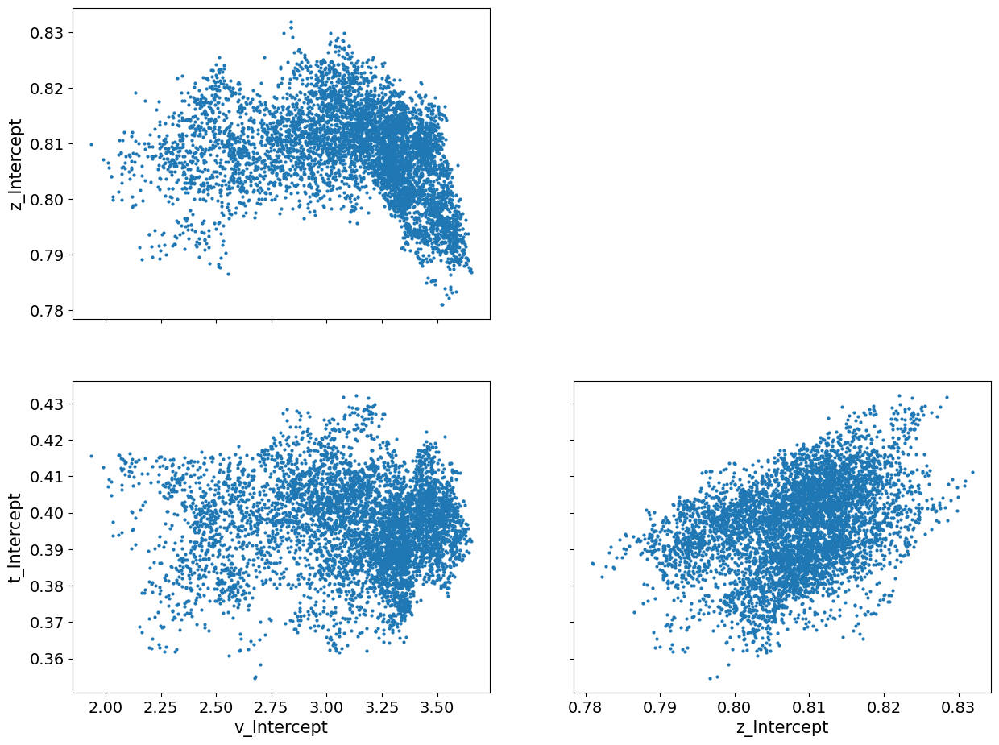

In [72]:
az.plot_pair(HDDMaFixedPupilInsulaDriftRate_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept'])

In [47]:
log_likelihood = HDDMaFixedPupilInsulaBias_inferenceData.log_likelihood.stack(sample=["chain", "draw"])
print(log_likelihood)
deviance = -2 * log_likelihood
mean_deviance = np.mean(deviance, axis=(0, 2))  # Averaging over chains and draws

# Compute the deviance at the posterior mean of parameters
mean_params_deviance = -2 * np.sum(np.mean(log_likelihood, axis=(0, 2)))
DIC = 2 * np.sum(mean_deviance) - mean_params_deviance
print(DIC)

<xarray.Dataset> Size: 532MB
Dimensions:          (rt,response_obs: 11084, sample: 6000)
Coordinates:
  * rt,response_obs  (rt,response_obs) int64 89kB 0 1 2 3 ... 11081 11082 11083
  * sample           (sample) object 48kB MultiIndex
  * chain            (sample) int64 48kB 0 0 0 0 0 0 0 0 0 ... 1 1 1 1 1 1 1 1 1
  * draw             (sample) int64 48kB 0 1 2 3 4 ... 2995 2996 2997 2998 2999
Data variables:
    rt,response      (rt,response_obs, sample) float64 532MB 0.4423 ... -5.298
Attributes:
    created_at:                  2024-06-03T09:20:29.725645+00:00
    arviz_version:               0.18.0
    inference_library:           pymc
    inference_library_version:   5.15.0
    modeling_interface:          bambi
    modeling_interface_version:  0.13.0


ValueError: passing 'axis' to Dataset reduce methods is ambiguous. Please use 'dim' instead.

In [48]:
log_likelihood = HDDMaFixedPupilInsulaBias_inferenceData.log_likelihood.to_array().values
print(log_likelihood)
deviance = -2 * log_likelihood
mean_deviance = np.mean(deviance, axis=(0, 2))  # Averaging over chains and draws

# Compute the deviance at the posterior mean of parameters
mean_params_deviance = -2 * np.sum(np.mean(log_likelihood, axis=(0, 2)))
DIC = 2 * np.sum(mean_deviance) - mean_params_deviance
print(DIC)


[[[[ 0.44232499 -0.75350586 -1.49102021 ... -0.26911574  0.8492033
     1.10955145]
   [ 0.55160183 -1.40686348 -1.86515373 ... -0.13988007  0.96638577
     1.20216299]
   [ 0.56613662 -1.23806219 -1.83270763 ... -0.33326704  0.923876
     1.22376726]
   ...
   [ 0.60784155 -0.52426159 -1.78228644 ... -0.44976895  0.88280233
     1.19280788]
   [ 0.5713211  -0.5355549  -1.61877025 ... -0.45922359  0.85695761
     1.15511305]
   [ 0.57918946 -0.7481108  -1.68273686 ... -0.3319043   0.88045457
     1.14306719]]

  [[-5.29831735 -5.29831735 -5.29831735 ... -5.29831735 -5.29831735
    -5.29831735]
   [-5.29831735 -5.29831735 -5.29831735 ... -5.29831735 -5.29831735
    -5.29831735]
   [-5.29831735 -5.29831735 -5.29831735 ... -5.29831735 -5.29831735
    -5.29831735]
   ...
   [-5.29831735 -5.29831735 -5.29831735 ... -5.29831735 -5.29831735
    -5.29831735]
   [-5.29831735 -5.29831735 -5.29831735 ... -5.29831735 -5.29831735
    -5.29831735]
   [-5.29831735 -5.29831735 -5.29831735 ... -5.29831

In [56]:
aVals=np.arange(3.0,8.5,0.5)
DIC_all=[]

for i in range(len(aVals)):
    aVal=aVals[i]
    print(aVal)
    fileName = basepath + '/models/hssm/aVals/inferenceData_simple_ddm_model_hier_aFix_driftRateDependSwitch_trialNeuReg_'+str(aVal)+'.nc'
    HDDMaFixedPupilInsulaDriftRate_inferenceData=az.from_netcdf(fileName)

    # Extract log_likelihood from the InferenceData object
    log_likelihood = HDDMaFixedPupilInsulaBias_inferenceData.log_likelihood.to_array().values
    
    # Compute the deviance
    deviance = -2 * log_likelihood
    
    # Compute the mean deviance over samples
    mean_deviance = np.mean(deviance, axis=(0, 2))  # Averaging over chains and draws
    
    # Compute the deviance at the posterior mean of parameters
    mean_params_deviance = -2 * np.sum(np.mean(log_likelihood, axis=(0, 2)))
    DIC = 2 * np.sum(mean_deviance) - mean_params_deviance
 
    print("DIC:", DIC)
    
    DIC_all=DIC_all+[DIC]
    
    

3.0
DIC: 160507.1189374984
3.5
DIC: 160507.1189374984
4.0
DIC: 160507.1189374984
4.5
DIC: 160507.1189374984
5.0
DIC: 160507.1189374984
5.5
DIC: 160507.1189374984
6.0
DIC: 160507.1189374984
6.5
DIC: 160507.1189374984
7.0
DIC: 160507.1189374984
7.5
DIC: 160507.1189374984
8.0
DIC: 160507.1189374984


In [64]:
compare_data

{0: {'aVal is 3.0': Inference data with groups:
  	> posterior
  	> log_likelihood
  	> sample_stats
  	> observed_data},
 1: {'aVal is 3.5': Inference data with groups:
  	> posterior
  	> log_likelihood
  	> sample_stats
  	> observed_data},
 2: {'aVal is 4.0': Inference data with groups:
  	> posterior
  	> log_likelihood
  	> sample_stats
  	> observed_data},
 3: {'aVal is 4.5': Inference data with groups:
  	> posterior
  	> log_likelihood
  	> sample_stats
  	> observed_data},
 4: {'aVal is 5.0': Inference data with groups:
  	> posterior
  	> log_likelihood
  	> sample_stats
  	> observed_data},
 5: {'aVal is 5.5': Inference data with groups:
  	> posterior
  	> log_likelihood
  	> sample_stats
  	> observed_data},
 6: {'aVal is 6.0': Inference data with groups:
  	> posterior
  	> log_likelihood
  	> sample_stats
  	> observed_data},
 7: {'aVal is 6.5': Inference data with groups:
  	> posterior
  	> log_likelihood
  	> sample_stats
  	> observed_data},
 8: {'aVal is 7.0': Infe

In [63]:
aVals=np.arange(3.0,8.5,0.5)
compare_data={}

for i in range(len(aVals)):
    aVal=aVals[i]
    print(aVal)
    fileName = basepath + '/models/hssm/aVals/inferenceData_simple_ddm_model_hier_aFix_driftRateDependSwitch_trialNeuReg_'+str(aVal)+'.nc'
    HDDMaFixedPupilInsulaDriftRate_inferenceData=az.from_netcdf(fileName)

    #create a dictionary of inference data to compare later
    compare_data[i] = {
        "aVal is "+str(aVal): HDDMaFixedPupilInsulaDriftRate_inferenceData
    }


comparison=az.compare(compare_data)
    
    

3.0
3.5
4.0
4.5
5.0
5.5
6.0
6.5
7.0
7.5
8.0


/home/mpib/tli/.conda/envs/hssm_test/lib/python3.11/site-packages/arviz/data/base.py:265: UserWarning: More chains (11084) than draws (2). Passed array should have shape (chains, draws, *shape)
  warnings.warn(


TypeError: Encountered error in ELPD computation of compare.

Text(0.5, 1.0, 'bias model DIC for different fixed threshold values')

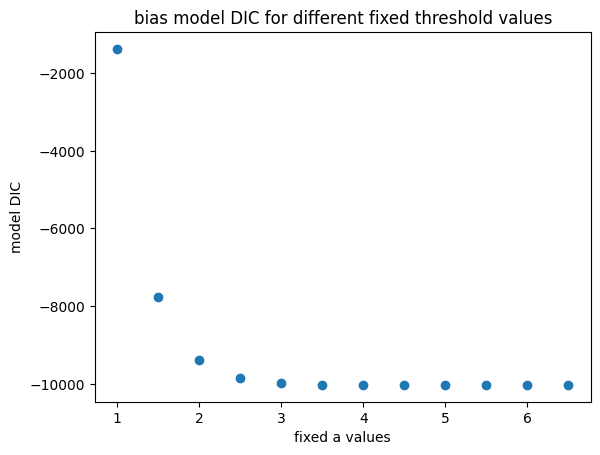

In [6]:
plt.scatter(aVals,DIC_all)
plt.xlabel('fixed a values')
plt.ylabel('model DIC')
plt.title('bias model DIC for different fixed threshold values')

In [8]:
aFixed_neuTrReg_inferenceData

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

## nuts numpyro

In [73]:
fileName = basepath + '/models/hssm/aug24/nuts/inferenceData_simple_ddm_model_hier_aFix_dependsSwitch_trialNeuReg_driftRate.nc'
modelData=az.from_netcdf(fileName)


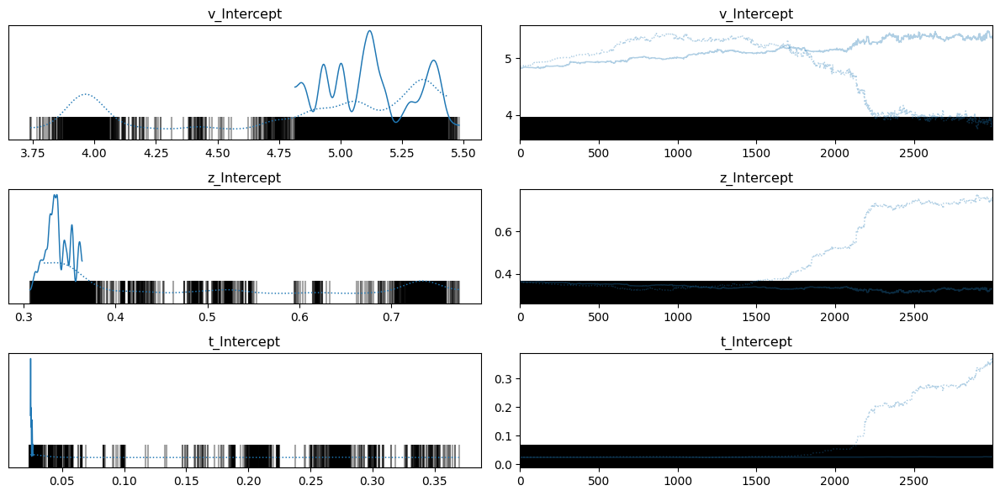

In [74]:
az.plot_trace(
    modelData,var_names=['v_Intercept','z_Intercept','t_Intercept']
)
plt.tight_layout()

array([[<Axes: ylabel='z_Intercept'>, <Axes: >],
       [<Axes: xlabel='v_Intercept', ylabel='t_Intercept'>,
        <Axes: xlabel='z_Intercept'>]], dtype=object)

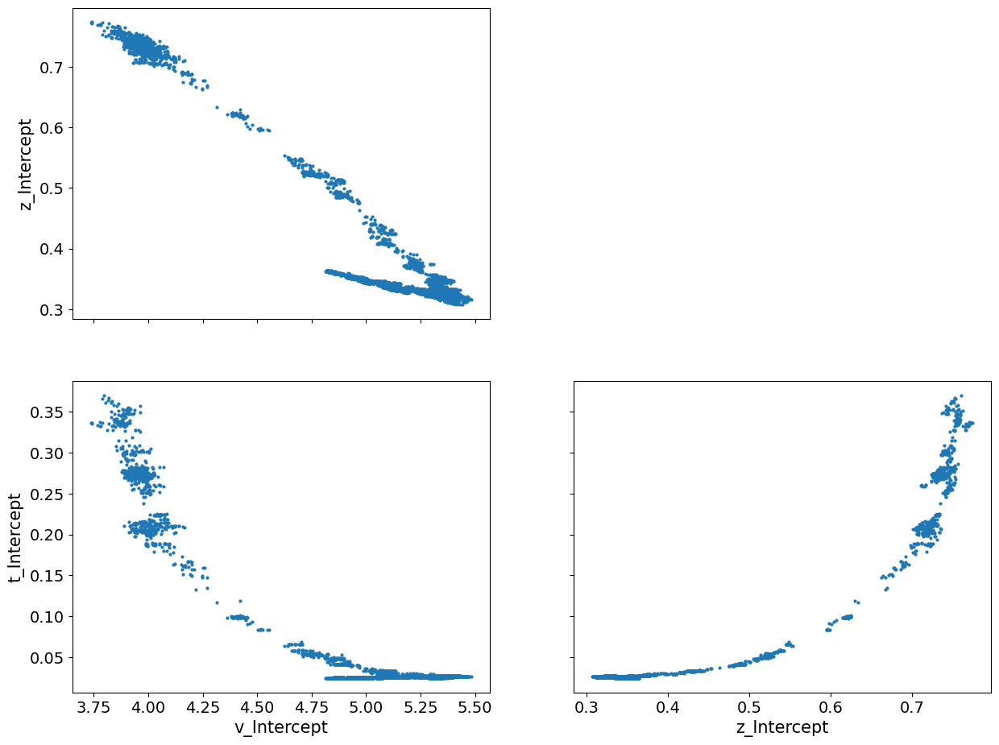

In [75]:
az.plot_pair(modelData,var_names=['v_Intercept','z_Intercept','t_Intercept'])

In [76]:
fileName = basepath + '/models/hssm/aug24/nuts/inferenceData_simple_ddm_model_hier_aFix_dependsSwitch_bias.nc'
modelData=az.from_netcdf(fileName)


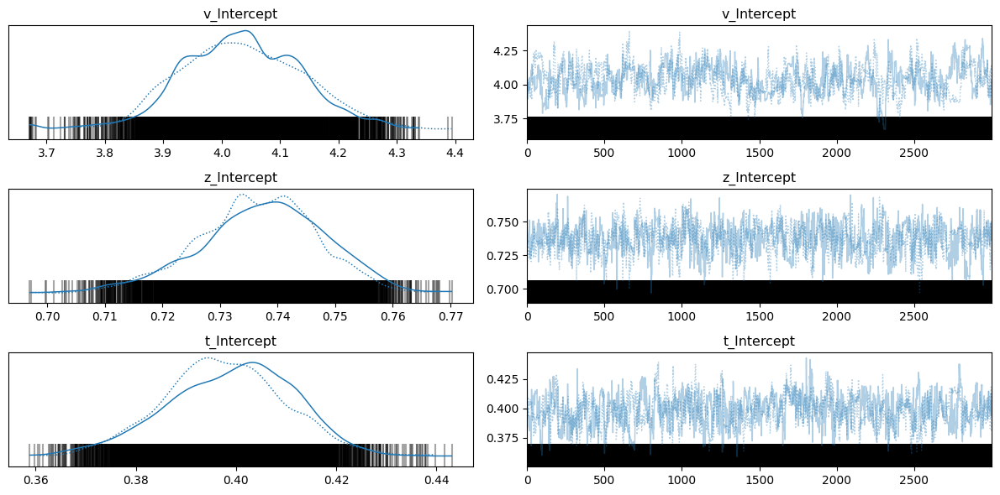

In [77]:
az.plot_trace(
    modelData,var_names=['v_Intercept','z_Intercept','t_Intercept']
)
plt.tight_layout()

array([[<Axes: ylabel='z_Intercept'>, <Axes: >],
       [<Axes: xlabel='v_Intercept', ylabel='t_Intercept'>,
        <Axes: xlabel='z_Intercept'>]], dtype=object)

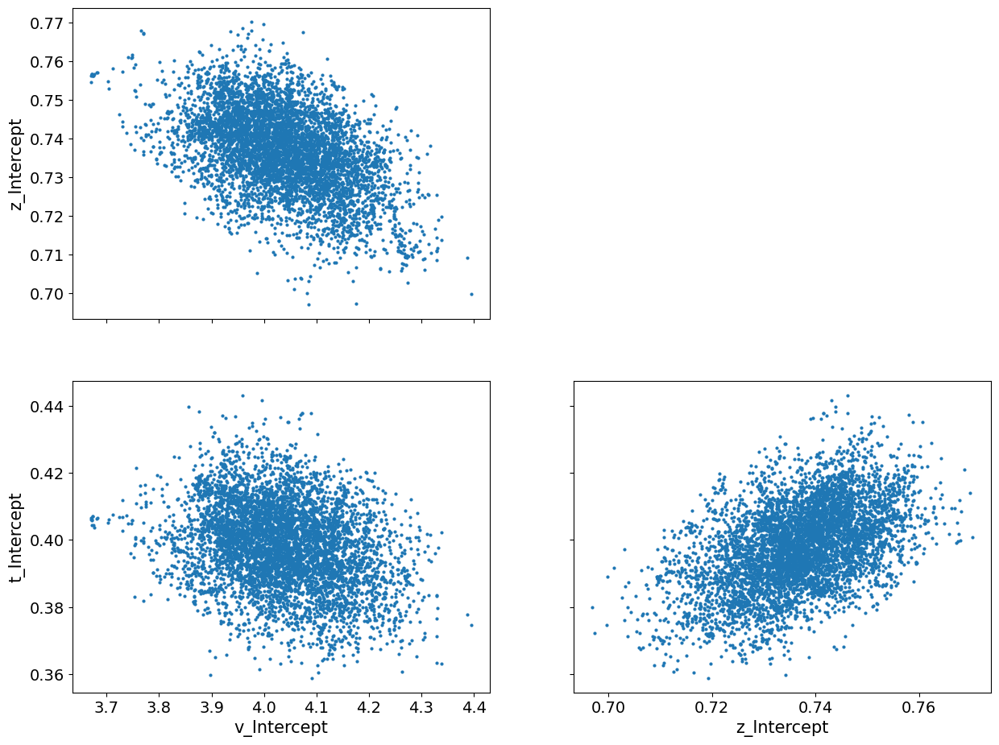

In [78]:
az.plot_pair(modelData,var_names=['v_Intercept','z_Intercept','t_Intercept'])

## MCMC

In [97]:
fileName = basepath + '/models/hssm/aug24/mcmc/inferenceData_simple_ddm_model_hier_aFix_dependsSwitch_bias.nc'
HDDMaFixedBias_inferenceData=az.from_netcdf(fileName)


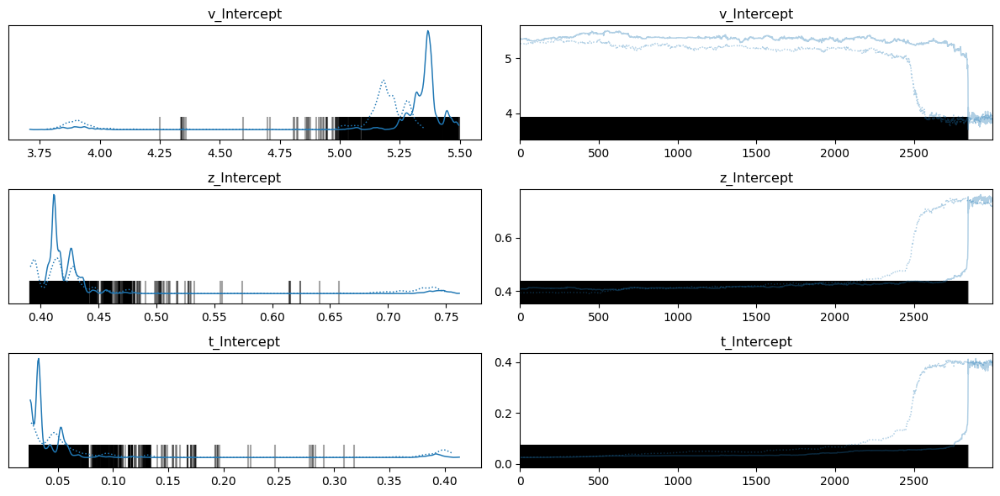

In [98]:
az.plot_trace(
    HDDMaFixedBias_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept']
)
plt.tight_layout()

array([[<Axes: ylabel='z_Intercept'>, <Axes: >],
       [<Axes: xlabel='v_Intercept', ylabel='t_Intercept'>,
        <Axes: xlabel='z_Intercept'>]], dtype=object)

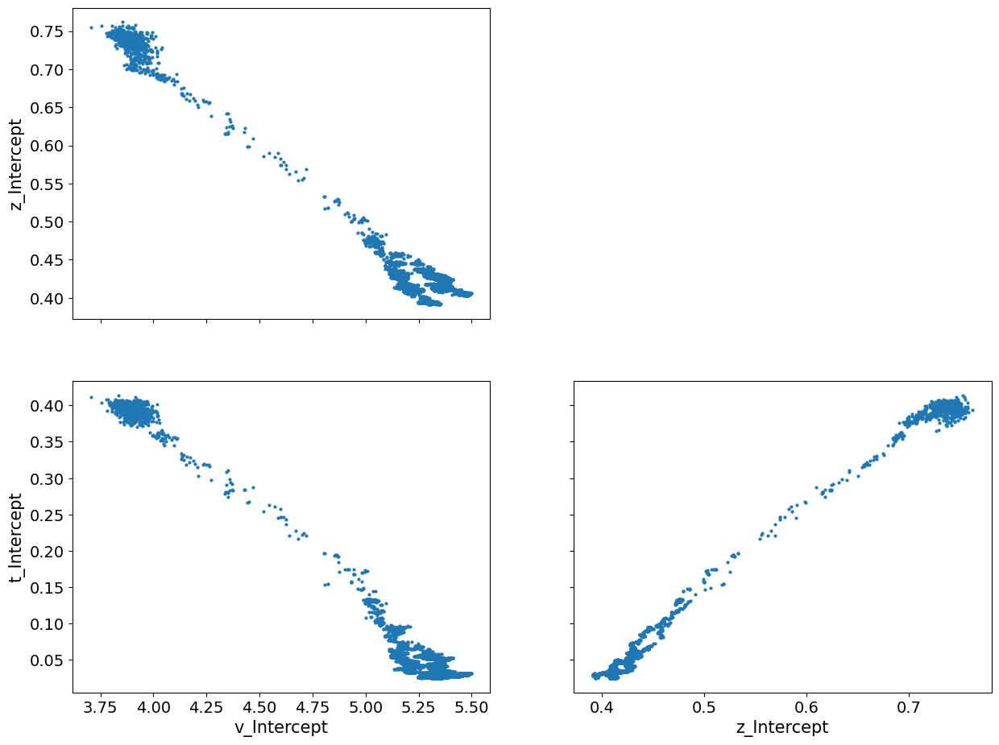

In [108]:
az.plot_pair(HDDMaFixedBias_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept'])

In [100]:
fileName = basepath + '/models/hssm/aug24/mcmc/inferenceData_simple_ddm_model_hier_aFix_dependsSwitch_driftRate.nc'
HDDMaFixedDriftrate_inferenceData=az.from_netcdf(fileName)


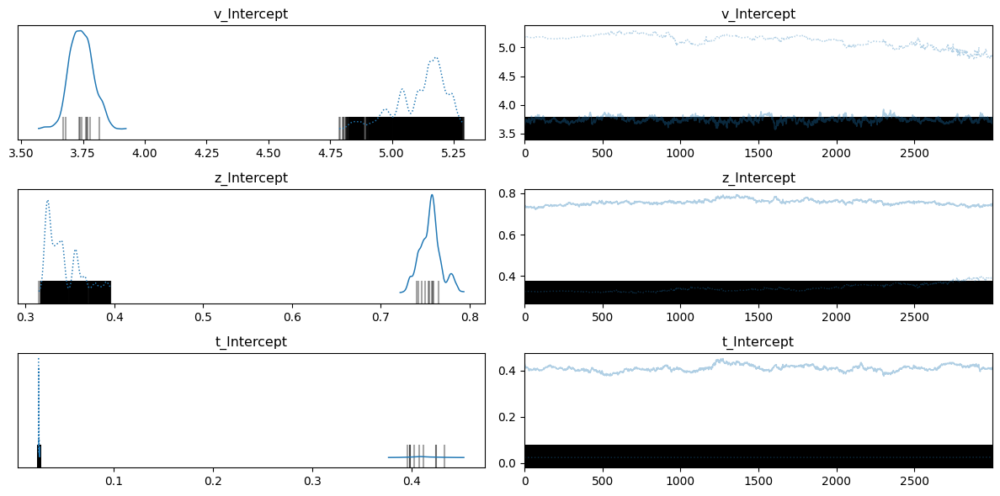

In [101]:
az.plot_trace(
    HDDMaFixedDriftrate_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept']
)
plt.tight_layout()

array([[<Axes: ylabel='z_Intercept'>, <Axes: >],
       [<Axes: xlabel='v_Intercept', ylabel='t_Intercept'>,
        <Axes: xlabel='z_Intercept'>]], dtype=object)

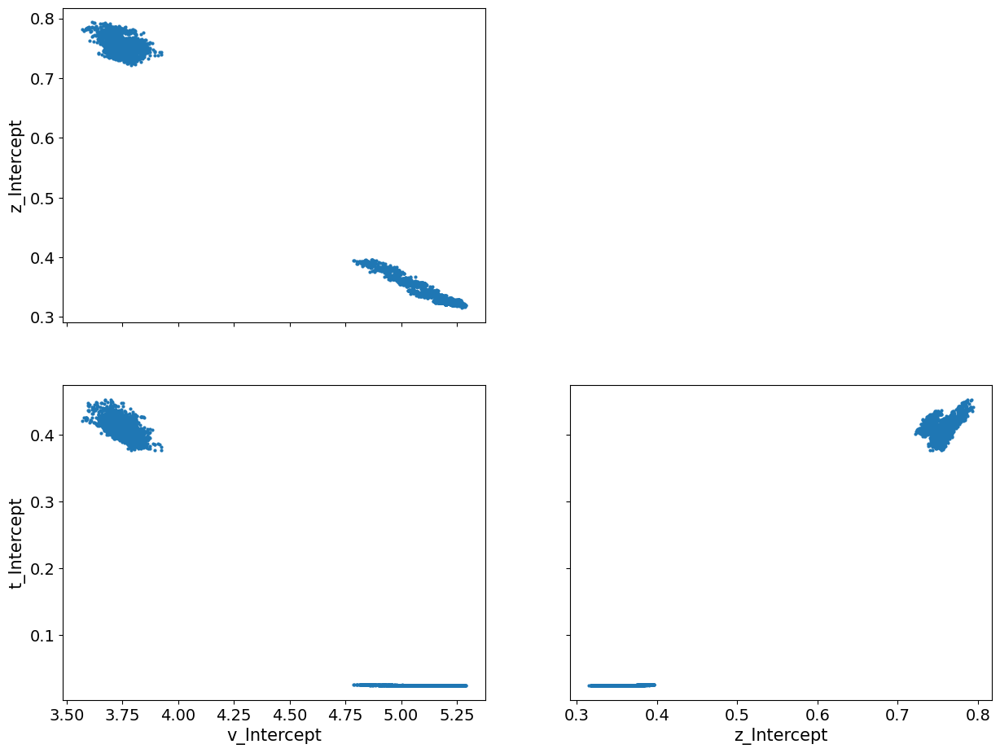

In [109]:
az.plot_pair(HDDMaFixedDriftrate_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept'])

In [102]:
fileName = basepath + '/models/hssm/inferenceData_simple_ddm_model_hier_aFix_dependsSwitch_trialNeuReg.nc'
HDDMaFixedBiasNeuReg_inferenceData=az.from_netcdf(fileName)


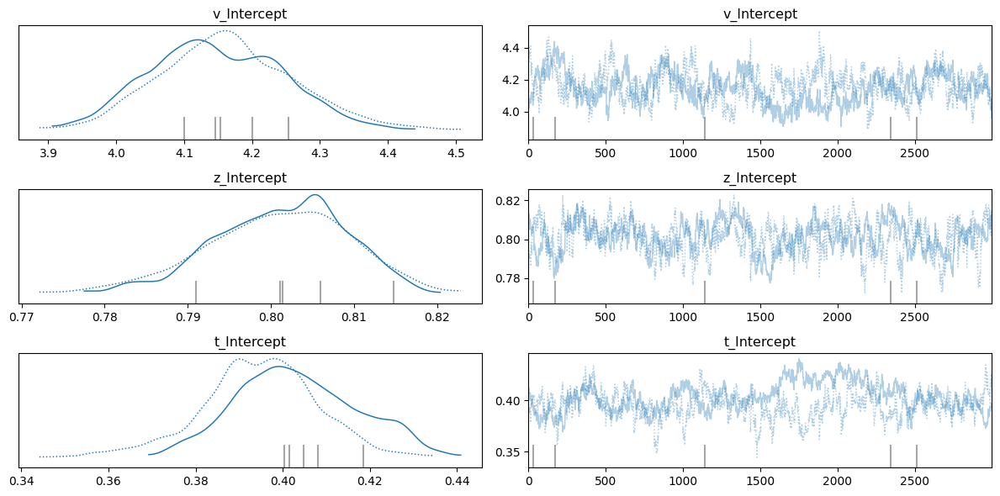

In [103]:
az.plot_trace(
    HDDMaFixedBiasNeuReg_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept']
)
plt.tight_layout()

In [104]:
fileName = basepath + '/models/hssm/inferenceData_simple_ddm_model_hier_aFixed_noPrior.nc'
HDDMaFixed_inferenceData=az.from_netcdf(fileName)


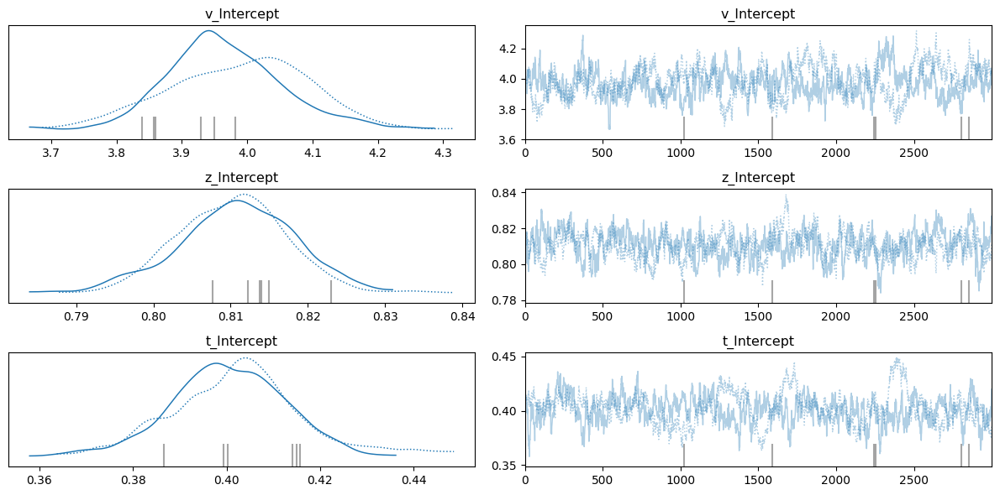

In [105]:
az.plot_trace(
    HDDMaFixed_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept']
)
plt.tight_layout()

In [106]:
fileName = basepath + '/models/hssm/inferenceData_simple_ddm_model_hier_all_noPrior.nc'
HDDMallFree_inferenceData=az.from_netcdf(fileName)


/home/mpib/tli/.conda/envs/hssm_test/lib/python3.11/site-packages/arviz/stats/density_utils.py:488: UserWarning: Your data appears to have a single value or no finite values
  warnings.warn("Your data appears to have a single value or no finite values")


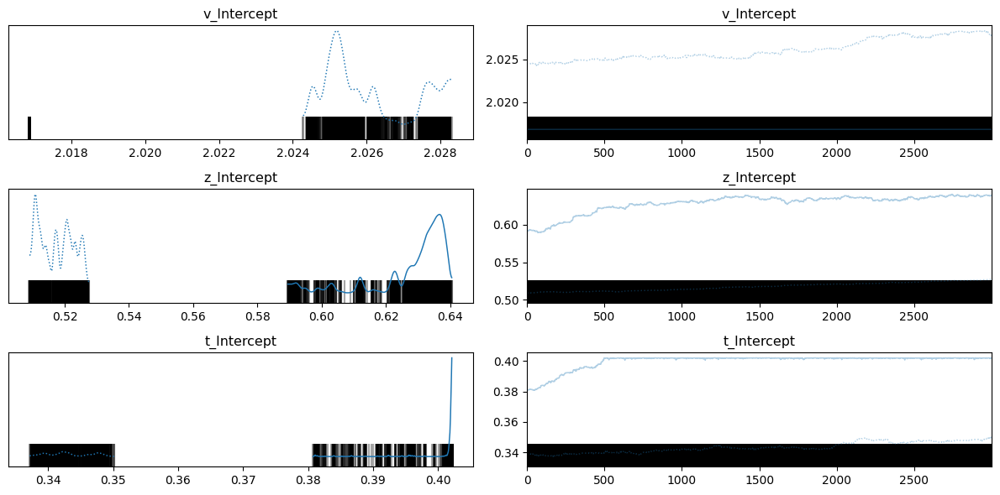

In [107]:
az.plot_trace(
    HDDMallFree_inferenceData,var_names=['v_Intercept','z_Intercept','t_Intercept']
)
plt.tight_layout()

# set up data simulations using ssms package 

SSMS (Sequential Sampling Model Simulators)has a collection of SSMs 
https://alexanderfengler.github.io/ssm-simulators/

two usage:
1.Easy access to fast simulators of sequential sampling models
2.Support infrastructure to construct training data for various approaches to likelihood / posterior amortization


In [24]:
# take a look at our actual data from day 2 only for now:
dataForModel

,id_runningnum,participant_id,agegrp,toi1,toi2,offset,trl_runningnum,event,trigger,artfree,...,beta_LC,pupil,LCr,trl_condition_bin,switch_condition,switch_condition_num,logreactiontime,logreactiontimez,response,rtPlot
1,1,42013,1,52293,54793,-1250,2,74,16,1,...,-0.771706,-0.275299,0.985568,1,stay_standard,1.0,-0.174549,-0.033526,1.0,0.839835
2,1,42013,1,54293,56793,-1250,3,78,16,1,...,-0.017799,1.874566,0.985568,2,switch_to_oddball,3.0,0.289645,1.666682,1.0,1.335954
3,1,42013,1,57293,59793,-1250,4,82,16,1,...,-0.247686,-0.516399,0.985568,2,stay_oddball,2.0,0.296416,1.691481,1.0,1.345030
4,1,42013,1,59293,61793,-1250,5,86,16,1,...,0.441441,0.710667,0.985568,1,switch_to_standard,4.0,-0.418396,-0.926666,1.0,0.658101
5,1,42013,1,61293,63793,-1250,6,90,16,1,...,1.490605,0.795430,0.985568,1,stay_standard,1.0,-0.238042,-0.266080,1.0,0.788170
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11284,77,62433,2,463649,466149,-1250,155,657,16,1,...,-1.274403,0.761824,0.386572,1,stay_standard,1.0,-0.137351,-0.110256,1.0,0.871665
11285,77,62433,2,465649,468149,-1250,156,661,16,1,...,-0.852999,-0.115871,0.386572,1,stay_standard,1.0,-0.197492,-0.575755,1.0,0.820787
11286,77,62433,2,470649,473149,-1250,157,665,16,1,...,1.145411,1.098559,0.386572,2,switch_to_oddball,3.0,0.066526,1.467764,1.0,1.068788
11287,77,62433,2,472649,475149,-1250,158,669,16,1,...,1.448574,-0.044915,0.386572,1,switch_to_standard,4.0,-0.082262,0.316131,1.0,0.921030


In [25]:
dataForModel.filter(items=['participant_id','rt','response'])

,participant_id,rt,response
1,42013,0.839835,1.0
2,42013,1.335954,1.0
3,42013,1.345030,1.0
4,42013,0.658101,1.0
5,42013,0.788170,1.0
...,...,...,...
11284,62433,0.871665,1.0
11285,62433,0.820787,1.0
11286,62433,1.068788,1.0
11287,62433,0.921030,1.0


### day2SubList

In [23]:
# based on the real data, we figure:
# we need to simulate data with 'participant_id','rt',and 'response' 
# we need to get the correct sub numbers out and also correct trial number (samples in simulation) per subject
day2SubList=dataForModel['participant_id'].unique()
len(day2SubList)


71

In [24]:
# check how many trials per subject has, realize after getting rid of empty response trials, trial number vary
len(dataForModel.loc[dataForModel['participant_id'] == day2SubList[10]])

158

## vanilla all params free model

In [28]:
# first check the summary stats of each model's params for simulating data
az.summary(vanillaHDDMallFree_inferenceData,var_names=['v_Intercept','a_Intercept','z_Intercept','t_Intercept'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
v_Intercept,2.021,0.005,2.017,2.028,0.003,0.003,2.0,2.0,3.66
a_Intercept,1.405,0.068,1.327,1.491,0.047,0.040,2.0,11.0,2.45
z_Intercept,0.573,0.056,0.510,0.638,0.039,0.033,2.0,11.0,2.55
t_Intercept,0.372,0.029,0.339,0.402,0.020,0.017,3.0,11.0,2.21


In [31]:
ssms.config.model_config['ddm']

{'name': 'ddm',
 'params': ['v', 'a', 'z', 't'],
 'param_bounds': [[-3.0, 0.3, 0.1, 0.0], [3.0, 2.5, 0.9, 2.0]],
 'boundary_name': 'constant',
 'boundary': <function ssms.basic_simulators.boundary_functions.constant(t=0)>,
 'boundary_params': [],
 'n_params': 4,
 'default_params': [0.0, 1.0, 0.5, 0.001],
 'nchoices': 2,
 'simulator': <cyfunction ddm_flexbound at 0x7fe53bac45f0>}

In [45]:
vanillaHDDMallFree_simData=pd.DataFrame();
for sub in range(len(day2SubList)):
    
    idNum=day2SubList[sub]
    
    # figure out trial number from real data for the sub to determine sample numbers in the simulator
    trialNum=len(dataForModel.loc[dataForModel['participant_id'] == idNum])
    
    idCol=pd.DataFrame({'participant_id': [idNum] * trialNum})

    # Specify parameters based on gaussians using stats from the model fit with real data
    v_true, a_true, z_true, t_true = [np.random.normal(2.021,0.005), np.random.normal(1.405,0.068), np.random.normal(0.573,0.056),np.random.normal(0.372,0.029)]

    # Simulate data
    sim_out = simulator(
        theta=[v_true, a_true, z_true, t_true],  # parameter list
        model="ddm",  # specify model (many are included in ssms)
        n_samples=trialNum,  # number of samples for each set of parameters
    )

    # Turn into nice dataset
    # Turn data into a pandas dataframe
    subDataset = pd.DataFrame(
        np.column_stack([idCol["participant_id"],sim_out["rts"][:, 0], sim_out["choices"][:, 0]]),
        columns=["participant_id", "rt", "response"],
    )

    vanillaHDDMallFree_simData=pd.concat([vanillaHDDMallFree_simData, subDataset], ignore_index=True)

In [84]:
vanillaHDDMallFree_simData

,participant_id,rt,response
0,42013.0,1.196574,1.0
1,42013.0,0.996246,1.0
2,42013.0,0.778786,1.0
3,42013.0,0.852461,1.0
4,42013.0,0.754883,1.0
...,...,...,...
11222,62433.0,1.728668,1.0
11223,62433.0,0.846811,1.0
11224,62433.0,0.840620,1.0
11225,62433.0,0.625874,1.0


### play around with the ground truth params to simulate data with more errors

In [86]:
vanillaHDDMallFree_simDataEvenChoice=pd.DataFrame();
for sub in range(len(day2SubList)):
    
    idNum=day2SubList[sub]
    
    # figure out trial number from real data for the sub to determine sample numbers in the simulator
    trialNum=len(dataForModel.loc[dataForModel['participant_id'] == idNum])
    
    idCol=pd.DataFrame({'participant_id': [idNum] * trialNum})

    # Specify parameters based on gaussians using stats from the model fit with real data
    v_true, a_true, z_true, t_true = [np.random.normal(0.1,0.005), #play with v, closer to zero will lead to more even upper and lower bound choices
                                      np.random.normal(1.405,0.068), 
                                      np.random.normal(0.573,0.056),
                                      np.random.normal(0.372,0.029)]

    # Simulate data
    sim_out = simulator(
        theta=[v_true, a_true, z_true, t_true],  # parameter list
        model="ddm",  # specify model (many are included in ssms)
        n_samples=trialNum,  # number of samples for each set of parameters
    )

    # Turn into nice dataset
    # Turn data into a pandas dataframe
    subDataset = pd.DataFrame(
        np.column_stack([idCol["participant_id"],sim_out["rts"][:, 0], sim_out["choices"][:, 0]]),
        columns=["participant_id", "rt", "response"],
    )

    vanillaHDDMallFree_simDataEvenChoice=pd.concat([vanillaHDDMallFree_simDataEvenChoice, subDataset], ignore_index=True)
    
vanillaHDDMallFree_simDataEvenChoice    

,participant_id,rt,response
0,42013.0,5.425731,1.0
1,42013.0,5.202932,1.0
2,42013.0,1.805580,1.0
3,42013.0,4.428501,-1.0
4,42013.0,4.065483,-1.0
...,...,...,...
11222,62433.0,3.151762,1.0
11223,62433.0,1.274963,1.0
11224,62433.0,4.039896,1.0
11225,62433.0,4.974141,1.0


## threshold fixed pupil insula model

In [25]:
az.summary(HDDMaFixedPupilInsula_inferenceData,var_names=['v_Intercept',
                                                          'z_Intercept',
                                                          'z_switch_condition_num|participant_id_mu',
                                                          'z_pupil|participant_id_mu',
                                                          'z_beta_insula|participant_id_mu',
                                                          't_Intercept'])
                                                          
                                                          
                                                          
                                                          

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
v_Intercept,4.155,0.097,3.981,4.335,0.015,0.010,41.0,99.0,1.05
z_Intercept,0.801,0.008,0.786,0.816,0.001,0.001,120.0,303.0,1.01
z_switch_condition_num|participant_id_mu,0.012,0.241,-0.464,0.429,0.012,0.009,378.0,679.0,1.00
z_pupil|participant_id_mu,0.025,0.237,-0.440,0.450,0.017,0.012,203.0,443.0,1.01
z_beta_insula|participant_id_mu,0.014,0.251,-0.453,0.472,0.013,0.009,367.0,720.0,1.00
t_Intercept,0.399,0.014,0.374,0.428,0.005,0.003,10.0,25.0,1.14


In [21]:
dataForModel

,id_runningnum,participant_id,agegrp,toi1,toi2,offset,trl_runningnum,event,trigger,artfree,...,beta_LC,pupil,LCr,trl_condition_bin,switch_condition,switch_condition_num,logreactiontime,logreactiontimez,response,rtPlot
1,1,42013,1,52293,54793,-1250,2,74,16,1,...,-0.771706,-0.275299,0.985568,1,stay_standard,1.0,-0.174549,-0.033526,1.0,0.839835
2,1,42013,1,54293,56793,-1250,3,78,16,1,...,-0.017799,1.874566,0.985568,2,switch_to_oddball,3.0,0.289645,1.666682,1.0,1.335954
3,1,42013,1,57293,59793,-1250,4,82,16,1,...,-0.247686,-0.516399,0.985568,2,stay_oddball,2.0,0.296416,1.691481,1.0,1.345030
4,1,42013,1,59293,61793,-1250,5,86,16,1,...,0.441441,0.710667,0.985568,1,switch_to_standard,4.0,-0.418396,-0.926666,1.0,0.658101
5,1,42013,1,61293,63793,-1250,6,90,16,1,...,1.490605,0.795430,0.985568,1,stay_standard,1.0,-0.238042,-0.266080,1.0,0.788170
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11284,77,62433,2,463649,466149,-1250,155,657,16,1,...,-1.274403,0.761824,0.386572,1,stay_standard,1.0,-0.137351,-0.110256,1.0,0.871665
11285,77,62433,2,465649,468149,-1250,156,661,16,1,...,-0.852999,-0.115871,0.386572,1,stay_standard,1.0,-0.197492,-0.575755,1.0,0.820787
11286,77,62433,2,470649,473149,-1250,157,665,16,1,...,1.145411,1.098559,0.386572,2,switch_to_oddball,3.0,0.066526,1.467764,1.0,1.068788
11287,77,62433,2,472649,475149,-1250,158,669,16,1,...,1.448574,-0.044915,0.386572,1,switch_to_standard,4.0,-0.082262,0.316131,1.0,0.921030


In [26]:
HDDMaFixedPupilInsula_simData=pd.DataFrame();
for sub in range(len(day2SubList)):
    
    idNum=day2SubList[sub]
    
    # figure out trial number from real data for the sub to determine sample numbers in the simulator
    trialNum=len(dataForModel.loc[dataForModel['participant_id'] == idNum])
    
    idCol=pd.DataFrame({'participant_id': [idNum] * trialNum})

    # Specify parameters based on gaussians using stats from the model fit with real data
    v_true, a_true, z_true, t_true, z_switch_condition_num, z_pupil, z_beta_insula = [np.random.normal(4.155,0.097), 
                                                                                      3.47, 
                                                                                      np.random.normal(0.801,0.008),
                                                                                      np.random.normal(0.399,0.014),
                                                                                      np.random.normal(0.012,0.241),
                                                                                      np.random.normal(0.025,0.237),
                                                                                      np.random.normal(0.014,0.251),
                                                                                     ]
    
    # get pupil and insula data form real data as z covariates
    pupilData=pd.array(dataForModel['pupil'].loc[dataForModel['participant_id']== idNum])
    insulaData=pd.array(dataForModel['beta_insula'].loc[dataForModel['participant_id']== idNum])
    
    # get trial switch condition data form real data as z covariates
    switchCondition=pd.array(dataForModel['switch_condition_num'].loc[dataForModel['participant_id']== idNum])
    
    # z changes trial wise
    for trial in range(trialNum):
        z_true_trialwise = z_true+z_switch_condition_num*switchCondition[trial]+z_pupil*pupilData[trial]+z_beta_insula*insulaData[trial]
    
    theta_mat = np.zeros((trialNum, 4))
    theta_mat[:, 0] = v_true
    theta_mat[:, 1] = a_true
    theta_mat[:, 2] = z_true_trialwise
    theta_mat[:, 3] = t_true
    
    # Simulate data
    sim_out = simulator(
        theta=theta_mat,  # parameter list
        model="ddm",  # specify model (many are included in ssms)
        n_samples=1  
    )

    # Turn into nice dataset
    # Turn data into a pandas dataframe
    subDataset = pd.DataFrame(
        np.column_stack([pd.array(idCol["participant_id"]),sim_out["rts"][:, 0], sim_out["choices"][:, 0],pupilData,insulaData,switchCondition]),
        columns=["participant_id", "rt", "response","pupil","beta_insula","switch_condition_num"],
    )

    HDDMaFixedPupilInsula_simData=pd.concat([HDDMaFixedPupilInsula_simData, subDataset], ignore_index=True)

In [27]:
HDDMaFixedPupilInsula_simData

,participant_id,rt,response,pupil,beta_insula,switch_condition_num
0,42013.0,0.470816,1.0,-0.275299,-0.065556,1.0
1,42013.0,0.444458,1.0,1.874566,0.509185,3.0
2,42013.0,0.413712,1.0,-0.516399,1.049503,2.0
3,42013.0,0.417272,1.0,0.710667,-0.611262,4.0
4,42013.0,0.503741,1.0,0.795430,-0.546911,1.0
...,...,...,...,...,...,...
11079,62433.0,0.469583,1.0,0.761824,-0.901538,1.0
11080,62433.0,0.443833,1.0,-0.115871,0.026958,1.0
11081,62433.0,0.667242,1.0,1.098559,-0.940993,3.0
11082,62433.0,0.572567,1.0,-0.044915,-0.779456,4.0


In [28]:
type(HDDMaFixedPupilInsula_simData)

pandas.core.frame.DataFrame

In [29]:
HDDMaFixedPupilInsula_simData['switch_condition_num'] = HDDMaFixedPupilInsula_simData['switch_condition_num'].astype(str)

In [30]:
HDDMaFixedPupilInsula_simData.dtypes

participant_id          float64
rt                      float64
response                float64
pupil                   float64
beta_insula             float64
switch_condition_num     object
dtype: object

In [31]:
HDDMaFixedPupilInsula_simData['switch.condition.num'] = HDDMaFixedPupilInsula_simData['switch_condition_num']

In [32]:
HDDMaFixedPupilInsula_simData['beta.insula'] = HDDMaFixedPupilInsula_simData['beta_insula']

In [117]:
dir(hssm.HSSM)

['_HSSM__jitter_initvals_all',
 '_HSSM__jitter_initvals_vector_only',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_add_kwargs_and_p_outlier_to_include',
 '_check_extra_fields',
 '_check_lapse',
 '_fill_default',
 '_find_parent',
 '_get_deterministic_var_names',
 '_handle_missing_data_and_deadline',
 '_jitter_initvals',
 '_make_model_distribution',
 '_override_defaults',
 '_parse_bambi',
 '_post_check_data_sanity',
 '_postprocess_initvals_deterministic',
 '_pre_check_data_sanity',
 '_preprocess_include',
 '_preprocess_rest',
 '_process_all',
 '_update_extra_fields',
 'graph',
 'plot_posterior_predictive',
 'plot_quantile_probability',
 'plot_trace'

In [115]:
ddm_model_hier_aFix_dependsSwitch_trialNeuReg = hssm.HSSM(
    data=HDDMaFixedPupilInsula_simData,
    model="ddm",
    a=3.47,
    hierarchical=True,
    include=[
        {
            "name": "z",
            "formula": "z ~ 1 + (switch.condition.num|participant_id)+(pupil|participant_id)+(beta.insula|participant_id)",
            "link": "identity",
        }
    ],
    initval_jitter=False,
)

# |


passed


TypeError: Model.__init__() got an unexpected keyword argument 'initval_jitter'

In [46]:
HDDMaFixedPupilInsula_simData['participant_id'] = HDDMaFixedPupilInsula_simData['participant_id'].values.astype(str)

In [47]:
HDDMaFixedPupilInsula_simData['participant_id']

0        42013
1        42013
2        42013
3        42013
4        42013
         ...  
11079    62433
11080    62433
11081    62433
11082    62433
11083    62433
Name: participant_id, Length: 11084, dtype: object

In [51]:
HDDMaFixedPupilInsula_simData

,participant_id,rt,response,pupil,beta_insula,switch_condition_num,switch.condition.num,beta.insula
0,42013,0.470816,1.0,-0.275299,-0.065556,1.0,1.0,-0.065556
1,42013,0.444458,1.0,1.874566,0.509185,3.0,3.0,0.509185
2,42013,0.413712,1.0,-0.516399,1.049503,2.0,2.0,1.049503
3,42013,0.417272,1.0,0.710667,-0.611262,4.0,4.0,-0.611262
4,42013,0.503741,1.0,0.795430,-0.546911,1.0,1.0,-0.546911
...,...,...,...,...,...,...,...,...
11079,62433,0.469583,1.0,0.761824,-0.901538,1.0,1.0,-0.901538
11080,62433,0.443833,1.0,-0.115871,0.026958,1.0,1.0,0.026958
11081,62433,0.667242,1.0,1.098559,-0.940993,3.0,3.0,-0.940993
11082,62433,0.572567,1.0,-0.044915,-0.779456,4.0,4.0,-0.779456


In [57]:
# Define the required switch_condition_num values
required_conditions = {'1.0', '2.0', '3.0', '4.0'}

# Group by participant_id and check for the presence of all required_conditions
missing_data = HDDMaFixedPupilInsula_simData.groupby('participant_id')['switch_condition_num'].apply(lambda x: required_conditions - set(x))

# Filter out participants with missing data
participants_missing_conditions = missing_data[missing_data.apply(len) > 100]

# Print the results
if participants_missing_conditions.empty:
    print("All participants have data for all switch_condition_num values (1, 2, 3, 4).")
else:
    print("The following participants are missing some switch_condition_num values:")
    print(participants_missing_conditions)


All participants have data for all switch_condition_num values (1, 2, 3, 4).


In [50]:
ddm_model_hier_aFix_dependsSwitch_trialNeuReg = hssm.HSSM(
    data=HDDMaFixedPupilInsula_simData,
    model="ddm",
    a=3.47,
    hierarchical=True,
    noncentered=False,
    include=[
        {
            "name": "z",
            "formula": "z ~ 1 + (C(switch_condition_num) + pupil + beta_insula|participant_id)",
            "link": "identity",
        }
    ],    
)

inferenceSimData_simple_ddm_model_hier_aFix_dependsSwitch_trialNeuReg=ddm_model_hier_aFix_dependsSwitch_trialNeuReg.sample(
    sampler="nuts_numpyro",
    chains=1,
    cores=4,
    draws=10,
    tune=2,
    idata_kwargs=dict(log_likelihood=True),)


{'v_Intercept': array(0., dtype=float32), 'v_1|participant_id_sigma_log__': array(0.91629076, dtype=float32), 'v_1|participant_id': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0.], dtype=float32), 'z_Intercept': array(0., dtype=float32), 'z_1|participant_id_sigma_log__': array(-1.3062876, dtype=float32), 'z_1|participant_id': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0.], dtype=float32), 'z_C(switch_condition_num)|participant_id_mu': array([0., 0., 0.]

Only 10 samples per chain. Reliable r-hat and ESS diagnostics require longer chains for accurate estimate.
An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.
/home/mpib/tli/.conda/envs/hssm_test_aug24/lib/python3.11/site-packages/jax/_src/numpy/array_methods.py:69: UserWarning: Explicitly requested dtype float64 requested in astype is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  return lax_numpy.astype(arr, dtype, copy=copy, device=device)
/home/mpib/tli/.conda/envs/hssm_test_aug24/lib/python3.11/site-packages/jax/_src/numpy/array_methods.py:69: UserWarning: Explicitly requested dtype float64 requested in astype is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the

/home/mpib/tli/.conda/envs/hssm_test_aug24/lib/python3.11/site-packages/rich/live.py:231: UserWarning: install 
"ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

IndexError: index 4 is out of bounds for axis 0 with size 3
Apply node that caused the error: AdvancedSubtensor1(z_C(switch_condition_num)|participant_id, [ 0  0  0 ... 69 69 69])
Toposort index: 1
Inputs types: [TensorType(float32, shape=(None, None)), TensorType(uint8, shape=(11084,))]
Inputs shapes: [(3, 71), (11084,)]
Inputs strides: [(4, 12), (1,)]
Inputs values: ['not shown', 'not shown']
Outputs clients: [[Subtensor{:, i}(AdvancedSubtensor1.0, 0), Subtensor{:, i}(AdvancedSubtensor1.0, 1), Subtensor{:, i}(AdvancedSubtensor1.0, 2)]]

Backtrace when the node is created (use PyTensor flag traceback__limit=N to make it longer):
  File "/home/mpib/tli/.conda/envs/hssm_test_aug24/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3577, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/tmp/slurm_tli_3649887/ipykernel_3513425/2271637161.py", line 1, in <module>
    ddm_model_hier_aFix_dependsSwitch_trialNeuReg = hssm.HSSM(
  File "/home/mpib/tli/.conda/envs/hssm_test_aug24/lib/python3.11/site-packages/hssm/hssm.py", line 417, in __init__
    self.model.build()
  File "/home/mpib/tli/.conda/envs/hssm_test_aug24/lib/python3.11/site-packages/bambi/models.py", line 373, in build
    self.backend.build(self)
  File "/home/mpib/tli/.conda/envs/hssm_test_aug24/lib/python3.11/site-packages/bambi/backend/pymc.py", line 85, in build
    self.components[name].build(self, spec)
  File "/home/mpib/tli/.conda/envs/hssm_test_aug24/lib/python3.11/site-packages/bambi/backend/model_components.py", line 57, in build
    self.build_group_specific_terms(pymc_backend, bmb_model)
  File "/home/mpib/tli/.conda/envs/hssm_test_aug24/lib/python3.11/site-packages/bambi/backend/model_components.py", line 141, in build_group_specific_terms
    coef, predictor = group_specific_term.build(bmb_model)
  File "/home/mpib/tli/.conda/envs/hssm_test_aug24/lib/python3.11/site-packages/bambi/backend/terms.py", line 119, in build
    coef = coef[self.term.group_index]

HINT: Use the PyTensor flag `exception_verbosity=high` for a debug print-out and storage map footprint of this Apply node.

In [40]:
ddm_model_hier_aFix_dependsSwitch_trialNeuReg.initial

AttributeError: 'HSSM' object has no attribute 'initvals'

## threshold fixed vanilla

In [27]:
az.summary(HDDMaFixed_inferenceData,var_names=['v_Intercept',
                                               'z_Intercept',
                                               't_Intercept'])
 

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
v_Intercept,3.977,0.098,3.800,4.163,0.011,0.008,75.0,191.0,1.04
z_Intercept,0.811,0.007,0.797,0.824,0.001,0.000,138.0,287.0,1.00
t_Intercept,0.401,0.013,0.375,0.427,0.001,0.001,81.0,93.0,1.01


In [58]:
HDDMaFixed_simData=pd.DataFrame();
for sub in range(len(day2SubList)):
    
    idNum=day2SubList[sub]
    
    # figure out trial number from real data for the sub to determine sample numbers in the simulator
    trialNum=len(dataForModel.loc[dataForModel['participant_id'] == idNum])
    
    idCol=pd.DataFrame({'participant_id': [idNum] * trialNum})

    # Specify parameters based on gaussians using stats from the model fit with real data
    v_true, a_true, z_true, t_true = [np.random.normal(3.977,0.098), 
                                      3.47, 
                                      np.random.normal(0.811,0.007),
                                      np.random.normal(0.401,0.013)]

    # Simulate data
    sim_out = simulator(
        theta=[v_true, a_true, z_true, t_true],  # parameter list
        model="ddm",  # specify model (many are included in ssms)
        n_samples=trialNum,  # number of samples for each set of parameters
    )

    # Turn into nice dataset
    # Turn data into a pandas dataframe
    subDataset = pd.DataFrame(
        np.column_stack([idCol["participant_id"],sim_out["rts"][:, 0], sim_out["choices"][:, 0]]),
        columns=["participant_id", "rt", "response"],
    )

    HDDMaFixed_simData=pd.concat([HDDMaFixed_simData, subDataset], ignore_index=True)


In [59]:
HDDMaFixed_simData

,participant_id,rt,response
0,42013.0,0.476838,1.0
1,42013.0,0.693197,1.0
2,42013.0,0.579398,1.0
3,42013.0,0.646178,1.0
4,42013.0,0.979390,1.0
...,...,...,...
11079,62433.0,0.777002,1.0
11080,62433.0,0.983861,1.0
11081,62433.0,0.621543,1.0
11082,62433.0,0.768848,1.0


## bias fixed vanilla

# see model results from sim data inference

## load and look the inference data container in NetCDF format

In [24]:
vanillaHDDMallFree_inferenceSimData=az.from_netcdf(basepath+'/models/hssm/ssms/inferenceSimData_simple_ddm_model_hier_all_noPrior.nc')
HDDMaFixed_inferenceSimData=az.from_netcdf(basepath+'/models/hssm/ssms/inferenceSimData_simple_ddm_model_hier_aFixed_noPrior.nc')
HDDMaFixedPupilInsula_inferenceSimData=az.from_netcdf(basepath+'/models/hssm/ssms/inferenceSimData_simple_ddm_model_hier_aFix_dependsSwitch_trialNeuReg.nc')


In [50]:
vanillaHDDMallFree_simData

,participant_id,rt,response,rtPlot
0,42013.0,0.814562,1.0,0.814562
1,42013.0,0.637321,1.0,0.637321
2,42013.0,1.001132,1.0,1.001132
3,42013.0,0.877156,1.0,0.877156
4,42013.0,1.108737,1.0,1.108737
...,...,...,...,...
11222,62433.0,1.761970,1.0,1.761970
11223,62433.0,1.369138,1.0,1.369138
11224,62433.0,1.108076,1.0,1.108076
11225,62433.0,1.118652,1.0,1.118652


In [26]:
HDDMaFixed_inferenceSimData

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

### check sim data RT distributions

#### vanilla all free

In [47]:
vanillaHDDMallFree_simData['response'].unique()

array([ 1., -1.])

In [49]:
vanillaHDDMallFree_simData['rtPlot']=vanillaHDDMallFree_simData['rt']

In [51]:
vanillaHDDMallFree_simData.loc[vanillaHDDMallFree_simData['response'] == -1,'rtPlot']=vanillaHDDMallFree_simData.loc[vanillaHDDMallFree_simData['response'] == -1,'rtPlot']*-1

In [52]:
vanillaHDDMallFree_simData.loc[vanillaHDDMallFree_simData['response'] == -1,'rtPlot']

2246    -1.214821
7002    -0.659004
9696    -0.745227
9725    -0.914209
9853    -0.698876
10011   -0.644020
10810   -0.738418
Name: rtPlot, dtype: float64

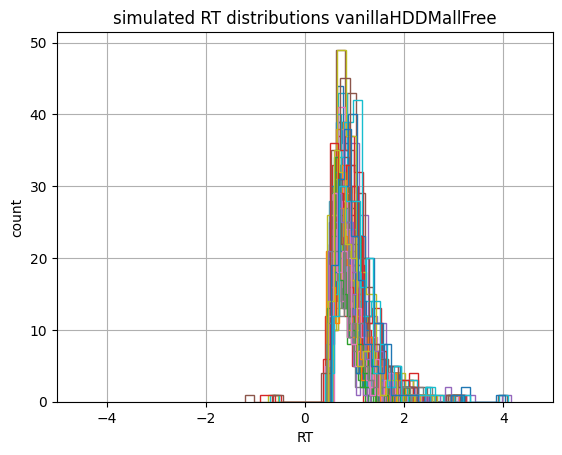

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111, xlabel='RT', ylabel='count', title='simulated RT distributions vanillaHDDMallFree')
for i, subj_data in vanillaHDDMallFree_simData.groupby('participant_id'):
    subj_data.rtPlot.hist(bins=20, histtype='step', ax=ax)

plt.xlim(-5,5)   
plt.savefig('ssms_subRT_dist_vanillaAllFreeParams.pdf')


#### a fixed 

In [60]:
HDDMaFixed_simData['response'].unique()

array([1.])

In [61]:
HDDMaFixed_simData['rtPlot']=HDDMaFixed_simData['rt']

In [62]:
HDDMaFixed_simData.loc[HDDMaFixed_simData['response'] == -1,'rtPlot']=HDDMaFixed_simData.loc[HDDMaFixed_simData['response'] == -1,'rtPlot']*-1

In [63]:
HDDMaFixed_simData.loc[HDDMaFixed_simData['response'] == -1,'rtPlot']

Series([], Name: rtPlot, dtype: float64)

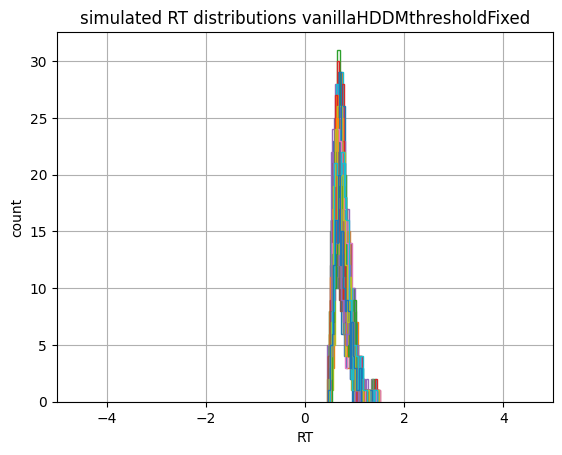

In [64]:
fig = plt.figure()
ax = fig.add_subplot(111, xlabel='RT', ylabel='count', title='simulated RT distributions vanillaHDDMthresholdFixed')
for i, subj_data in HDDMaFixed_simData.groupby('participant_id'):
    subj_data.rtPlot.hist(bins=20, histtype='step', ax=ax)

plt.xlim(-5,5)   
plt.savefig('ssms_subRT_dist_vanillaThreshFixedParams.pdf')


#### a fixed neural regressor

In [65]:
HDDMaFixedPupilInsula_simData['response'].unique()

array([ 1., -1.])

In [68]:
HDDMaFixedPupilInsula_simData.loc[HDDMaFixedPupilInsula_simData['response']==1]

,participant_id,rt,response,pupil,beta_insula,switch_condition_num
0,42013.0,1.448064,1.0,-0.275299,-0.065556,1.0
1,42013.0,1.208064,1.0,1.874566,0.509185,3.0
2,42013.0,1.119690,1.0,-0.516399,1.049503,2.0
3,42013.0,1.236562,1.0,0.710667,-0.611262,4.0
4,42013.0,1.358916,1.0,0.795430,-0.546911,1.0
...,...,...,...,...,...,...
11079,62433.0,0.867474,1.0,0.761824,-0.901538,1.0
11080,62433.0,0.732104,1.0,-0.115871,0.026958,1.0
11081,62433.0,0.577235,1.0,1.098559,-0.940993,3.0
11082,62433.0,0.480278,1.0,-0.044915,-0.779456,4.0


In [69]:
HDDMaFixedPupilInsula_simData.loc[HDDMaFixedPupilInsula_simData['response']==-1]

,participant_id,rt,response,pupil,beta_insula,switch_condition_num
1866,42153.0,0.403728,-1.0,-0.803789,0.570012,1.0
1867,42153.0,0.403729,-1.0,1.513601,-0.465077,3.0
1868,42153.0,0.403917,-1.0,-0.846015,1.447914,2.0
1869,42153.0,0.403480,-1.0,0.423739,1.023322,4.0
1870,42153.0,0.403802,-1.0,-0.402573,0.130862,1.0
...,...,...,...,...,...,...
9822,62313.0,0.403213,-1.0,0.094008,2.128205,4.0
9823,62313.0,0.403053,-1.0,0.580578,-0.011516,1.0
9824,62313.0,0.403243,-1.0,-0.065797,-0.599624,1.0
9825,62313.0,0.403320,-1.0,0.412339,-1.350466,3.0


In [70]:
HDDMaFixedPupilInsula_simData['rtPlot']=HDDMaFixedPupilInsula_simData['rt']

In [71]:
HDDMaFixedPupilInsula_simData.loc[HDDMaFixedPupilInsula_simData['response'] == -1,'rtPlot']=HDDMaFixedPupilInsula_simData.loc[HDDMaFixedPupilInsula_simData['response'] == -1,'rtPlot']*-1

In [72]:
HDDMaFixedPupilInsula_simData.loc[HDDMaFixedPupilInsula_simData['response'] == -1,'rtPlot']

1866   -0.403728
1867   -0.403729
1868   -0.403917
1869   -0.403480
1870   -0.403802
          ...   
9822   -0.403213
9823   -0.403053
9824   -0.403243
9825   -0.403320
9826   -0.403328
Name: rtPlot, Length: 787, dtype: float64

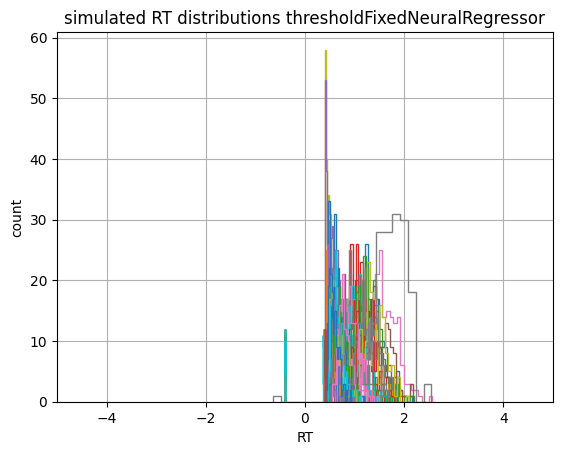

In [73]:
fig = plt.figure()
ax = fig.add_subplot(111, xlabel='RT', ylabel='count', title='simulated RT distributions thresholdFixedNeuralRegressor')
for i, subj_data in HDDMaFixedPupilInsula_simData.groupby('participant_id'):
    subj_data.rtPlot.hist(bins=20, histtype='step', ax=ax)

plt.xlim(-5,5)   
plt.savefig('ssms_subRT_dist_thresholdFixedNeuralRegressorParams.pdf')


### check inference stats

#### vanilla all free

In [75]:
vanillaHDDMallFree_inferenceSimData

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

In [84]:
vanillaHDDMallFree_inferenceSimData_ess = az.ess(vanillaHDDMallFree_inferenceSimData,var_names=['~a','~z','~t'])
vanillaHDDMallFree_inferenceSimData_r_hat = az.rhat(vanillaHDDMallFree_inferenceSimData,var_names=['~a','~z','~t'])
vanillaHDDMallFree_inferenceSimData_r_hat

<xarray.Dataset>
Dimensions:                         (v_1|participant_id__factor_dim: 71,
                                     participant_id__factor_dim: 71)
Coordinates:
  * v_1|participant_id__factor_dim  (v_1|participant_id__factor_dim) <U7 '420...
  * participant_id__factor_dim      (participant_id__factor_dim) <U7 '42013.0...
Data variables:
    v_Intercept                     float64 0.9997
    v_1|participant_id_sigma        float64 1.0
    a_Intercept                     float64 1.001
    a_1|participant_id_sigma        float64 1.001
    z_Intercept                     float64 1.001
    z_1|participant_id_sigma        float64 1.002
    t_Intercept                     float64 1.0
    t_1|participant_id_sigma        float64 1.001
    v_1|participant_id              (v_1|participant_id__factor_dim) float64 ...
    a_1|participant_id              (participant_id__factor_dim) float64 1.0 ...
    z_1|participant_id              (participant_id__factor_dim) float64 1.0 ...
    t_1|participant_id              (participant_id__factor_dim) float64 1.00...

In [34]:
print(vanillaHDDMallFree_inferenceSimData_ess)
print(vanillaHDDMallFree_inferenceSimData_r_hat)


<xarray.Dataset>
Dimensions:                         (v_1|participant_id__factor_dim: 71,
                                     participant_id__factor_dim: 71)
Coordinates:
  * v_1|participant_id__factor_dim  (v_1|participant_id__factor_dim) <U7 '420...
  * participant_id__factor_dim      (participant_id__factor_dim) <U7 '42013.0...
Data variables:
    v_Intercept                     float64 1.9e+04
    v_1|participant_id_sigma        float64 7.88e+03
    a_Intercept                     float64 1.172e+04
    a_1|participant_id_sigma        float64 833.9
    z_Intercept                     float64 1.155e+04
    z_1|participant_id_sigma        float64 1.08e+03
    t_Intercept                     float64 1.383e+04
    t_1|participant_id_sigma        float64 4.463e+03
    v_1|participant_id              (v_1|participant_id__factor_dim) float64 ...
    a_1|participant_id              (participant_id__factor_dim) float64 3.31...
    z_1|participant_id              (participant_id__factor_dim)

In [35]:
az.summary(vanillaHDDMallFree_inferenceSimData,var_names=['~a','~z','~t'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
v_Intercept,2.229,0.031,2.171,2.288,0.000,0.000,19001.0,9496.0,1.0
v_1|participant_id_sigma,0.044,0.026,0.001,0.090,0.000,0.000,7880.0,8690.0,1.0
a_Intercept,2.138,0.434,1.543,2.942,0.005,0.003,11725.0,8405.0,1.0
a_1|participant_id_sigma,0.171,0.089,0.016,0.323,0.003,0.002,834.0,3604.0,1.0
z_Intercept,0.663,0.058,0.561,0.770,0.001,0.000,11549.0,8253.0,1.0
...,...,...,...,...,...,...,...,...,...
t_1|participant_id[62403.0],-0.005,0.016,-0.036,0.025,0.000,0.000,23828.0,8356.0,1.0
t_1|participant_id[62413.0],0.004,0.017,-0.028,0.038,0.000,0.000,25888.0,9055.0,1.0
t_1|participant_id[62423.0],-0.002,0.017,-0.034,0.030,0.000,0.000,24141.0,9078.0,1.0
t_1|participant_id[62433.0],0.009,0.017,-0.022,0.042,0.000,0.000,19899.0,9565.0,1.0


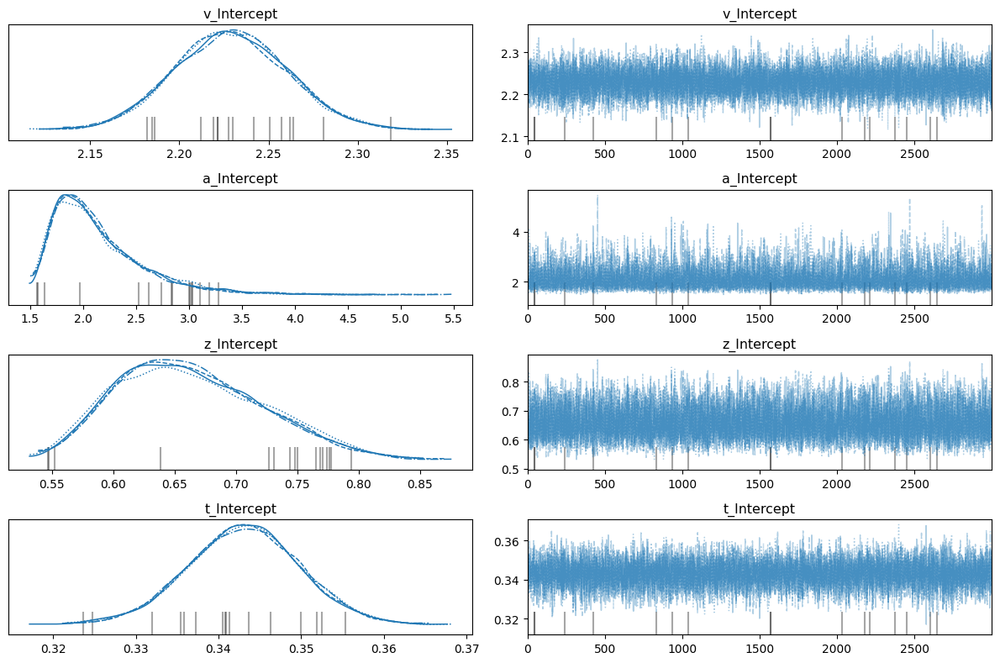

In [37]:
az.plot_trace(
    vanillaHDDMallFree_inferenceSimData,var_names=['v_Intercept','a_Intercept','z_Intercept','t_Intercept']
)
plt.tight_layout()

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

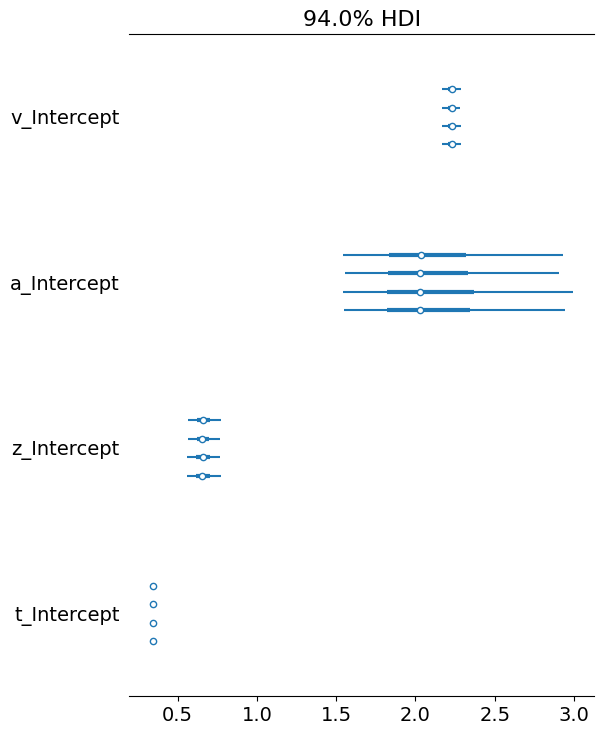

In [38]:
az.plot_forest(vanillaHDDMallFree_inferenceSimData,var_names=['v_Intercept','a_Intercept','z_Intercept','t_Intercept'])

array([[<Axes: ylabel='a_Intercept'>, <Axes: >, <Axes: >],
       [<Axes: ylabel='z_Intercept'>, <Axes: >, <Axes: >],
       [<Axes: xlabel='v_Intercept', ylabel='t_Intercept'>,
        <Axes: xlabel='a_Intercept'>, <Axes: xlabel='z_Intercept'>]],
      dtype=object)

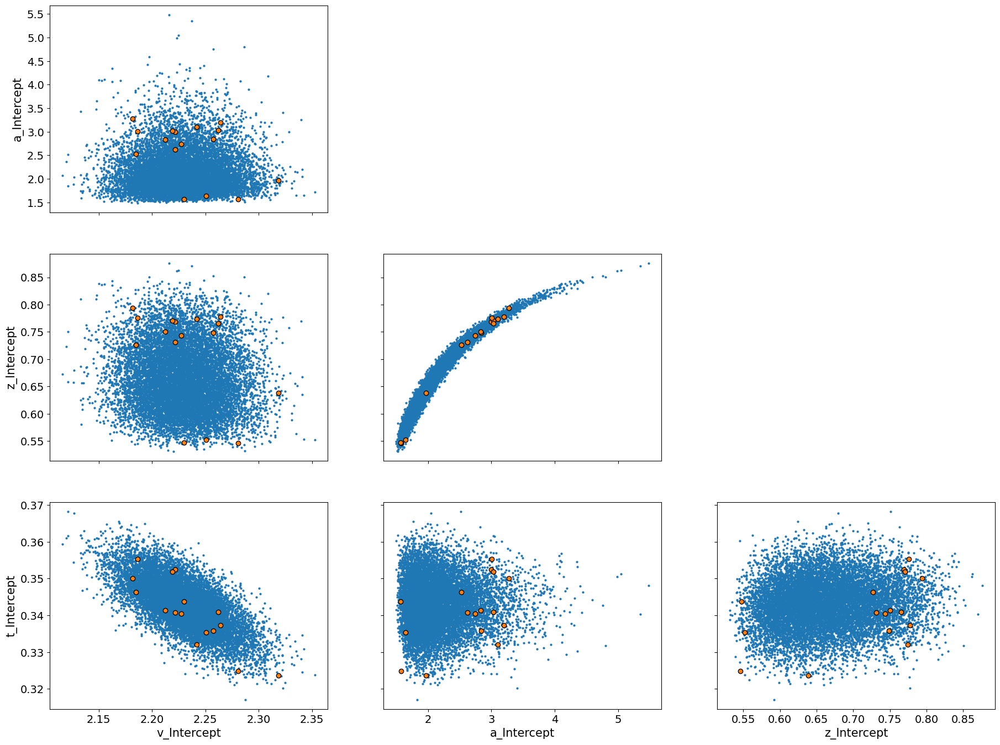

In [81]:
az.plot_pair(vanillaHDDMallFree_inferenceSimData,var_names=['v_Intercept','a_Intercept','z_Intercept','t_Intercept'],divergences=True)

array([[<Axes: ylabel='a_Intercept'>, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >, <Axes: >],
       [<Axes: ylabel='z_Intercept'>, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >, <Axes: >],
       [<Axes: ylabel='t_Intercept'>, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >, <Axes: >],
       [<Axes: ylabel='v_1|participant_id_sigma'>, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >, <Axes: >, <Axes: >],
       [<Axes: ylabel='a_1|participant_id_sigma'>, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >, <Axes: >, <Axes: >],
       [<Axes: ylabel='z_1|participant_id_sigma'>, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >, <Axes: >, <Axes: >],
       [<Axes: xlabel='v_Intercept', ylabel='t_1|participant_id_sigma'>,
        <Axes: xlabel='a_Intercept'>, <Axes: xlabel='z_Intercept'>,
        <Axes: xlabel='t_Intercept'>,
        <Axes: xlabel='v_1|participant_id_sigma'>,
        <Axes: xlabel='a_1|participant_id_sigma'>,
        <Axes: xlabel='z_1|participant

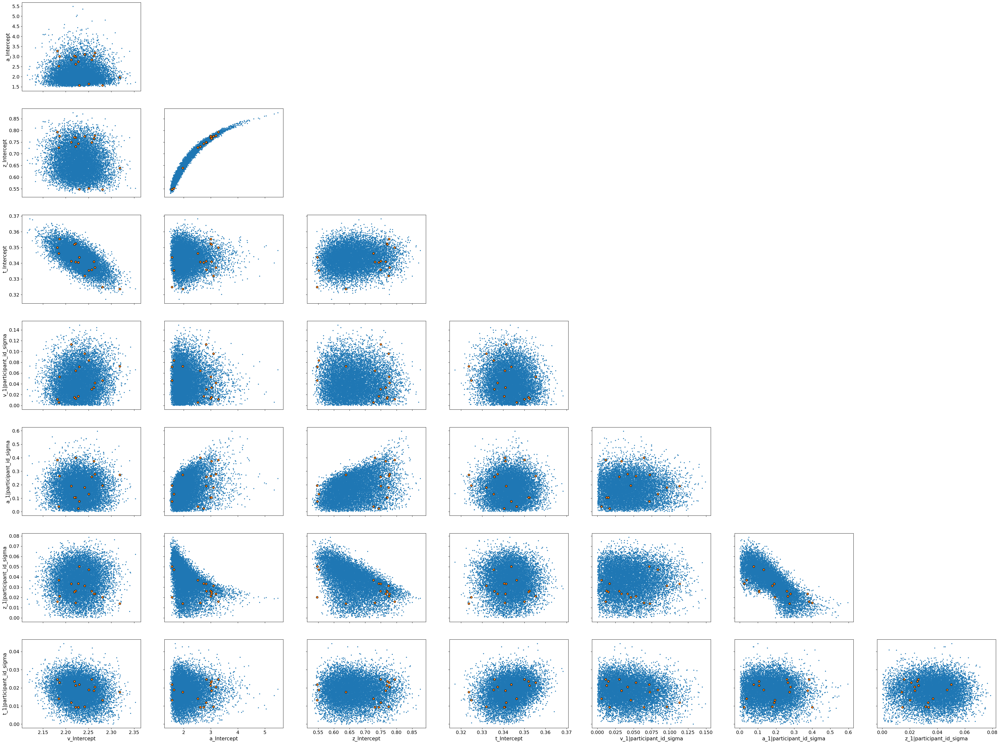

In [82]:
az.plot_pair(vanillaHDDMallFree_inferenceSimData,
             var_names=['v_Intercept',
                        'a_Intercept',
                        'z_Intercept',
                        't_Intercept',
                        'v_1|participant_id_sigma',
                        'a_1|participant_id_sigma',
                        'z_1|participant_id_sigma',
                        't_1|participant_id_sigma',
                       ],
             divergences=True)



#### check vanilla with even choice

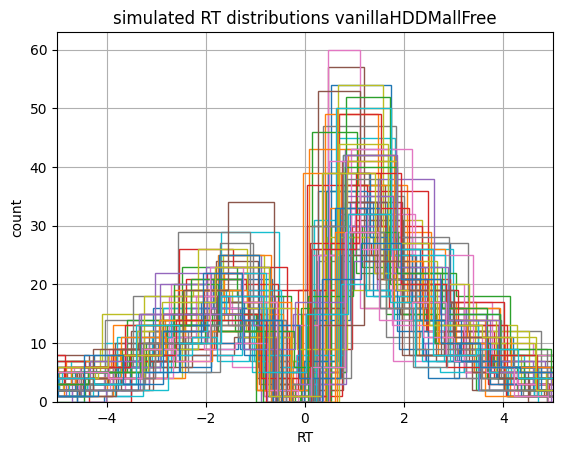

In [91]:
vanillaHDDMallFree_simDataEvenChoice['rtPlot']=vanillaHDDMallFree_simDataEvenChoice['rt']
vanillaHDDMallFree_simDataEvenChoice.loc[vanillaHDDMallFree_simDataEvenChoice['response'] == -1,'rtPlot']=vanillaHDDMallFree_simDataEvenChoice.loc[vanillaHDDMallFree_simDataEvenChoice['response'] == -1,'rtPlot']*-1
vanillaHDDMallFree_simDataEvenChoice.loc[vanillaHDDMallFree_simDataEvenChoice['response'] == -1,'rtPlot']
fig = plt.figure()
ax = fig.add_subplot(111, xlabel='RT', ylabel='count', title='simulated RT distributions vanillaHDDMallFree')
for i, subj_data in vanillaHDDMallFree_simDataEvenChoice.groupby('participant_id'):
    subj_data.rtPlot.hist(bins=20, histtype='step', ax=ax)

plt.xlim(-5,5)   
plt.savefig('ssms_subRT_dist_vanillaAllFreeParamsEvenChoice.pdf')

In [92]:
vanillaHDDMallFree_inferenceSimDataEvenChoice=az.from_netcdf(basepath+'/models/hssm/ssms/inferenceSimDataEvenChoice_simple_ddm_model_hier_all_noPrior.nc')


In [93]:
vanillaHDDMallFree_inferenceSimDataEvenChoice

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

In [94]:
vanillaHDDMallFree_inferenceSimDataEvenChoice_ess = az.ess(vanillaHDDMallFree_inferenceSimDataEvenChoice,var_names=['~a','~z','~t'])
vanillaHDDMallFree_inferenceSimDataEvenChoice_r_hat = az.rhat(vanillaHDDMallFree_inferenceSimDataEvenChoice,var_names=['~a','~z','~t'])
vanillaHDDMallFree_inferenceSimDataEvenChoice_r_hat

<xarray.Dataset>
Dimensions:                         (v_1|participant_id__factor_dim: 71,
                                     participant_id__factor_dim: 71)
Coordinates:
  * v_1|participant_id__factor_dim  (v_1|participant_id__factor_dim) <U7 '420...
  * participant_id__factor_dim      (participant_id__factor_dim) <U7 '42013.0...
Data variables:
    v_Intercept                     float64 1.0
    v_1|participant_id_sigma        float64 1.003
    a_Intercept                     float64 1.0
    a_1|participant_id_sigma        float64 1.001
    z_Intercept                     float64 1.002
    z_1|participant_id_sigma        float64 1.001
    t_Intercept                     float64 0.9998
    t_1|participant_id_sigma        float64 1.002
    v_1|participant_id              (v_1|participant_id__factor_dim) float64 ...
    a_1|participant_id              (participant_id__factor_dim) float64 1.0 ...
    z_1|participant_id              (participant_id__factor_dim) float64 1.0 ...
    t_1|participant_id              (participant_id__factor_dim) float64 1.00...

In [95]:
az.summary(vanillaHDDMallFree_inferenceSimDataEvenChoice,var_names=['~a','~z','~t'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
v_Intercept,0.148,0.010,0.129,0.166,0.0,0.0,15353.0,8379.0,1.0
v_1|participant_id_sigma,0.021,0.012,0.001,0.041,0.0,0.0,3643.0,4980.0,1.0
a_Intercept,1.381,0.012,1.359,1.404,0.0,0.0,4793.0,7092.0,1.0
a_1|participant_id_sigma,0.084,0.010,0.065,0.103,0.0,0.0,4901.0,7237.0,1.0
z_Intercept,0.562,0.009,0.546,0.578,0.0,0.0,2046.0,4489.0,1.0
...,...,...,...,...,...,...,...,...,...
t_1|participant_id[62403.0],-0.010,0.021,-0.049,0.028,0.0,0.0,13298.0,8965.0,1.0
t_1|participant_id[62413.0],0.007,0.023,-0.035,0.054,0.0,0.0,16584.0,8223.0,1.0
t_1|participant_id[62423.0],0.010,0.023,-0.032,0.055,0.0,0.0,14420.0,9352.0,1.0
t_1|participant_id[62433.0],-0.019,0.021,-0.061,0.019,0.0,0.0,8824.0,8533.0,1.0


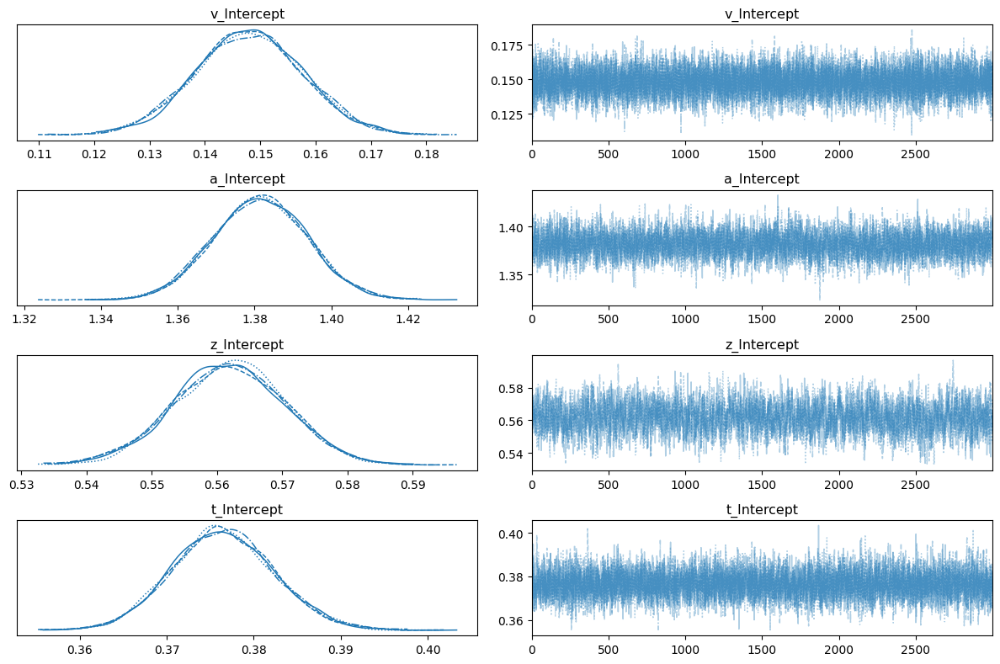

In [96]:
az.plot_trace(
    vanillaHDDMallFree_inferenceSimDataEvenChoice,var_names=['v_Intercept','a_Intercept','z_Intercept','t_Intercept']
)
plt.tight_layout()

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

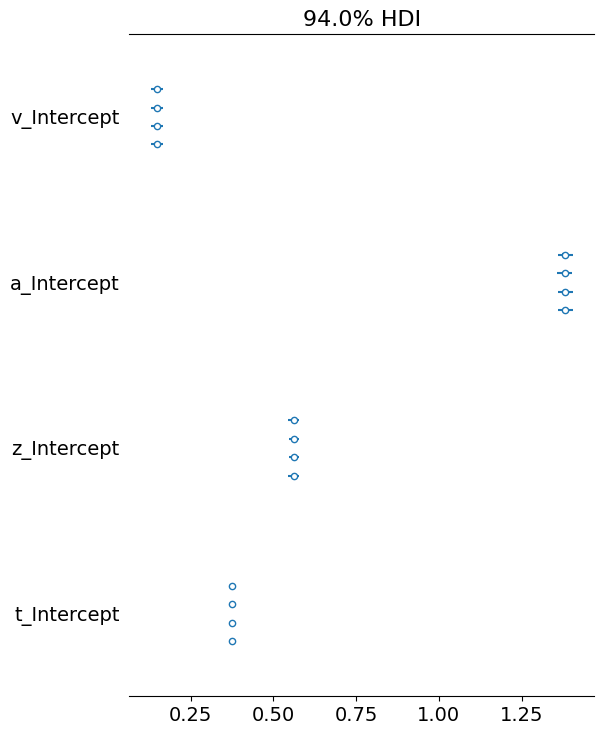

In [97]:
az.plot_forest(vanillaHDDMallFree_inferenceSimDataEvenChoice,var_names=['v_Intercept','a_Intercept','z_Intercept','t_Intercept'])

array([[<Axes: ylabel='a_Intercept'>, <Axes: >, <Axes: >],
       [<Axes: ylabel='z_Intercept'>, <Axes: >, <Axes: >],
       [<Axes: xlabel='v_Intercept', ylabel='t_Intercept'>,
        <Axes: xlabel='a_Intercept'>, <Axes: xlabel='z_Intercept'>]],
      dtype=object)

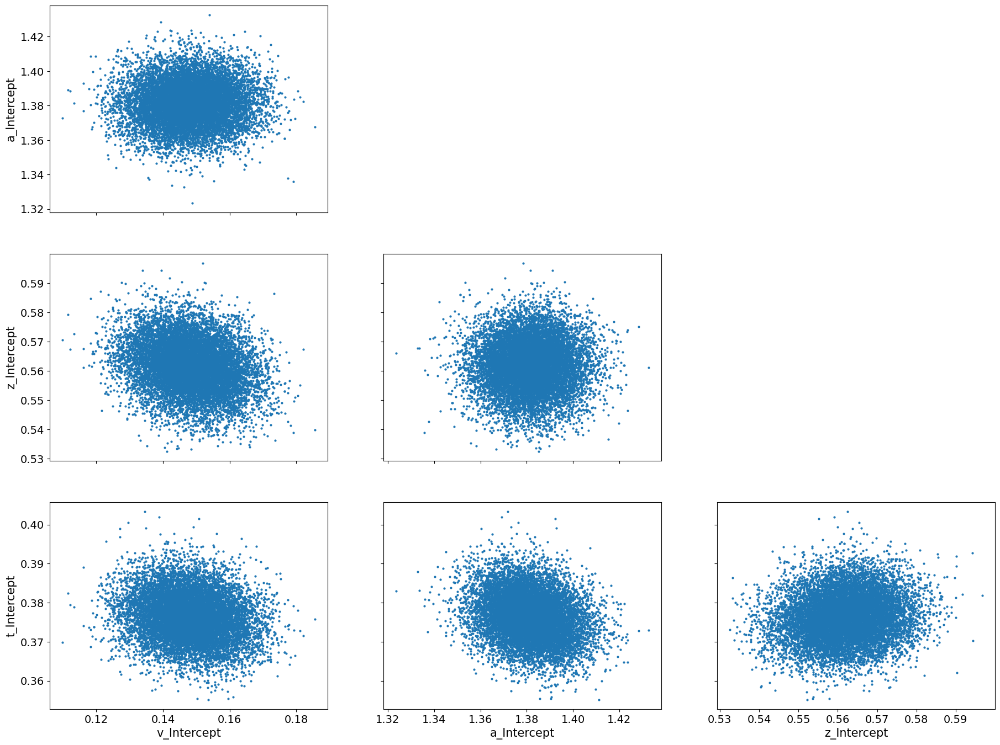

In [ ]:
az.plot_pair(vanillaHDDMallFree_inferenceSimDataEvenChoice,var_names=['v_Intercept','a_Intercept','z_Intercept','t_Intercept'],divergences=True)

array([[<Axes: ylabel='a_Intercept'>, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >, <Axes: >],
       [<Axes: ylabel='z_Intercept'>, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >, <Axes: >],
       [<Axes: ylabel='t_Intercept'>, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >, <Axes: >],
       [<Axes: ylabel='v_1|participant_id_sigma'>, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >, <Axes: >, <Axes: >],
       [<Axes: ylabel='a_1|participant_id_sigma'>, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >, <Axes: >, <Axes: >],
       [<Axes: ylabel='z_1|participant_id_sigma'>, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >, <Axes: >, <Axes: >],
       [<Axes: xlabel='v_Intercept', ylabel='t_1|participant_id_sigma'>,
        <Axes: xlabel='a_Intercept'>, <Axes: xlabel='z_Intercept'>,
        <Axes: xlabel='t_Intercept'>,
        <Axes: xlabel='v_1|participant_id_sigma'>,
        <Axes: xlabel='a_1|participant_id_sigma'>,
        <Axes: xlabel='z_1|participant

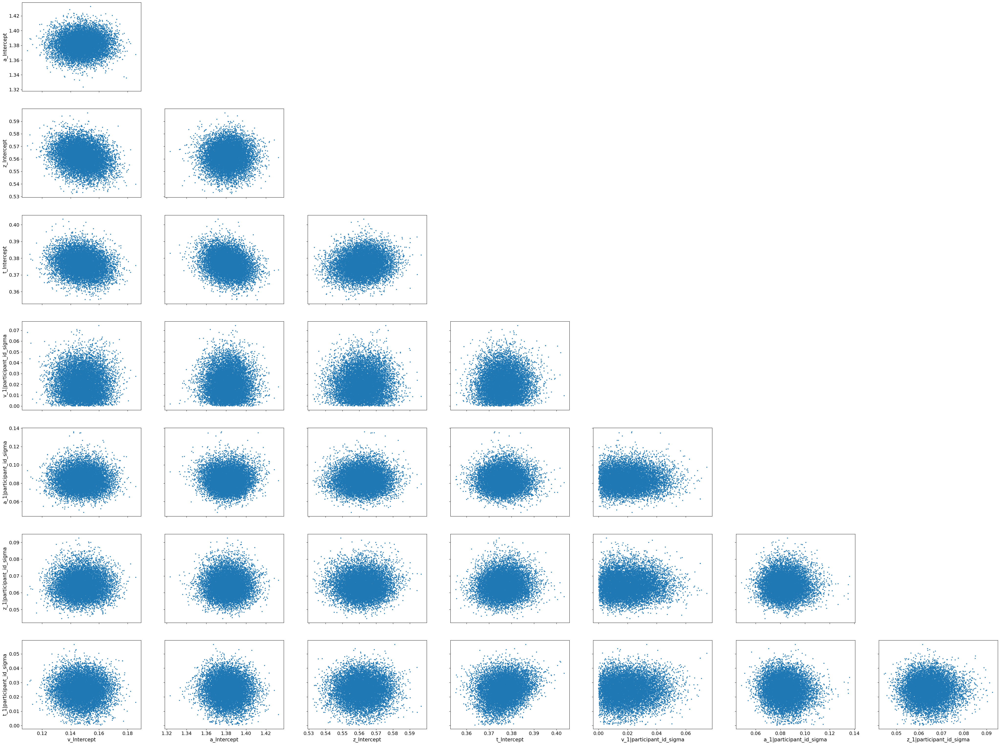

In [ ]:
az.plot_pair(vanillaHDDMallFree_inferenceSimDataEvenChoice,
             var_names=['v_Intercept',
                        'a_Intercept',
                        'z_Intercept',
                        't_Intercept',
                        'v_1|participant_id_sigma',
                        'a_1|participant_id_sigma',
                        'z_1|participant_id_sigma',
                        't_1|participant_id_sigma',
                       ],
             divergences=True)

#### a fixed

In [74]:
HDDMaFixed_inferenceSimData

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

In [77]:
HDDMaFixed_inferenceSimData_ess = az.ess(HDDMaFixed_inferenceSimData,var_names=['~z','~t'])
HDDMaFixed_inferenceSimData_r_hat = az.rhat(HDDMaFixed_inferenceSimData,var_names=['~z','~t'])
HDDMaFixed_inferenceSimData_r_hat

<xarray.Dataset> Size: 5kB
Dimensions:                         (v_1|participant_id__factor_dim: 71,
                                     participant_id__factor_dim: 71)
Coordinates:
  * v_1|participant_id__factor_dim  (v_1|participant_id__factor_dim) <U5 1kB ...
  * participant_id__factor_dim      (participant_id__factor_dim) <U5 1kB '420...
Data variables:
    v_Intercept                     float64 8B 1.09
    v_1|participant_id_sigma        float64 8B 1.035
    z_Intercept                     float64 8B 1.138
    z_1|participant_id_sigma        float64 8B 1.144
    t_Intercept                     float64 8B 1.089
    t_1|participant_id_sigma        float64 8B 1.093
    v_1|participant_id              (v_1|participant_id__factor_dim) float64 568B ...
    z_1|participant_id              (participant_id__factor_dim) float64 568B ...
    t_1|participant_id              (participant_id__factor_dim) float64 568B ...

In [78]:
print(HDDMaFixed_inferenceSimData_ess)
print(HDDMaFixed_inferenceSimData_r_hat)


<xarray.Dataset> Size: 5kB
Dimensions:                         (v_1|participant_id__factor_dim: 71,
                                     participant_id__factor_dim: 71)
Coordinates:
  * v_1|participant_id__factor_dim  (v_1|participant_id__factor_dim) <U5 1kB ...
  * participant_id__factor_dim      (participant_id__factor_dim) <U5 1kB '420...
Data variables:
    v_Intercept                     float64 8B 45.73
    v_1|participant_id_sigma        float64 8B 193.9
    z_Intercept                     float64 8B 20.7
    z_1|participant_id_sigma        float64 8B 22.28
    t_Intercept                     float64 8B 38.37
    t_1|participant_id_sigma        float64 8B 38.6
    v_1|participant_id              (v_1|participant_id__factor_dim) float64 568B ...
    z_1|participant_id              (participant_id__factor_dim) float64 568B ...
    t_1|participant_id              (participant_id__factor_dim) float64 568B ...
<xarray.Dataset> Size: 5kB
Dimensions:                         (v_1|partic

In [79]:
az.summary(HDDMaFixed_inferenceSimData,var_names=['~z','~t'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
v_Intercept,3.991,0.098,3.804,4.163,0.015,0.010,46.0,248.0,1.09
v_1|participant_id_sigma,0.646,0.062,0.537,0.768,0.004,0.003,194.0,273.0,1.03
z_Intercept,0.746,0.011,0.724,0.765,0.002,0.002,21.0,54.0,1.14
z_1|participant_id_sigma,0.057,0.008,0.043,0.071,0.002,0.001,22.0,103.0,1.14
t_Intercept,0.404,0.012,0.381,0.426,0.002,0.001,38.0,280.0,1.09
...,...,...,...,...,...,...,...,...,...
t_1|participant_id[62403],0.045,0.039,-0.025,0.116,0.003,0.002,173.0,360.0,1.02
t_1|participant_id[62413],0.081,0.048,-0.004,0.178,0.007,0.005,47.0,108.0,1.07
t_1|participant_id[62423],-0.015,0.037,-0.083,0.054,0.003,0.002,110.0,446.0,1.02
t_1|participant_id[62433],0.131,0.035,0.062,0.197,0.003,0.002,144.0,301.0,1.03


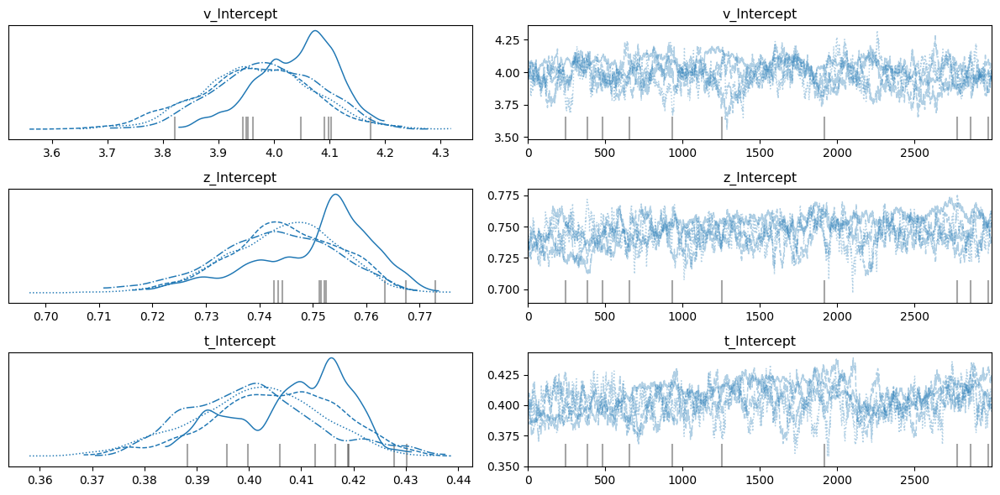

In [80]:
az.plot_trace(
    HDDMaFixed_inferenceSimData,var_names=['v_Intercept','z_Intercept','t_Intercept']
)
plt.tight_layout()

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

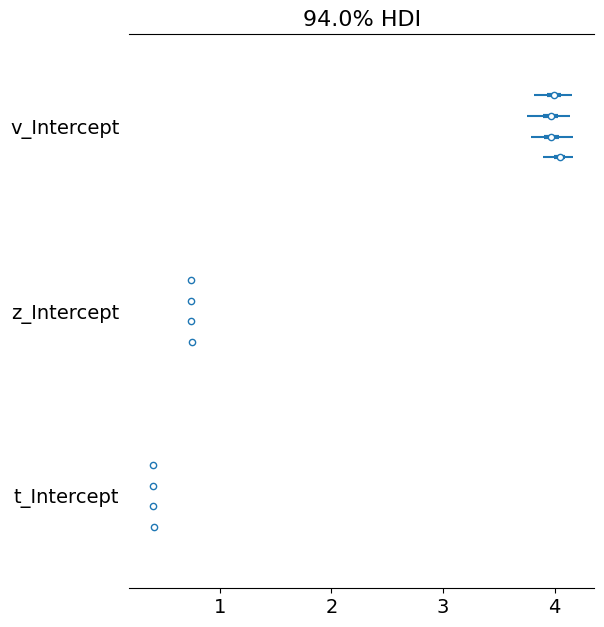

In [81]:
az.plot_forest(HDDMaFixed_inferenceSimData,var_names=['v_Intercept','z_Intercept','t_Intercept'])

array([[<Axes: ylabel='z_Intercept'>, <Axes: >],
       [<Axes: xlabel='v_Intercept', ylabel='t_Intercept'>,
        <Axes: xlabel='z_Intercept'>]], dtype=object)

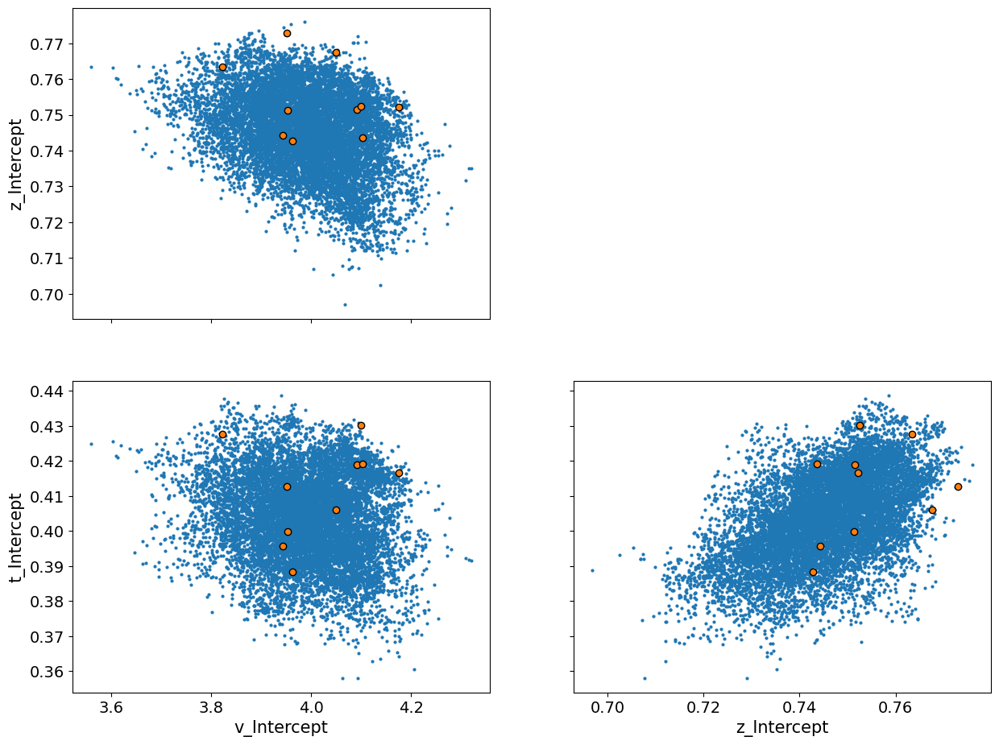

In [82]:
az.plot_pair(HDDMaFixed_inferenceSimData,var_names=['v_Intercept','z_Intercept','t_Intercept'],divergences=True)

array([[<Axes: ylabel='z_Intercept'>, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >],
       [<Axes: ylabel='t_Intercept'>, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >],
       [<Axes: ylabel='v_1|participant_id_sigma'>, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >],
       [<Axes: ylabel='z_1|participant_id_sigma'>, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >],
       [<Axes: xlabel='v_Intercept', ylabel='t_1|participant_id_sigma'>,
        <Axes: xlabel='z_Intercept'>, <Axes: xlabel='t_Intercept'>,
        <Axes: xlabel='v_1|participant_id_sigma'>,
        <Axes: xlabel='z_1|participant_id_sigma'>]], dtype=object)

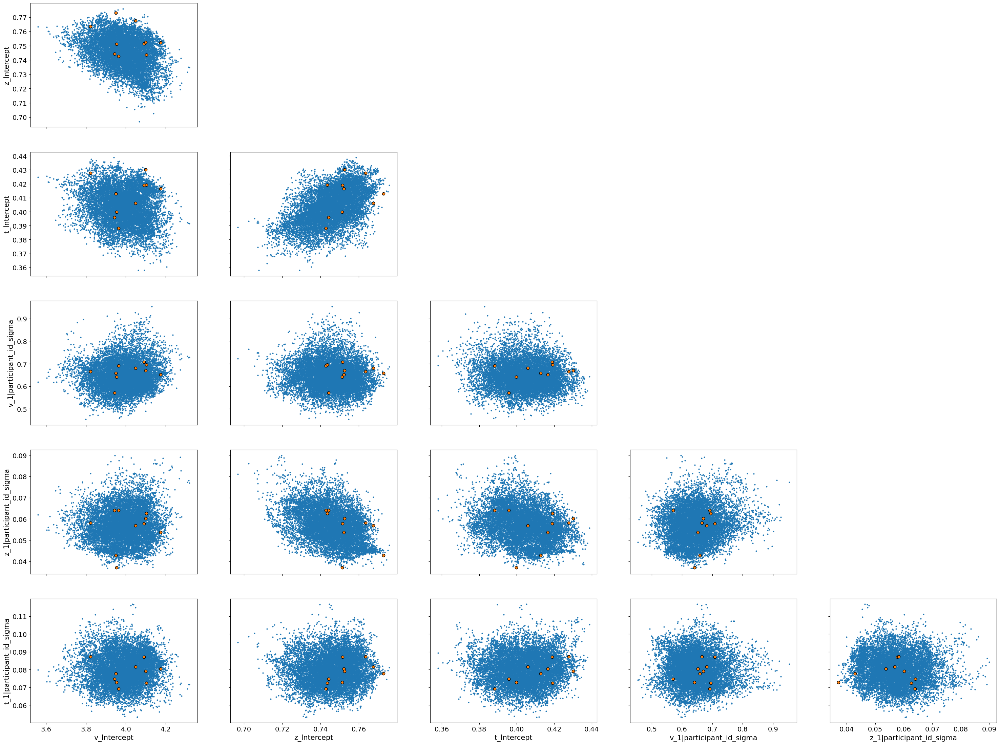

In [83]:
az.plot_pair(HDDMaFixed_inferenceSimData,
             var_names=['v_Intercept',
                        'z_Intercept',
                        't_Intercept',
                        'v_1|participant_id_sigma',
                        'z_1|participant_id_sigma',
                        't_1|participant_id_sigma',
                       ],
             divergences=True)



#### a fixed neural regressor

In [84]:
HDDMaFixedPupilInsula_inferenceSimData

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

In [85]:
HDDMaFixedPupilInsula_inferenceSimData_ess = az.ess(HDDMaFixedPupilInsula_inferenceSimData,var_names=['~z','~t'])
HDDMaFixedPupilInsula_inferenceSimData_r_hat = az.rhat(HDDMaFixedPupilInsula_inferenceSimData,var_names=['~z','~t'])
HDDMaFixedPupilInsula_inferenceSimData_r_hat

<xarray.Dataset> Size: 7kB
Dimensions:                                      (
                                                  v_1|participant_id__factor_dim: 71,
                                                  participant_id__factor_dim: 71)
Coordinates:
  * v_1|participant_id__factor_dim               (v_1|participant_id__factor_dim) <U7 2kB ...
  * participant_id__factor_dim                   (participant_id__factor_dim) <U7 2kB ...
Data variables: (12/18)
    v_Intercept                                  float64 8B 5.573e+15
    z_switch_condition_num|participant_id_mu     float64 8B 3.772
    z_pupil|participant_id_mu                    float64 8B 3.137
    z_beta_insula|participant_id_mu              float64 8B 3.085
    v_1|participant_id_sigma                     float64 8B 5.573e+15
    z_Intercept                                  float64 8B 3.341
    ...                                           ...
    v_1|participant_id                           (v_1|participant_id__factor_dim) float64 568B ...
    z_1|participant_id                           (participant_id__factor_dim) float64 568B ...
    z_switch_condition_num|participant_id        (participant_id__factor_dim) float64 568B ...
    z_pupil|participant_id                       (participant_id__factor_dim) float64 568B ...
    z_beta_insula|participant_id                 (participant_id__factor_dim) float64 568B ...
    t_1|participant_id                           (participant_id__factor_dim) float64 568B ...

In [87]:
print(HDDMaFixedPupilInsula_inferenceSimData_ess)
print(HDDMaFixedPupilInsula_inferenceSimData_r_hat)


<xarray.Dataset> Size: 7kB
Dimensions:                                      (
                                                  v_1|participant_id__factor_dim: 71,
                                                  participant_id__factor_dim: 71)
Coordinates:
  * v_1|participant_id__factor_dim               (v_1|participant_id__factor_dim) <U7 2kB ...
  * participant_id__factor_dim                   (participant_id__factor_dim) <U7 2kB ...
Data variables: (12/18)
    v_Intercept                                  float64 8B 4.011
    z_switch_condition_num|participant_id_mu     float64 8B 4.341
    z_pupil|participant_id_mu                    float64 8B 4.485
    z_beta_insula|participant_id_mu              float64 8B 4.628
    v_1|participant_id_sigma                     float64 8B 4.011
    z_Intercept                                  float64 8B 4.463
    ...                                           ...
    v_1|participant_id                           (v_1|participant_id__factor_dim) f

In [89]:
az.summary(HDDMaFixedPupilInsula_inferenceSimData,var_names=['~z','~t'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
v_Intercept,2.376,0.032,2.351,2.430,0.016,0.012,4.0,4.0,5.573330e+15
z_switch_condition_num|participant_id_mu,0.002,0.026,-0.033,0.037,0.013,0.010,4.0,13.0,3.770000e+00
z_pupil|participant_id_mu,-0.003,0.013,-0.018,0.010,0.007,0.005,4.0,13.0,3.140000e+00
z_beta_insula|participant_id_mu,0.013,0.028,-0.017,0.059,0.014,0.011,5.0,11.0,3.090000e+00
v_1|participant_id_sigma,0.264,0.003,0.260,0.268,0.002,0.001,4.0,4.0,5.573330e+15
...,...,...,...,...,...,...,...,...,...
t_1|participant_id[62403.0],0.009,0.016,-0.005,0.042,0.007,0.006,4.0,18.0,3.300000e+00
t_1|participant_id[62413.0],0.001,0.004,-0.005,0.006,0.002,0.001,4.0,20.0,3.470000e+00
t_1|participant_id[62423.0],0.004,0.013,-0.008,0.025,0.007,0.005,4.0,13.0,3.980000e+00
t_1|participant_id[62433.0],0.001,0.010,-0.010,0.013,0.005,0.004,5.0,14.0,2.490000e+00


/home/mpib/tli/.conda/envs/hssm_test/lib/python3.11/site-packages/arviz/stats/density_utils.py:488: UserWarning: Your data appears to have a single value or no finite values
  warnings.warn("Your data appears to have a single value or no finite values")
/home/mpib/tli/.conda/envs/hssm_test/lib/python3.11/site-packages/arviz/stats/density_utils.py:488: UserWarning: Your data appears to have a single value or no finite values
  warnings.warn("Your data appears to have a single value or no finite values")


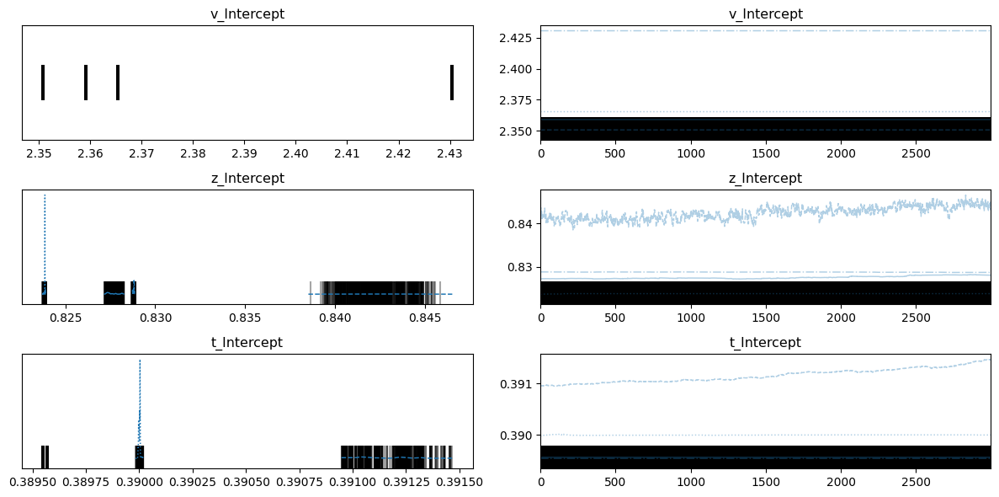

In [91]:
az.plot_trace(
    HDDMaFixedPupilInsula_inferenceSimData,var_names=['v_Intercept','z_Intercept','t_Intercept']
)
plt.tight_layout()

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

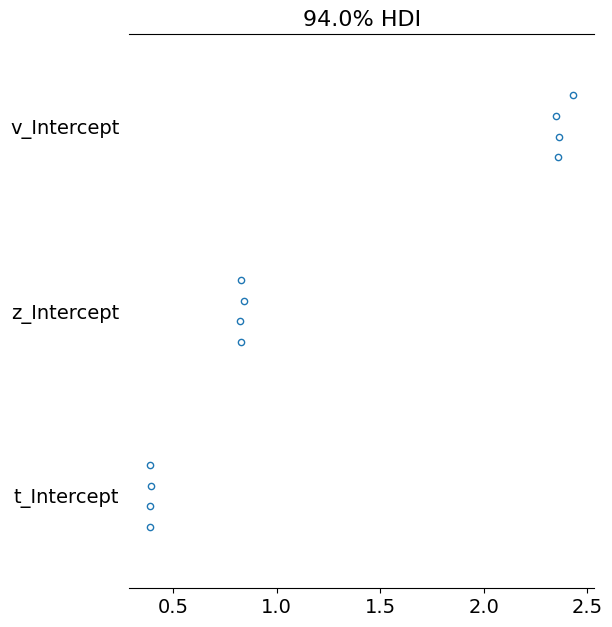

In [92]:
az.plot_forest(HDDMaFixedPupilInsula_inferenceSimData,var_names=['v_Intercept','z_Intercept','t_Intercept'])

array([[<Axes: ylabel='z_Intercept'>, <Axes: >],
       [<Axes: xlabel='v_Intercept', ylabel='t_Intercept'>,
        <Axes: xlabel='z_Intercept'>]], dtype=object)

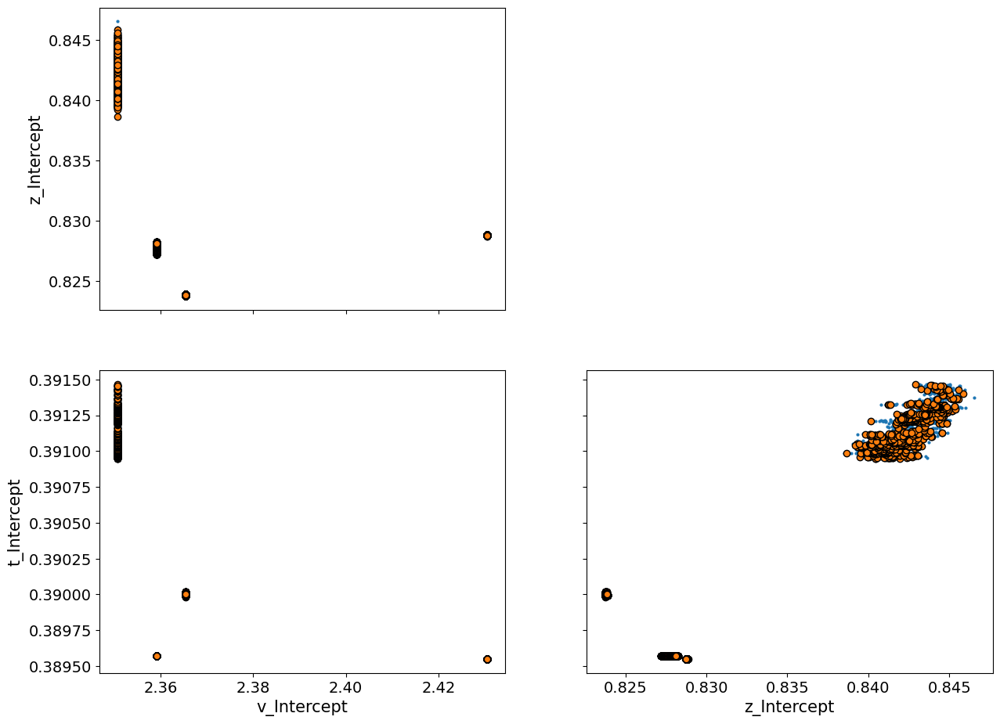

In [93]:
az.plot_pair(HDDMaFixedPupilInsula_inferenceSimData,var_names=['v_Intercept','z_Intercept','t_Intercept'],divergences=True)

array([[<Axes: ylabel='z_Intercept'>, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >],
       [<Axes: ylabel='t_Intercept'>, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >],
       [<Axes: ylabel='v_1|participant_id_sigma'>, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >],
       [<Axes: ylabel='z_1|participant_id_sigma'>, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >],
       [<Axes: xlabel='v_Intercept', ylabel='t_1|participant_id_sigma'>,
        <Axes: xlabel='z_Intercept'>, <Axes: xlabel='t_Intercept'>,
        <Axes: xlabel='v_1|participant_id_sigma'>,
        <Axes: xlabel='z_1|participant_id_sigma'>]], dtype=object)

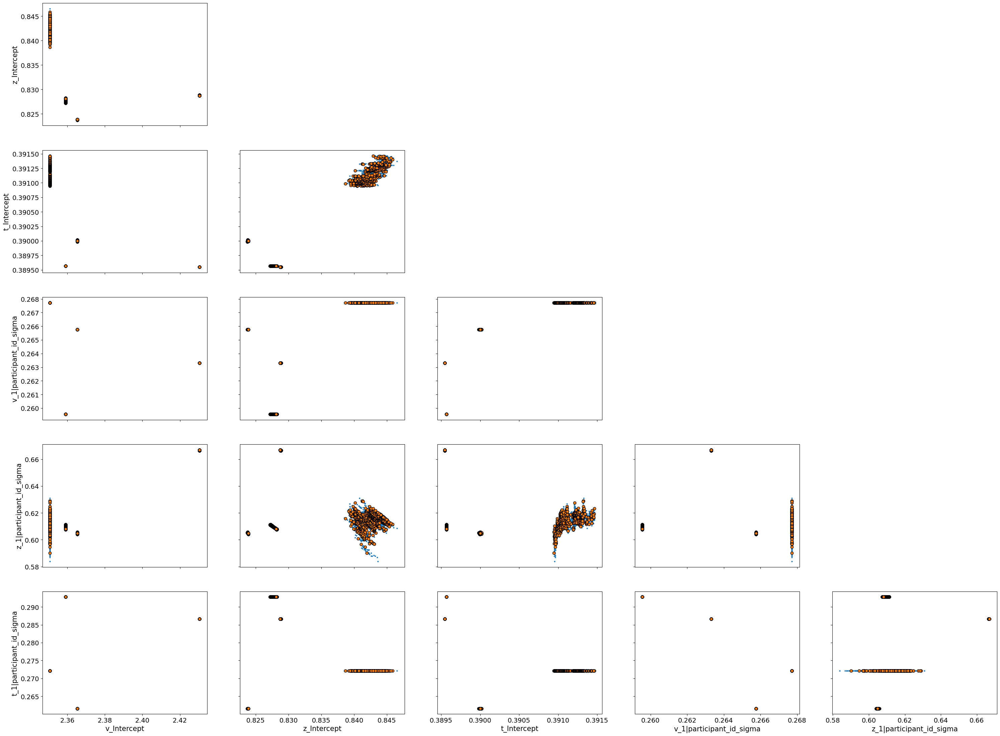

In [94]:
az.plot_pair(HDDMaFixedPupilInsula_inferenceSimData,
             var_names=['v_Intercept',
                        'z_Intercept',
                        't_Intercept',
                        'v_1|participant_id_sigma',
                        'z_1|participant_id_sigma',
                        't_1|participant_id_sigma',
                       ],
             divergences=True)



# helps

In [131]:
help(hssm.HSSM.sample)

Help on function sample in module hssm.hssm:

sample(self, sampler: Optional[Literal['mcmc', 'nuts_numpyro', 'nuts_blackjax', 'laplace', 'vi']] = None, init: str | None = None, **kwargs) -> arviz.data.inference_data.InferenceData | pymc.variational.opvi.Approximation
    Perform sampling using the `fit` method via bambi.Model.
    
    Parameters
    ----------
    sampler
        The sampler to use. Can be one of "mcmc", "nuts_numpyro",
        "nuts_blackjax", "laplace", or "vi". If using `blackbox` likelihoods,
        this cannot be "nuts_numpyro" or "nuts_blackjax". By default it is None, and
        sampler will automatically be chosen: when the model uses the
        `approx_differentiable` likelihood, and `jax` backend, "nuts_numpyro" will
        be used. Otherwise, "mcmc" (the default PyMC NUTS sampler) will be used.
    init: optional
        Initialization method to use for the sampler. If any of the NUTS samplers
        is used, defaults to `"adapt_diag"`. Otherwise, defa

In [70]:
help(hssm.utils)

Help on module hssm.utils in hssm:

NAME
    hssm.utils - Utility functions and classes.

DESCRIPTION
    HSSM has to reconcile with two representations: it's own representation as an HSSM and
    the representation acceptable to Bambi. The two are not equivalent. This file contains
    the Param class that reconcile these differences.
    
    The Param class is an abstraction that stores the parameter specifications and turns
    these representations in Bambi-compatible formats through convenience function
    _parse_bambi().

CLASSES
    pymc.model_graph.ModelGraph(builtins.object)
        HSSMModelGraph
    
    class HSSMModelGraph(pymc.model_graph.ModelGraph)
     |  HSSMModelGraph(model, parent)
     |  
     |  Customize PyMC's ModelGraph class to inject the missing parent parameter.
     |  
     |  Notes
     |  -----
     |  This is really a hack. There might be better ways to get around the
     |  parent parameter issue.
     |  
     |  Method resolution order:
     |   

In [113]:
help(hssm.HSSM.sample)

Help on function sample in module hssm.hssm:

sample(self, sampler: Optional[Literal['mcmc', 'nuts_numpyro', 'nuts_blackjax', 'laplace', 'vi']] = None, init: str | None = None, **kwargs) -> arviz.data.inference_data.InferenceData | pymc.variational.opvi.Approximation
    Perform sampling using the `fit` method via bambi.Model.
    
    Parameters
    ----------
    sampler
        The sampler to use. Can be one of "mcmc", "nuts_numpyro",
        "nuts_blackjax", "laplace", or "vi". If using `blackbox` likelihoods,
        this cannot be "nuts_numpyro" or "nuts_blackjax". By default it is None, and
        sampler will automatically be chosen: when the model uses the
        `approx_differentiable` likelihood, and `jax` backend, "nuts_numpyro" will
        be used. Otherwise, "mcmc" (the default PyMC NUTS sampler) will be used.
    init: optional
        Initialization method to use for the sampler. If any of the NUTS samplers
        is used, defaults to `"adapt_diag"`. Otherwise, defa

In [129]:
help(hssm.HSSM)

Help on class HSSM in module hssm.hssm:

class HSSM(builtins.object)
 |  HSSM(data: pandas.core.frame.DataFrame, model: Union[Literal['ddm', 'ddm_sdv', 'full_ddm', 'angle', 'levy', 'ornstein', 'weibull', 'race_no_bias_angle_4', 'ddm_seq2_no_bias'], str] = 'ddm', include: list[dict | hssm.param.Param] | None = None, model_config: hssm.config.ModelConfig | dict | None = None, loglik: Union[str, os.PathLike, Callable, pytensor.graph.op.Op, type[pymc.distributions.distribution.Distribution], NoneType] = None, loglik_kind: Optional[Literal['analytical', 'approx_differentiable', 'blackbox']] = None, p_outlier: float | dict | bambi.priors.prior.Prior | None = 0.05, lapse: dict | bambi.priors.prior.Prior | None = Uniform(lower: 0.0, upper: 10.0), hierarchical: bool = False, link_settings: Optional[Literal['log_logit']] = None, prior_settings: Optional[Literal['safe']] = None, extra_namespace: dict[str, typing.Any] | None = None, **kwargs)
 |  
 |  The Hierarchical Sequential Sampling Model (HS

In [13]:
help(simulator)

Help on module ssms.basic_simulators.simulator in ssms.basic_simulators:

NAME
    ssms.basic_simulators.simulator

FUNCTIONS
    bin_arbitrary_fptd(out=None, bin_dt=0.04, nbins=256, nchoices=2, choice_codes=[-1.0, 1.0], max_t=10.0)
        Takes in simulator output and returns a histogram of bin counts
        Arguments
        ---------
            out: tuple
                Output of the 'simulator' function
            bin_dt : float
                If nbins is 0, this determines the desired bin size
                which in turn automatically determines the resulting number of bins.
            nbins : int
                Number of bins to bin reaction time data into.
                If supplied as 0, bin_dt instead determines the number of
                bins automatically.
            nchoices: int <default=2>
                Number of choices allowed by the simulator.
            choice_codes = list <default=[-1.0, 1.0]
                Choice labels to be used.
            max

In [79]:
help(az.plot_pair)

Help on function plot_pair in module arviz.plots.pairplot:

plot_pair(data, group='posterior', var_names: Optional[List[str]] = None, filter_vars: Optional[str] = None, combine_dims=None, coords=None, marginals=False, figsize=None, textsize=None, kind: Union[str, List[str]] = 'scatter', gridsize='auto', divergences=False, colorbar=False, labeller=None, ax=None, divergences_kwargs=None, scatter_kwargs=None, kde_kwargs=None, hexbin_kwargs=None, backend=None, backend_kwargs=None, marginal_kwargs=None, point_estimate=None, point_estimate_kwargs=None, point_estimate_marker_kwargs=None, reference_values=None, reference_values_kwargs=None, show=None)
    Plot a scatter, kde and/or hexbin matrix with (optional) marginals on the diagonal.
    
    Parameters
    ----------
    data: obj
        Any object that can be converted to an :class:`arviz.InferenceData` object.
        Refer to documentation of :func:`arviz.convert_to_dataset` for details
    group: str, optional
        Specifies which

In [33]:
help(ssms.config.model_config)

Help on dict object:

class dict(object)
 |  dict() -> new empty dictionary
 |  dict(mapping) -> new dictionary initialized from a mapping object's
 |      (key, value) pairs
 |  dict(iterable) -> new dictionary initialized as if via:
 |      d = {}
 |      for k, v in iterable:
 |          d[k] = v
 |  dict(**kwargs) -> new dictionary initialized with the name=value pairs
 |      in the keyword argument list.  For example:  dict(one=1, two=2)
 |  
 |  Built-in subclasses:
 |      StgDict
 |  
 |  Methods defined here:
 |  
 |  __contains__(self, key, /)
 |      True if the dictionary has the specified key, else False.
 |  
 |  __delitem__(self, key, /)
 |      Delete self[key].
 |  
 |  __eq__(self, value, /)
 |      Return self==value.
 |  
 |  __ge__(self, value, /)
 |      Return self>=value.
 |  
 |  __getattribute__(self, name, /)
 |      Return getattr(self, name).
 |  
 |  __getitem__(...)
 |      x.__getitem__(y) <==> x[y]
 |  
 |  __gt__(self, value, /)
 |      Return self>va

# Tests

In [12]:
# Basics
import os
import sys
import time
from matplotlib import pyplot as plt
import arviz as az  # Visualization
import numpy as np
import pandas as pd
import pathlib
import seaborn
from pathlib import Path 
from scipy import stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
from patsy import dmatrix
from ssms.basic_simulators.simulator import simulator
import bambi as bmb
from pandas.api.types import CategoricalDtype

import pytensor  # Graph-based tensor library
import hssm

# Set float type to float32 to avoid a current bug in PyMC mentioned above
# This will not be necessary in the future
hssm.set_floatX("float32")
from jax.config import config

config.update("jax_enable_x64", False)


basepath = '/mnt/beegfs/home/tli/oddballLearningMPIB'

# Check whether save directories exist; if not, create them
pathlib.Path(basepath+'/models/hssm/').mkdir(parents=True, exist_ok=True)
pathlib.Path(basepath+'/results/hssm/').mkdir(parents=True, exist_ok=True)
pathlib.Path(basepath+'/plots/hssm/').mkdir(parents=True, exist_ok=True)
pathlib.Path(basepath+'/ppc/hssm/').mkdir(parents=True, exist_ok=True)
pathlib.Path(basepath+'/models/hssm/ssms').mkdir(parents=True, exist_ok=True)


df = pd.read_csv(basepath+'/data/OB_singletrial_YAOA.csv')

df['response'] = df['accuracy']
# And then modify the 'response' column where the condition is met
df.loc[df['response'] == 0, 'response'] = -1

df.rename(columns={'reactiontime': 'rt'}, inplace=True)
df.rename(columns={'id': 'participant_id'}, inplace=True)

oddballDataDay2 = df[df['response'].notna()]

data=oddballDataDay2[:]
dataForModel = data[data['pupil'].notna()]

dataForModel = dataForModel.copy()
dataForModel = dataForModel[dataForModel['beta_insula'].notna()]

dataForModel = dataForModel.copy()
dataForModel = dataForModel[dataForModel['switch_condition_num'].notna()]


dataForModel['switch_condition_num']=isinstance(dataForModel['switch_condition_num'].dtype, CategoricalDtype)

day2SubList=dataForModel['participant_id'].unique()

HDDMaFixedPupilInsula_simData=pd.DataFrame();
for sub in range(len(day2SubList)):
    
    idNum=day2SubList[sub]
    
    # figure out trial number from real data for the sub to determine sample numbers in the simulator
    trialNum=len(dataForModel.loc[dataForModel['participant_id'] == idNum])
    
    idCol=pd.DataFrame({'participant_id': [idNum] * trialNum})

    # Specify parameters based on gaussians using stats from the model fit with real data
    v_true, a_true, z_true, t_true, z_switch_condition_num, z_pupil, z_beta_insula = [np.random.normal(4.155,0.097), 
                                                                                      3.47, 
                                                                                      np.random.normal(0.801,0.008),
                                                                                      np.random.normal(0.399,0.014),
                                                                                      np.random.normal(0.012,0.241),
                                                                                      np.random.normal(0.025,0.237),
                                                                                      np.random.normal(0.014,0.251),
                                                                                     ]
    
    # get pupil and insula data form real data as z covariates
    pupilData=pd.array(dataForModel['pupil'].loc[dataForModel['participant_id']== idNum])
    insulaData=pd.array(dataForModel['beta_insula'].loc[dataForModel['participant_id']== idNum])
    
    # get trial switch condition data form real data as z covariates
    switchCondition=pd.array(dataForModel['switch_condition_num'].loc[dataForModel['participant_id']== idNum])
    
    # z changes trial wise
    for trial in range(trialNum):
        z_true_trialwise = z_true+z_switch_condition_num*switchCondition[trial]+z_pupil*pupilData[trial]+z_beta_insula*insulaData[trial]
    
    theta_mat = np.zeros((trialNum, 4))
    theta_mat[:, 0] = v_true
    theta_mat[:, 1] = a_true
    theta_mat[:, 2] = z_true_trialwise
    theta_mat[:, 3] = t_true
    
    # Simulate data
    sim_out = simulator(
        theta=theta_mat,  # parameter list
        model="ddm",  # specify model (many are included in ssms)
        n_samples=1  
    )

    
    
    # Turn into nice dataset
    # Turn data into a pandas dataframe
    subDataset = pd.DataFrame(
        np.column_stack([pd.array(idCol["participant_id"]),sim_out["rts"][:, 0], sim_out["choices"][:, 0],pupilData,insulaData,switchCondition]),
        columns=["participant_id", "rt", "response","pupil","beta_insula","switch_condition_num"],
    )

    HDDMaFixedPupilInsula_simData=pd.concat([HDDMaFixedPupilInsula_simData, subDataset], ignore_index=True)



ddm_model_hier_aFix_dependsSwitch_trialNeuReg = hssm.HSSM(
    data=HDDMaFixedPupilInsula_simData,
    model="ddm",
    a=4.7,
    hierarchical=True,
    include=[
        {
            "name": "z",
            "formula": "z ~ 1 + (1|participant_id)+(switch_condition_num|participant_id)+(pupil|participant_id)+(beta_insula|participant_id)",
            "link": "identity",
        }
    ],    
)

inferenceSimData_simple_ddm_model_hier_aFix_dependsSwitch_trialNeuReg=ddm_model_hier_aFix_dependsSwitch_trialNeuReg.sample(
    sampler="mcmc",
    chains=2,
    cores=6,
    draws=5,
    tune=2,
    idata_kwargs=dict(log_likelihood=True),)

fileName = basepath + '/models/hssm/ssms/inferenceSimData_simple_ddm_model_hier_aFix_dependsSwitch_trialNeuReg.nc'
data = inferenceSimData_simple_ddm_model_hier_aFix_dependsSwitch_trialNeuReg
az.to_netcdf(data, fileName)



Setting PyTensor floatX type to float32.
Setting "jax_enable_x64" to False. If this is not intended, please set `jax` to False.


/tmp/slurm_tli_3262393/ipykernel_3045390/26446883.py:26: DeprecationWarning: Accessing jax.config via the jax.config submodule is deprecated.
  from jax.config import config
Only 5 samples in chain.
Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Multiprocess sampling (2 chains in 6 jobs)
NUTS: [v_Intercept, v_1|participant_id_sigma, v_1|participant_id_offset, z_Intercept, z_1|participant_id_sigma, z_1|participant_id_offset, z_switch_condition_num|participant_id_mu, z_switch_condition_num|participant_id_sigma, z_switch_condition_num|participant_id_offset, z_pupil|participant_id_mu, z_pupil|participant_id_sigma, z_pupil|participant_id_offset, z_beta_insula|participant_id_mu, z_beta_insula|participant_id_sigma, z_beta_insula|participant_id_offset, t_Intercept, t_1|participant_id_sigma, t_1|participant_id_offset]


Sampling 2 chains for 2 tune and 5 draw iterations (4 + 10 draws total) took 0 seconds.
The number of samples is too small to check convergence reliably.


'/mnt/beegfs/home/tli/oddballLearningMPIB/models/hssm/ssms/inferenceSimData_simple_ddm_model_hier_aFix_dependsSwitch_trialNeuReg.nc'

In [10]:
pd.array(idCol["participant_id"])

<NumpyExtensionArray>
[42013, 42013, 42013, 42013, 42013, 42013, 42013, 42013, 42013, 42013,
 ...
 42013, 42013, 42013, 42013, 42013, 42013, 42013, 42013, 42013, 42013]
Length: 158, dtype: int64

In [20]:
# Basics
import os
import sys
import time
from matplotlib import pyplot as plt
import arviz as az  # Visualization
import numpy as np
import pandas as pd
import pathlib
import seaborn
from pathlib import Path 
from scipy import stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
from patsy import dmatrix
from ssms.basic_simulators import simulator
import bambi as bmb

import pytensor  # Graph-based tensor library
import hssm

# Set float type to float32 to avoid a current bug in PyMC mentioned above
# This will not be necessary in the future
hssm.set_floatX("float32")
from jax.config import config

config.update("jax_enable_x64", False)


basepath = '/mnt/beegfs/home/tli/oddballLearningMPIB'

# Check whether save directories exist; if not, create them
pathlib.Path(basepath+'/models/hssm/').mkdir(parents=True, exist_ok=True)
pathlib.Path(basepath+'/results/hssm/').mkdir(parents=True, exist_ok=True)
pathlib.Path(basepath+'/plots/hssm/').mkdir(parents=True, exist_ok=True)
pathlib.Path(basepath+'/ppc/hssm/').mkdir(parents=True, exist_ok=True)


df = pd.read_csv(basepath+'/data/OB_singletrial_YAOA.csv')

df['response'] = df['accuracy']
# And then modify the 'response' column where the condition is met
df.loc[df['response'] == 0, 'response'] = -1

df.rename(columns={'reactiontime': 'rt'}, inplace=True)
df.rename(columns={'id': 'participant_id'}, inplace=True)

oddballDataDay2 = df[df['response'].notna()]

simple_ddm_model_hier_all_noPrior = hssm.HSSM(
    data=oddballDataDay2,
    model="ddm",
    hierarchical=True)

# inferenceData_simple_ddm_model_hier_all_noPrior=simple_ddm_model_hier_all_noPrior.sample(
#     sampler="mcmc",
#     chains=2,
#     cores=5,
#     draws=5,
#     tune=2,
#     idata_kwargs=dict(log_likelihood=True),)

# fileName = basepath + '/models/hssm/inferenceData_simple_ddm_model_hier_all_noPrior.nc'
# data = inferenceData_simple_ddm_model_hier_all_noPrior
# az.to_netcdf(data, fileName)

Setting PyTensor floatX type to float32.
Setting "jax_enable_x64" to False. If this is not intended, please set `jax` to False.


/tmp/slurm_tli_3262393/ipykernel_3045390/277126833.py:25: DeprecationWarning: Accessing jax.config via the jax.config submodule is deprecated.
  from jax.config import config


In [28]:
import pymc as pm
inf_dat = simple_ddm_model_hier_all_noPrior.sample(sampler = 'mcmc', 
                                                   chains = 2,
                                                   cores = 2,
                                                   draws = 10,
                                                   tune = 10,
                                                   step = pm.Slice(model = simple_ddm_model_hier_all_noPrior.pymc_model, w = 0.1
                                                                  ),
                                                  )

Only 10 samples in chain.
Multiprocess sampling (2 chains in 2 jobs)
CompoundStep
>Slice: [v_Intercept]
>Slice: [v_1|participant_id_sigma]
>Slice: [v_1|participant_id_offset]
>Slice: [a_Intercept]
>Slice: [a_1|participant_id_sigma]
>Slice: [a_1|participant_id_offset]
>Slice: [z_Intercept]
>Slice: [z_1|participant_id_sigma]
>Slice: [z_1|participant_id_offset]
>Slice: [t_Intercept]
>Slice: [t_1|participant_id_sigma]
>Slice: [t_1|participant_id_offset]


Sampling 2 chains for 10 tune and 10 draw iterations (20 + 20 draws total) took 302 seconds.
The number of samples is too small to check convergence reliably.


In [29]:
inf_dat


Inference data with groups:
	> posterior
	> sample_stats
	> observed_data

In [17]:
import yaml

# Load the YAML file
with open('hssm_test.yml', 'r') as file:
    env_data_hssm_test = yaml.safe_load(file)

# Print the YAML file in a structured format
print(yaml.dump(env_data_hssm_test, sort_keys=False, default_flow_style=False))

# Load the YAML file
with open('hssm_may_test.yml', 'r') as file:
    env_data_hssm_may_test = yaml.safe_load(file)

# Print the YAML file in a structured format
print(yaml.dump(env_data_hssm_may_test, sort_keys=False, default_flow_style=False))


name: hssm_test
channels:
- conda-forge
- defaults
dependencies:
- _libgcc_mutex=0.1=conda_forge
- _openmp_mutex=4.5=2_kmp_llvm
- arviz=0.18.0=pyhd8ed1ab_0
- atk-1.0=2.38.0=h04ea711_2
- binutils_impl_linux-64=2.40=ha885e6a_0
- binutils_linux-64=2.40=hdade7a5_3
- blas=2.122=openblas
- blas-devel=3.9.0=22_linux64_openblas
- brotli=1.1.0=hd590300_1
- brotli-bin=1.1.0=hd590300_1
- bzip2=1.0.8=hd590300_5
- c-ares=1.28.1=hd590300_0
- ca-certificates=2024.2.2=hbcca054_0
- cached-property=1.5.2=hd8ed1ab_1
- cached_property=1.5.2=pyha770c72_1
- cachetools=5.3.3=pyhd8ed1ab_0
- cairo=1.18.0=h3faef2a_0
- certifi=2024.2.2=pyhd8ed1ab_0
- cloudpickle=3.0.0=pyhd8ed1ab_0
- cons=0.4.6=pyhd8ed1ab_0
- contourpy=1.2.1=py311h9547e67_0
- cycler=0.12.1=pyhd8ed1ab_0
- dm-tree=0.1.8=py311h7b78aeb_4
- etuples=0.3.9=pyhd8ed1ab_0
- expat=2.6.2=h59595ed_0
- filelock=3.14.0=pyhd8ed1ab_0
- font-ttf-dejavu-sans-mono=2.37=hab24e00_0
- font-ttf-inconsolata=3.000=h77eed37_0
- font-ttf-source-code-pro=2.038=h77eed37_0
- f

In [19]:
import yaml
from difflib import Differ, unified_diff

def load_yaml_file(file_path):
    with open(file_path, 'r') as file:
        return yaml.safe_load(file)

def dict_to_sorted_str(data):
    """ Convert a dictionary to a sorted string representation for comparison. """
    return yaml.dump(data, sort_keys=True, default_flow_style=False)

# Load the YAML files
env_data_hssm_test = load_yaml_file('hssm_test.yml')
env_data_hssm_may_test = load_yaml_file('hssm_may_test.yml')

# Convert dictionaries to sorted string representations
hssm_test_str = dict_to_sorted_str(env_data_hssm_test)
hssm_may_test_str = dict_to_sorted_str(env_data_hssm_may_test)

# Compare the two environments
differ = Differ()
diff = unified_diff(hssm_test_str.splitlines(), hssm_may_test_str.splitlines(), 
                    fromfile='hssm_test.yml', tofile='hssm_may_test.yml')

# Print the differences
print('\n'.join(diff))


--- hssm_test.yml

+++ hssm_may_test.yml

@@ -1,17 +1,22 @@

 channels:
+- anaconda
 - conda-forge
 - defaults
 dependencies:
 - _libgcc_mutex=0.1=conda_forge
 - _openmp_mutex=4.5=2_kmp_llvm
 - arviz=0.18.0=pyhd8ed1ab_0
+- asttokens=2.0.5=pyhd3eb1b0_0
 - atk-1.0=2.38.0=h04ea711_2
+- backcall=0.2.0=pyhd3eb1b0_0
+- bambi=0.13.0=pyhd8ed1ab_0
 - binutils_impl_linux-64=2.40=ha885e6a_0
 - binutils_linux-64=2.40=hdade7a5_3
 - blas=2.122=openblas
 - blas-devel=3.9.0=22_linux64_openblas
 - brotli=1.1.0=hd590300_1
 - brotli-bin=1.1.0=hd590300_1
+- brotli-python=1.1.0=py311hb755f60_1
 - bzip2=1.0.8=hd590300_5
 - c-ares=1.28.1=hd590300_0
 - ca-certificates=2024.2.2=hbcca054_0
@@ -20,12 +25,19 @@

 - cachetools=5.3.3=pyhd8ed1ab_0
 - cairo=1.18.0=h3faef2a_0
 - certifi=2024.2.2=pyhd8ed1ab_0
+- charset-normalizer=3.3.2=pyhd8ed1ab_0
 - cloudpickle=3.0.0=pyhd8ed1ab_0
+- colorama=0.4.6=pyhd8ed1ab_0
+- coloredlogs=15.0.1=pyhd8ed1ab_3
+- comm=0.2.2=pyhd8ed1ab_0
 - cons=0.4.6=pyhd8ed1ab_0
 - contourpy=1.2.1

In [86]:
round(3 * 0.1, 1)

0.3